## nbsynthetic

In [1]:
import nbsynthetic.data
from nbsynthetic.data import input_data
from nbsynthetic.data_preparation import SmartBrain

df = input_data('UCI_Credit_Card', decimal=',')
SB = SmartBrain() 
df = SB.nbEncode(df) #GAN input data

We have not found empty cells in the dataset, but we have
        removed the columns ['ID'] because are likely id columns or will have
        a very poor predictive performance.


In [3]:
#modeling WGAN
from nbsynthetic.wgan import WGAN
from nbsynthetic.w_synthetic import synthetic_data
newdf = synthetic_data(
    df,
    WGAN, 
    samples= 500,
    n_features = len(df.columns),
    initial_lr = 0.0001, 
    dropout = 0.4, 
    epochs = 30
    )

ValueError: The number of quantiles cannot be greater than the number of samples used. Got 21000 quantiles and 10000 samples.

In [ ]:
newdf

In [8]:
df

,checking_status,duration,credit_history,purpose,credit_amount,savings_status,employment,installment_commitment,personal_status,other_parties,...,property_magnitude,age,other_payment_plans,housing,existing_credits,job,num_dependents,own_telephone,foreign_worker,class
0,1,6,1,6,1169,4,3,4,3,2,...,3,67,1,1,2,1,1,1,1,1
1,0,48,3,6,5951,2,0,2,0,2,...,3,22,1,1,1,1,1,0,1,0
2,3,12,1,2,2096,2,1,2,3,2,...,3,49,1,1,1,3,2,0,1,1
3,1,42,3,3,7882,2,1,2,3,1,...,1,45,1,0,1,1,2,0,1,1
4,1,24,2,4,4870,2,0,3,3,2,...,2,53,1,0,2,1,2,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,12,3,3,1736,2,1,3,0,2,...,3,31,1,1,1,3,1,0,1,1
996,1,30,3,9,3857,2,0,4,1,2,...,1,40,1,1,1,0,1,1,1,1
997,3,12,3,6,804,2,3,4,3,2,...,0,38,1,1,1,1,1,0,1,1
998,1,45,3,6,1845,2,0,4,3,2,...,2,23,1,0,1,1,1,1,1,0


## Evaluating using SDV metrices 

It'll be easy to compare diffferent models(Gaussian copula,CTGAN,VGAN,WGAN) using same metrices

In [5]:
from sdv.metadata import SingleTableMetadata #this is a function that creates metadata, tries to capture the datatypes 
                                              
metadata = SingleTableMetadata()#creating an empty data table
metadata.detect_from_csv(filepath='german_credit_data.csv') 

In [6]:
metadata 

{
    "columns": {
        "checking_status": {
            "sdtype": "categorical"
        },
        "duration": {
            "sdtype": "numerical"
        },
        "credit_history": {
            "sdtype": "categorical"
        },
        "purpose": {
            "sdtype": "categorical"
        },
        "credit_amount": {
            "sdtype": "numerical"
        },
        "savings_status": {
            "sdtype": "categorical"
        },
        "employment": {
            "sdtype": "categorical"
        },
        "installment_commitment": {
            "sdtype": "numerical"
        },
        "personal_status": {
            "sdtype": "categorical"
        },
        "other_parties": {
            "sdtype": "categorical"
        },
        "residence_since": {
            "sdtype": "numerical"
        },
        "property_magnitude": {
            "sdtype": "categorical"
        },
        "age": {
            "sdtype": "numerical"
        },
        "other_payment_plans": 

In [9]:
from sdv.evaluation.single_table import evaluate_quality

quality_report1 = evaluate_quality(
    df,
    newdf,
    metadata
)

Creating report: 100%|███████████████████████████████████████████████████████████████████| 4/4 [00:02<00:00,  1.43it/s]



Overall Quality Score: 50.62%

Properties:
Column Shapes: 55.86%
Column Pair Trends: 45.39%


In [10]:
quality_report1.get_details(property_name='Column Shapes')

,Column,Metric,Quality Score
0,duration,KSComplement,0.2365
1,credit_amount,KSComplement,0.2825
2,installment_commitment,KSComplement,0.4315
3,residence_since,KSComplement,0.3630
4,age,KSComplement,0.2115
5,existing_credits,KSComplement,0.7050
6,num_dependents,KSComplement,0.8330
7,checking_status,TVComplement,0.8135
8,credit_history,TVComplement,0.4640
9,purpose,TVComplement,0.4635


In [12]:
from nbsynthetic.statistics import mmd_rbf, Wilcoxon, Student_t, Kolmogorov_Smirnov
from nbsynthetic.statistics import plot_histograms
plot_histograms(df, newdf)

In [13]:

mmd_rbf(df, newdf, gamma=None)

Maximum Mean Discrepance = 0.02465


In [15]:
#modeling VGAN
from nbsynthetic.vgan import GAN
from nbsynthetic.w_synthetic import synthetic_data
newdf = synthetic_data(
    df,
    GAN, 
    samples= 2000,
    n_features = len(df.columns),
    initial_lr = 0.0001, 
    dropout = 0.4, 
    epochs = 30
    )

  0%|                                                                                           | 0/42 [00:00<?, ?it/s]

1/1 [==============================] - 0s 120ms/step


Epoch (1/30) | D. loss: 0.68 | G. loss: 0.69 |:   2%|8                                  | 1/42 [00:03<02:30,  3.67s/it]

1/1 [==============================] - 0s 20ms/step


Epoch (1/30) | D. loss: 0.68 | G. loss: 0.70 |:   5%|#6                                 | 2/42 [00:03<01:04,  1.62s/it]

1/1 [==============================] - 0s 16ms/step


Epoch (1/30) | D. loss: 0.67 | G. loss: 0.68 |:   7%|##5                                | 3/42 [00:04<00:37,  1.05it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (1/30) | D. loss: 0.67 | G. loss: 0.68 |:  10%|###3                               | 4/42 [00:04<00:24,  1.55it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (1/30) | D. loss: 0.64 | G. loss: 0.67 |:  12%|####1                              | 5/42 [00:04<00:17,  2.11it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (1/30) | D. loss: 0.64 | G. loss: 0.68 |:  14%|#####                              | 6/42 [00:04<00:13,  2.72it/s]

1/1 [==============================] - 0s 18ms/step


Epoch (1/30) | D. loss: 0.64 | G. loss: 0.69 |:  17%|#####8                             | 7/42 [00:04<00:10,  3.33it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (1/30) | D. loss: 0.63 | G. loss: 0.66 |:  19%|######6                            | 8/42 [00:04<00:08,  3.92it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (1/30) | D. loss: 0.62 | G. loss: 0.66 |:  21%|#######5                           | 9/42 [00:05<00:07,  4.35it/s]

1/1 [==============================] - 0s 24ms/step


Epoch (1/30) | D. loss: 0.58 | G. loss: 0.68 |:  24%|########                          | 10/42 [00:05<00:06,  4.80it/s]

1/1 [==============================] - 0s 20ms/step


Epoch (1/30) | D. loss: 0.59 | G. loss: 0.67 |:  26%|########9                         | 11/42 [00:05<00:06,  5.05it/s]

1/1 [==============================] - 0s 21ms/step


Epoch (1/30) | D. loss: 0.59 | G. loss: 0.66 |:  29%|#########7                        | 12/42 [00:05<00:05,  5.32it/s]

1/1 [==============================] - 0s 25ms/step


Epoch (1/30) | D. loss: 0.56 | G. loss: 0.65 |:  31%|##########5                       | 13/42 [00:05<00:05,  5.59it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (1/30) | D. loss: 0.56 | G. loss: 0.63 |:  33%|###########3                      | 14/42 [00:05<00:04,  5.71it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (1/30) | D. loss: 0.55 | G. loss: 0.65 |:  36%|############1                     | 15/42 [00:06<00:04,  5.79it/s]

1/1 [==============================] - 0s 45ms/step


Epoch (1/30) | D. loss: 0.51 | G. loss: 0.66 |:  38%|############9                     | 16/42 [00:06<00:04,  5.72it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (1/30) | D. loss: 0.52 | G. loss: 0.66 |:  40%|#############7                    | 17/42 [00:06<00:04,  5.85it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (1/30) | D. loss: 0.48 | G. loss: 0.64 |:  43%|##############5                   | 18/42 [00:06<00:04,  5.87it/s]

1/1 [==============================] - 0s 22ms/step


Epoch (1/30) | D. loss: 0.50 | G. loss: 0.63 |:  45%|###############3                  | 19/42 [00:06<00:03,  5.94it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (1/30) | D. loss: 0.44 | G. loss: 0.66 |:  48%|################1                 | 20/42 [00:06<00:03,  6.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (1/30) | D. loss: 0.46 | G. loss: 0.65 |:  50%|#################                 | 21/42 [00:07<00:03,  5.96it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (1/30) | D. loss: 0.41 | G. loss: 0.67 |:  52%|#################8                | 22/42 [00:07<00:03,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


Epoch (1/30) | D. loss: 0.42 | G. loss: 0.63 |:  55%|##################6               | 23/42 [00:07<00:03,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (1/30) | D. loss: 0.41 | G. loss: 0.59 |:  57%|###################4              | 24/42 [00:07<00:03,  5.59it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (1/30) | D. loss: 0.39 | G. loss: 0.62 |:  60%|####################2             | 25/42 [00:07<00:03,  5.37it/s]

1/1 [==============================] - 0s 49ms/step


Epoch (1/30) | D. loss: 0.36 | G. loss: 0.62 |:  62%|#####################             | 26/42 [00:07<00:02,  5.41it/s]

1/1 [==============================] - 0s 26ms/step


Epoch (1/30) | D. loss: 0.40 | G. loss: 0.66 |:  64%|#####################8            | 27/42 [00:08<00:02,  5.33it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (1/30) | D. loss: 0.37 | G. loss: 0.63 |:  67%|######################6           | 28/42 [00:08<00:02,  5.03it/s]

1/1 [==============================] - 0s 46ms/step


Epoch (1/30) | D. loss: 0.37 | G. loss: 0.64 |:  69%|#######################4          | 29/42 [00:08<00:02,  4.78it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (1/30) | D. loss: 0.35 | G. loss: 0.62 |:  71%|########################2         | 30/42 [00:08<00:02,  4.78it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (1/30) | D. loss: 0.37 | G. loss: 0.60 |:  74%|#########################         | 31/42 [00:08<00:02,  4.85it/s]

1/1 [==============================] - 0s 24ms/step


Epoch (1/30) | D. loss: 0.34 | G. loss: 0.65 |:  76%|#########################9        | 32/42 [00:09<00:02,  4.83it/s]

1/1 [==============================] - 0s 37ms/step


Epoch (1/30) | D. loss: 0.29 | G. loss: 0.69 |:  79%|##########################7       | 33/42 [00:09<00:01,  4.60it/s]

1/1 [==============================] - 0s 30ms/step


Epoch (1/30) | D. loss: 0.31 | G. loss: 0.64 |:  81%|###########################5      | 34/42 [00:09<00:01,  4.56it/s]

1/1 [==============================] - 0s 37ms/step


Epoch (1/30) | D. loss: 0.30 | G. loss: 0.63 |:  83%|############################3     | 35/42 [00:09<00:01,  4.70it/s]

1/1 [==============================] - 0s 32ms/step


Epoch (1/30) | D. loss: 0.30 | G. loss: 0.66 |:  86%|#############################1    | 36/42 [00:10<00:01,  4.64it/s]

1/1 [==============================] - 0s 32ms/step


Epoch (1/30) | D. loss: 0.32 | G. loss: 0.73 |:  88%|#############################9    | 37/42 [00:10<00:01,  4.49it/s]

1/1 [==============================] - 0s 38ms/step


Epoch (1/30) | D. loss: 0.29 | G. loss: 0.70 |:  90%|##############################7   | 38/42 [00:10<00:00,  4.56it/s]

1/1 [==============================] - 0s 42ms/step


Epoch (1/30) | D. loss: 0.30 | G. loss: 0.76 |:  93%|###############################5  | 39/42 [00:10<00:00,  4.67it/s]

1/1 [==============================] - 0s 37ms/step


Epoch (1/30) | D. loss: 0.31 | G. loss: 0.68 |:  95%|################################3 | 40/42 [00:10<00:00,  4.67it/s]

1/1 [==============================] - 0s 37ms/step


Epoch (1/30) | D. loss: 0.32 | G. loss: 0.68 |:  98%|#################################1| 41/42 [00:11<00:00,  4.74it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (1/30) | D. loss: 0.33 | G. loss: 0.77 |: 100%|##################################| 42/42 [00:12<00:00,  3.42it/s]
  0%|                                                                                           | 0/42 [00:00<?, ?it/s]

1/1 [==============================] - 0s 53ms/step


Epoch (2/30) | D. loss: 0.36 | G. loss: 0.79 |:   2%|8                                  | 1/42 [00:00<00:09,  4.29it/s]

1/1 [==============================] - 0s 38ms/step


Epoch (2/30) | D. loss: 0.33 | G. loss: 0.78 |:   5%|#6                                 | 2/42 [00:00<00:08,  4.47it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (2/30) | D. loss: 0.33 | G. loss: 0.66 |:   7%|##5                                | 3/42 [00:00<00:08,  4.72it/s]

1/1 [==============================] - 0s 43ms/step


Epoch (2/30) | D. loss: 0.37 | G. loss: 0.78 |:  10%|###3                               | 4/42 [00:00<00:08,  4.54it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (2/30) | D. loss: 0.33 | G. loss: 0.68 |:  12%|####1                              | 5/42 [00:01<00:08,  4.57it/s]

1/1 [==============================] - 0s 41ms/step


Epoch (2/30) | D. loss: 0.37 | G. loss: 0.70 |:  14%|#####                              | 6/42 [00:01<00:07,  4.85it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (2/30) | D. loss: 0.37 | G. loss: 0.83 |:  17%|#####8                             | 7/42 [00:01<00:07,  4.91it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (2/30) | D. loss: 0.44 | G. loss: 0.81 |:  19%|######6                            | 8/42 [00:01<00:06,  4.94it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (2/30) | D. loss: 0.42 | G. loss: 0.85 |:  21%|#######5                           | 9/42 [00:01<00:06,  5.06it/s]

1/1 [==============================] - 0s 23ms/step


Epoch (2/30) | D. loss: 0.41 | G. loss: 0.91 |:  24%|########                          | 10/42 [00:02<00:06,  5.22it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (2/30) | D. loss: 0.39 | G. loss: 0.76 |:  26%|########9                         | 11/42 [00:02<00:05,  5.38it/s]

1/1 [==============================] - 0s 18ms/step


Epoch (2/30) | D. loss: 0.32 | G. loss: 0.80 |:  29%|#########7                        | 12/42 [00:02<00:06,  4.89it/s]

1/1 [==============================] - 0s 36ms/step


Epoch (2/30) | D. loss: 0.40 | G. loss: 0.80 |:  31%|##########5                       | 13/42 [00:02<00:05,  4.93it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (2/30) | D. loss: 0.42 | G. loss: 0.87 |:  33%|###########3                      | 14/42 [00:02<00:06,  4.34it/s]

1/1 [==============================] - 0s 67ms/step


Epoch (2/30) | D. loss: 0.36 | G. loss: 0.86 |:  36%|############1                     | 15/42 [00:03<00:06,  4.01it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (2/30) | D. loss: 0.38 | G. loss: 0.95 |:  38%|############9                     | 16/42 [00:03<00:06,  3.93it/s]

1/1 [==============================] - 0s 38ms/step


Epoch (2/30) | D. loss: 0.42 | G. loss: 1.00 |:  40%|#############7                    | 17/42 [00:03<00:05,  4.21it/s]

1/1 [==============================] - 0s 36ms/step


Epoch (2/30) | D. loss: 0.29 | G. loss: 0.89 |:  43%|##############5                   | 18/42 [00:03<00:05,  4.44it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (2/30) | D. loss: 0.30 | G. loss: 1.04 |:  45%|###############3                  | 19/42 [00:04<00:05,  4.46it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (2/30) | D. loss: 0.43 | G. loss: 0.91 |:  48%|################1                 | 20/42 [00:04<00:04,  4.72it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (2/30) | D. loss: 0.40 | G. loss: 0.86 |:  50%|#################                 | 21/42 [00:04<00:04,  4.42it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (2/30) | D. loss: 0.45 | G. loss: 1.17 |:  52%|#################8                | 22/42 [00:04<00:04,  4.44it/s]

1/1 [==============================] - 0s 18ms/step


Epoch (2/30) | D. loss: 0.31 | G. loss: 1.00 |:  55%|##################6               | 23/42 [00:04<00:04,  4.70it/s]

1/1 [==============================] - 0s 32ms/step


Epoch (2/30) | D. loss: 0.46 | G. loss: 0.98 |:  57%|###################4              | 24/42 [00:05<00:03,  4.62it/s]

1/1 [==============================] - 0s 35ms/step


Epoch (2/30) | D. loss: 0.35 | G. loss: 0.93 |:  60%|####################2             | 25/42 [00:05<00:03,  4.67it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (2/30) | D. loss: 0.32 | G. loss: 0.93 |:  62%|#####################             | 26/42 [00:05<00:03,  4.88it/s]

1/1 [==============================] - 0s 20ms/step


Epoch (2/30) | D. loss: 0.42 | G. loss: 1.10 |:  64%|#####################8            | 27/42 [00:05<00:02,  5.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch (2/30) | D. loss: 0.33 | G. loss: 0.97 |:  67%|######################6           | 28/42 [00:05<00:02,  5.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (2/30) | D. loss: 0.42 | G. loss: 1.06 |:  69%|#######################4          | 29/42 [00:06<00:02,  5.27it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (2/30) | D. loss: 0.43 | G. loss: 1.12 |:  71%|########################2         | 30/42 [00:06<00:02,  5.52it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (2/30) | D. loss: 0.51 | G. loss: 0.90 |:  74%|#########################         | 31/42 [00:06<00:01,  5.73it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (2/30) | D. loss: 0.37 | G. loss: 1.14 |:  76%|#########################9        | 32/42 [00:06<00:01,  5.87it/s]

1/1 [==============================] - 0s 19ms/step


Epoch (2/30) | D. loss: 0.45 | G. loss: 1.18 |:  79%|##########################7       | 33/42 [00:06<00:01,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (2/30) | D. loss: 0.50 | G. loss: 1.12 |:  81%|###########################5      | 34/42 [00:06<00:01,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (2/30) | D. loss: 0.35 | G. loss: 1.12 |:  83%|############################3     | 35/42 [00:07<00:01,  6.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (2/30) | D. loss: 0.37 | G. loss: 1.11 |:  86%|#############################1    | 36/42 [00:07<00:01,  6.00it/s]

1/1 [==============================] - 0s 36ms/step


Epoch (2/30) | D. loss: 0.33 | G. loss: 1.11 |:  88%|#############################9    | 37/42 [00:07<00:00,  5.38it/s]

1/1 [==============================] - 0s 42ms/step


Epoch (2/30) | D. loss: 0.39 | G. loss: 1.27 |:  90%|##############################7   | 38/42 [00:07<00:00,  4.84it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (2/30) | D. loss: 0.30 | G. loss: 1.10 |:  93%|###############################5  | 39/42 [00:07<00:00,  4.79it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (2/30) | D. loss: 0.45 | G. loss: 1.13 |:  95%|################################3 | 40/42 [00:08<00:00,  4.96it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (2/30) | D. loss: 0.30 | G. loss: 1.08 |:  98%|#################################1| 41/42 [00:08<00:00,  5.04it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (2/30) | D. loss: 0.42 | G. loss: 1.27 |: 100%|##################################| 42/42 [00:08<00:00,  4.92it/s]
  0%|                                                                                           | 0/42 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch (3/30) | D. loss: 0.54 | G. loss: 1.17 |:   2%|8                                  | 1/42 [00:00<00:08,  4.96it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (3/30) | D. loss: 0.30 | G. loss: 1.13 |:   5%|#6                                 | 2/42 [00:00<00:07,  5.21it/s]

1/1 [==============================] - 0s 18ms/step


Epoch (3/30) | D. loss: 0.29 | G. loss: 1.29 |:   7%|##5                                | 3/42 [00:00<00:07,  5.31it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (3/30) | D. loss: 0.30 | G. loss: 1.16 |:  10%|###3                               | 4/42 [00:00<00:07,  5.33it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (3/30) | D. loss: 0.33 | G. loss: 1.26 |:  12%|####1                              | 5/42 [00:00<00:07,  4.87it/s]

1/1 [==============================] - 0s 35ms/step


Epoch (3/30) | D. loss: 0.39 | G. loss: 1.21 |:  14%|#####                              | 6/42 [00:01<00:07,  4.58it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (3/30) | D. loss: 0.29 | G. loss: 1.09 |:  17%|#####8                             | 7/42 [00:01<00:07,  4.47it/s]

1/1 [==============================] - 0s 43ms/step


Epoch (3/30) | D. loss: 0.33 | G. loss: 1.21 |:  19%|######6                            | 8/42 [00:01<00:07,  4.31it/s]

1/1 [==============================] - 0s 46ms/step


Epoch (3/30) | D. loss: 0.38 | G. loss: 1.11 |:  21%|#######5                           | 9/42 [00:01<00:07,  4.40it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (3/30) | D. loss: 0.42 | G. loss: 1.16 |:  24%|########                          | 10/42 [00:02<00:07,  4.56it/s]

1/1 [==============================] - 0s 46ms/step


Epoch (3/30) | D. loss: 0.36 | G. loss: 1.15 |:  26%|########9                         | 11/42 [00:02<00:06,  4.49it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (3/30) | D. loss: 0.37 | G. loss: 1.30 |:  29%|#########7                        | 12/42 [00:02<00:06,  4.52it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (3/30) | D. loss: 0.35 | G. loss: 1.21 |:  31%|##########5                       | 13/42 [00:02<00:06,  4.62it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (3/30) | D. loss: 0.41 | G. loss: 1.23 |:  33%|###########3                      | 14/42 [00:02<00:05,  4.83it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (3/30) | D. loss: 0.35 | G. loss: 1.25 |:  36%|############1                     | 15/42 [00:03<00:05,  5.18it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (3/30) | D. loss: 0.32 | G. loss: 1.11 |:  38%|############9                     | 16/42 [00:03<00:04,  5.50it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (3/30) | D. loss: 0.51 | G. loss: 1.13 |:  40%|#############7                    | 17/42 [00:03<00:04,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (3/30) | D. loss: 0.47 | G. loss: 1.15 |:  43%|##############5                   | 18/42 [00:03<00:04,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


Epoch (3/30) | D. loss: 0.41 | G. loss: 1.09 |:  45%|###############3                  | 19/42 [00:03<00:03,  5.95it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (3/30) | D. loss: 0.29 | G. loss: 1.20 |:  48%|################1                 | 20/42 [00:03<00:03,  6.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (3/30) | D. loss: 0.40 | G. loss: 1.23 |:  50%|#################                 | 21/42 [00:04<00:03,  6.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (3/30) | D. loss: 0.44 | G. loss: 1.18 |:  52%|#################8                | 22/42 [00:04<00:03,  6.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (3/30) | D. loss: 0.33 | G. loss: 1.18 |:  55%|##################6               | 23/42 [00:04<00:03,  6.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (3/30) | D. loss: 0.44 | G. loss: 1.18 |:  57%|###################4              | 24/42 [00:04<00:02,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


Epoch (3/30) | D. loss: 0.40 | G. loss: 1.19 |:  60%|####################2             | 25/42 [00:04<00:02,  6.21it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (3/30) | D. loss: 0.47 | G. loss: 1.14 |:  62%|#####################             | 26/42 [00:04<00:02,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (3/30) | D. loss: 0.41 | G. loss: 1.23 |:  64%|#####################8            | 27/42 [00:05<00:02,  6.19it/s]

1/1 [==============================] - 0s 14ms/step


Epoch (3/30) | D. loss: 0.42 | G. loss: 1.22 |:  67%|######################6           | 28/42 [00:05<00:02,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (3/30) | D. loss: 0.43 | G. loss: 1.26 |:  69%|#######################4          | 29/42 [00:05<00:02,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (3/30) | D. loss: 0.51 | G. loss: 1.27 |:  71%|########################2         | 30/42 [00:05<00:01,  6.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (3/30) | D. loss: 0.39 | G. loss: 1.25 |:  74%|#########################         | 31/42 [00:05<00:01,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (3/30) | D. loss: 0.38 | G. loss: 1.26 |:  76%|#########################9        | 32/42 [00:05<00:01,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


Epoch (3/30) | D. loss: 0.34 | G. loss: 1.18 |:  79%|##########################7       | 33/42 [00:06<00:01,  6.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch (3/30) | D. loss: 0.35 | G. loss: 1.33 |:  81%|###########################5      | 34/42 [00:06<00:01,  6.19it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (3/30) | D. loss: 0.53 | G. loss: 1.21 |:  83%|############################3     | 35/42 [00:06<00:01,  6.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (3/30) | D. loss: 0.37 | G. loss: 1.18 |:  86%|#############################1    | 36/42 [00:06<00:00,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (3/30) | D. loss: 0.47 | G. loss: 1.22 |:  88%|#############################9    | 37/42 [00:06<00:00,  5.57it/s]

1/1 [==============================] - 0s 14ms/step


Epoch (3/30) | D. loss: 0.33 | G. loss: 1.14 |:  90%|##############################7   | 38/42 [00:06<00:00,  5.72it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (3/30) | D. loss: 0.58 | G. loss: 1.21 |:  93%|###############################5  | 39/42 [00:07<00:00,  5.81it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (3/30) | D. loss: 0.33 | G. loss: 1.23 |:  95%|################################3 | 40/42 [00:07<00:00,  5.85it/s]

1/1 [==============================] - 0s 36ms/step


Epoch (3/30) | D. loss: 0.41 | G. loss: 1.32 |:  98%|#################################1| 41/42 [00:07<00:00,  5.99it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (3/30) | D. loss: 0.37 | G. loss: 1.31 |: 100%|##################################| 42/42 [00:07<00:00,  5.55it/s]
  0%|                                                                                           | 0/42 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (4/30) | D. loss: 0.36 | G. loss: 1.43 |:   2%|8                                  | 1/42 [00:00<00:06,  5.88it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (4/30) | D. loss: 0.36 | G. loss: 1.23 |:   5%|#6                                 | 2/42 [00:00<00:07,  5.52it/s]

1/1 [==============================] - 0s 35ms/step


Epoch (4/30) | D. loss: 0.43 | G. loss: 1.30 |:   7%|##5                                | 3/42 [00:00<00:06,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (4/30) | D. loss: 0.49 | G. loss: 1.11 |:  10%|###3                               | 4/42 [00:00<00:06,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (4/30) | D. loss: 0.41 | G. loss: 1.25 |:  12%|####1                              | 5/42 [00:00<00:06,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (4/30) | D. loss: 0.36 | G. loss: 1.23 |:  14%|#####                              | 6/42 [00:01<00:06,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (4/30) | D. loss: 0.37 | G. loss: 1.20 |:  17%|#####8                             | 7/42 [00:01<00:05,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


Epoch (4/30) | D. loss: 0.40 | G. loss: 1.25 |:  19%|######6                            | 8/42 [00:01<00:05,  6.02it/s]

1/1 [==============================] - 0s 19ms/step


Epoch (4/30) | D. loss: 0.38 | G. loss: 1.31 |:  21%|#######5                           | 9/42 [00:01<00:05,  6.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (4/30) | D. loss: 0.42 | G. loss: 1.26 |:  24%|########                          | 10/42 [00:01<00:05,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch (4/30) | D. loss: 0.55 | G. loss: 1.27 |:  26%|########9                         | 11/42 [00:01<00:05,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (4/30) | D. loss: 0.50 | G. loss: 1.29 |:  29%|#########7                        | 12/42 [00:02<00:04,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (4/30) | D. loss: 0.45 | G. loss: 1.23 |:  31%|##########5                       | 13/42 [00:02<00:04,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


Epoch (4/30) | D. loss: 0.45 | G. loss: 1.15 |:  33%|###########3                      | 14/42 [00:02<00:04,  6.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (4/30) | D. loss: 0.40 | G. loss: 1.17 |:  36%|############1                     | 15/42 [00:02<00:04,  6.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (4/30) | D. loss: 0.43 | G. loss: 1.05 |:  38%|############9                     | 16/42 [00:02<00:04,  6.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (4/30) | D. loss: 0.41 | G. loss: 1.30 |:  40%|#############7                    | 17/42 [00:02<00:04,  6.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (4/30) | D. loss: 0.37 | G. loss: 1.15 |:  43%|##############5                   | 18/42 [00:02<00:03,  6.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch (4/30) | D. loss: 0.42 | G. loss: 1.26 |:  45%|###############3                  | 19/42 [00:03<00:03,  6.20it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (4/30) | D. loss: 0.49 | G. loss: 1.37 |:  48%|################1                 | 20/42 [00:03<00:03,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (4/30) | D. loss: 0.42 | G. loss: 1.28 |:  50%|#################                 | 21/42 [00:03<00:03,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (4/30) | D. loss: 0.46 | G. loss: 1.25 |:  52%|#################8                | 22/42 [00:03<00:03,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (4/30) | D. loss: 0.36 | G. loss: 1.16 |:  55%|##################6               | 23/42 [00:03<00:03,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


Epoch (4/30) | D. loss: 0.49 | G. loss: 1.20 |:  57%|###################4              | 24/42 [00:03<00:02,  6.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (4/30) | D. loss: 0.47 | G. loss: 1.24 |:  60%|####################2             | 25/42 [00:04<00:02,  6.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (4/30) | D. loss: 0.45 | G. loss: 1.20 |:  62%|#####################             | 26/42 [00:04<00:02,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


Epoch (4/30) | D. loss: 0.38 | G. loss: 1.13 |:  64%|#####################8            | 27/42 [00:04<00:02,  6.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (4/30) | D. loss: 0.45 | G. loss: 1.27 |:  67%|######################6           | 28/42 [00:04<00:02,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


Epoch (4/30) | D. loss: 0.49 | G. loss: 1.06 |:  69%|#######################4          | 29/42 [00:04<00:02,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (4/30) | D. loss: 0.42 | G. loss: 1.21 |:  71%|########################2         | 30/42 [00:04<00:01,  6.19it/s]

1/1 [==============================] - 0s 14ms/step


Epoch (4/30) | D. loss: 0.39 | G. loss: 1.18 |:  74%|#########################         | 31/42 [00:05<00:01,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


Epoch (4/30) | D. loss: 0.56 | G. loss: 1.32 |:  76%|#########################9        | 32/42 [00:05<00:01,  6.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (4/30) | D. loss: 0.43 | G. loss: 1.16 |:  79%|##########################7       | 33/42 [00:05<00:01,  6.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch (4/30) | D. loss: 0.45 | G. loss: 1.20 |:  81%|###########################5      | 34/42 [00:05<00:01,  6.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (4/30) | D. loss: 0.61 | G. loss: 1.20 |:  83%|############################3     | 35/42 [00:05<00:01,  5.98it/s]

1/1 [==============================] - 0s 34ms/step


Epoch (4/30) | D. loss: 0.54 | G. loss: 1.10 |:  86%|#############################1    | 36/42 [00:05<00:00,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (4/30) | D. loss: 0.53 | G. loss: 1.16 |:  88%|#############################9    | 37/42 [00:06<00:00,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (4/30) | D. loss: 0.50 | G. loss: 1.14 |:  90%|##############################7   | 38/42 [00:06<00:00,  6.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (4/30) | D. loss: 0.43 | G. loss: 1.22 |:  93%|###############################5  | 39/42 [00:06<00:00,  6.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (4/30) | D. loss: 0.45 | G. loss: 1.20 |:  95%|################################3 | 40/42 [00:06<00:00,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


Epoch (4/30) | D. loss: 0.54 | G. loss: 1.13 |:  98%|#################################1| 41/42 [00:06<00:00,  6.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (4/30) | D. loss: 0.52 | G. loss: 1.12 |: 100%|##################################| 42/42 [00:06<00:00,  6.08it/s]
  0%|                                                                                           | 0/42 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (5/30) | D. loss: 0.45 | G. loss: 1.14 |:   2%|8                                  | 1/42 [00:00<00:06,  6.46it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (5/30) | D. loss: 0.56 | G. loss: 0.97 |:   5%|#6                                 | 2/42 [00:00<00:06,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (5/30) | D. loss: 0.43 | G. loss: 1.08 |:   7%|##5                                | 3/42 [00:00<00:06,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (5/30) | D. loss: 0.51 | G. loss: 1.14 |:  10%|###3                               | 4/42 [00:00<00:06,  6.07it/s]

1/1 [==============================] - 0s 13ms/step


Epoch (5/30) | D. loss: 0.47 | G. loss: 1.12 |:  12%|####1                              | 5/42 [00:00<00:06,  6.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (5/30) | D. loss: 0.42 | G. loss: 1.21 |:  14%|#####                              | 6/42 [00:00<00:05,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


Epoch (5/30) | D. loss: 0.48 | G. loss: 1.21 |:  17%|#####8                             | 7/42 [00:01<00:05,  5.84it/s]

1/1 [==============================] - 0s 24ms/step


Epoch (5/30) | D. loss: 0.57 | G. loss: 1.14 |:  19%|######6                            | 8/42 [00:01<00:05,  5.75it/s]

1/1 [==============================] - 0s 22ms/step


Epoch (5/30) | D. loss: 0.47 | G. loss: 1.12 |:  21%|#######5                           | 9/42 [00:01<00:05,  5.86it/s]

1/1 [==============================] - 0s 32ms/step


Epoch (5/30) | D. loss: 0.51 | G. loss: 1.02 |:  24%|########                          | 10/42 [00:01<00:05,  5.97it/s]

1/1 [==============================] - 0s 36ms/step


Epoch (5/30) | D. loss: 0.46 | G. loss: 1.20 |:  26%|########9                         | 11/42 [00:01<00:05,  5.95it/s]

1/1 [==============================] - 0s 43ms/step


Epoch (5/30) | D. loss: 0.40 | G. loss: 1.05 |:  29%|#########7                        | 12/42 [00:02<00:05,  5.82it/s]

1/1 [==============================] - 0s 34ms/step


Epoch (5/30) | D. loss: 0.56 | G. loss: 1.06 |:  31%|##########5                       | 13/42 [00:02<00:05,  5.26it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (5/30) | D. loss: 0.61 | G. loss: 1.19 |:  33%|###########3                      | 14/42 [00:02<00:05,  5.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (5/30) | D. loss: 0.69 | G. loss: 1.07 |:  36%|############1                     | 15/42 [00:02<00:05,  5.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (5/30) | D. loss: 0.52 | G. loss: 1.04 |:  38%|############9                     | 16/42 [00:02<00:04,  5.24it/s]

1/1 [==============================] - 0s 21ms/step


Epoch (5/30) | D. loss: 0.50 | G. loss: 1.09 |:  40%|#############7                    | 17/42 [00:03<00:04,  5.38it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (5/30) | D. loss: 0.45 | G. loss: 1.04 |:  43%|##############5                   | 18/42 [00:03<00:04,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (5/30) | D. loss: 0.45 | G. loss: 1.10 |:  45%|###############3                  | 19/42 [00:03<00:03,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (5/30) | D. loss: 0.51 | G. loss: 1.07 |:  48%|################1                 | 20/42 [00:03<00:03,  5.85it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (5/30) | D. loss: 0.58 | G. loss: 1.11 |:  50%|#################                 | 21/42 [00:03<00:03,  5.99it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (5/30) | D. loss: 0.57 | G. loss: 1.09 |:  52%|#################8                | 22/42 [00:03<00:03,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (5/30) | D. loss: 0.52 | G. loss: 0.98 |:  55%|##################6               | 23/42 [00:03<00:03,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (5/30) | D. loss: 0.63 | G. loss: 1.14 |:  57%|###################4              | 24/42 [00:04<00:03,  5.49it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (5/30) | D. loss: 0.65 | G. loss: 1.11 |:  60%|####################2             | 25/42 [00:04<00:02,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


Epoch (5/30) | D. loss: 0.56 | G. loss: 1.15 |:  62%|#####################             | 26/42 [00:04<00:02,  5.91it/s]

1/1 [==============================] - 0s 25ms/step


Epoch (5/30) | D. loss: 0.62 | G. loss: 1.08 |:  64%|#####################8            | 27/42 [00:04<00:02,  6.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (5/30) | D. loss: 0.79 | G. loss: 1.10 |:  67%|######################6           | 28/42 [00:04<00:02,  6.00it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (5/30) | D. loss: 0.60 | G. loss: 1.07 |:  69%|#######################4          | 29/42 [00:05<00:02,  6.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (5/30) | D. loss: 0.55 | G. loss: 0.96 |:  71%|########################2         | 30/42 [00:05<00:01,  6.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (5/30) | D. loss: 0.55 | G. loss: 1.12 |:  74%|#########################         | 31/42 [00:05<00:01,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (5/30) | D. loss: 0.62 | G. loss: 1.05 |:  76%|#########################9        | 32/42 [00:05<00:01,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


Epoch (5/30) | D. loss: 0.73 | G. loss: 1.09 |:  79%|##########################7       | 33/42 [00:05<00:01,  6.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (5/30) | D. loss: 0.54 | G. loss: 1.01 |:  81%|###########################5      | 34/42 [00:05<00:01,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (5/30) | D. loss: 0.42 | G. loss: 1.09 |:  83%|############################3     | 35/42 [00:05<00:01,  6.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (5/30) | D. loss: 0.55 | G. loss: 1.02 |:  86%|#############################1    | 36/42 [00:06<00:00,  6.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (5/30) | D. loss: 0.50 | G. loss: 1.01 |:  88%|#############################9    | 37/42 [00:06<00:00,  6.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (5/30) | D. loss: 0.41 | G. loss: 1.05 |:  90%|##############################7   | 38/42 [00:06<00:00,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (5/30) | D. loss: 0.63 | G. loss: 0.97 |:  93%|###############################5  | 39/42 [00:06<00:00,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (5/30) | D. loss: 0.63 | G. loss: 0.91 |:  95%|################################3 | 40/42 [00:06<00:00,  5.99it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (5/30) | D. loss: 0.47 | G. loss: 1.00 |:  98%|#################################1| 41/42 [00:06<00:00,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (5/30) | D. loss: 0.59 | G. loss: 0.90 |: 100%|##################################| 42/42 [00:07<00:00,  5.87it/s]
  0%|                                                                                           | 0/42 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch (6/30) | D. loss: 0.73 | G. loss: 0.93 |:   2%|8                                  | 1/42 [00:00<00:06,  6.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (6/30) | D. loss: 0.65 | G. loss: 0.88 |:   5%|#6                                 | 2/42 [00:00<00:06,  6.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch (6/30) | D. loss: 0.48 | G. loss: 0.98 |:   7%|##5                                | 3/42 [00:00<00:06,  6.06it/s]

1/1 [==============================] - 0s 14ms/step


Epoch (6/30) | D. loss: 0.70 | G. loss: 0.95 |:  10%|###3                               | 4/42 [00:00<00:06,  6.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (6/30) | D. loss: 0.61 | G. loss: 0.87 |:  12%|####1                              | 5/42 [00:00<00:06,  5.81it/s]

1/1 [==============================] - 0s 14ms/step


Epoch (6/30) | D. loss: 0.68 | G. loss: 0.88 |:  14%|#####                              | 6/42 [00:00<00:06,  5.99it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (6/30) | D. loss: 0.64 | G. loss: 0.91 |:  17%|#####8                             | 7/42 [00:01<00:05,  5.89it/s]

1/1 [==============================] - 0s 25ms/step


Epoch (6/30) | D. loss: 0.66 | G. loss: 0.92 |:  19%|######6                            | 8/42 [00:01<00:05,  5.88it/s]

1/1 [==============================] - 0s 36ms/step


Epoch (6/30) | D. loss: 0.72 | G. loss: 0.95 |:  21%|#######5                           | 9/42 [00:01<00:05,  5.83it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (6/30) | D. loss: 0.71 | G. loss: 0.90 |:  24%|########                          | 10/42 [00:01<00:05,  5.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch (6/30) | D. loss: 0.50 | G. loss: 0.92 |:  26%|########9                         | 11/42 [00:01<00:05,  5.46it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (6/30) | D. loss: 0.54 | G. loss: 0.88 |:  29%|#########7                        | 12/42 [00:02<00:05,  5.35it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (6/30) | D. loss: 0.61 | G. loss: 0.92 |:  31%|##########5                       | 13/42 [00:02<00:05,  5.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (6/30) | D. loss: 0.77 | G. loss: 0.86 |:  33%|###########3                      | 14/42 [00:02<00:05,  4.90it/s]

1/1 [==============================] - 0s 35ms/step


Epoch (6/30) | D. loss: 0.69 | G. loss: 0.88 |:  36%|############1                     | 15/42 [00:02<00:05,  4.88it/s]

1/1 [==============================] - 0s 36ms/step


Epoch (6/30) | D. loss: 0.52 | G. loss: 0.89 |:  38%|############9                     | 16/42 [00:03<00:05,  4.56it/s]

1/1 [==============================] - 0s 34ms/step


Epoch (6/30) | D. loss: 0.68 | G. loss: 0.92 |:  40%|#############7                    | 17/42 [00:03<00:05,  4.64it/s]

1/1 [==============================] - 0s 35ms/step


Epoch (6/30) | D. loss: 0.67 | G. loss: 0.89 |:  43%|##############5                   | 18/42 [00:03<00:05,  4.63it/s]

1/1 [==============================] - 0s 37ms/step


Epoch (6/30) | D. loss: 0.64 | G. loss: 0.87 |:  45%|###############3                  | 19/42 [00:03<00:05,  4.52it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (6/30) | D. loss: 0.65 | G. loss: 0.88 |:  48%|################1                 | 20/42 [00:03<00:05,  4.40it/s]

1/1 [==============================] - 0s 34ms/step


Epoch (6/30) | D. loss: 0.62 | G. loss: 0.84 |:  50%|#################                 | 21/42 [00:04<00:04,  4.52it/s]

1/1 [==============================] - 0s 40ms/step


Epoch (6/30) | D. loss: 0.63 | G. loss: 0.83 |:  52%|#################8                | 22/42 [00:04<00:04,  4.54it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (6/30) | D. loss: 0.53 | G. loss: 0.90 |:  55%|##################6               | 23/42 [00:04<00:04,  4.35it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (6/30) | D. loss: 0.56 | G. loss: 0.86 |:  57%|###################4              | 24/42 [00:04<00:04,  4.31it/s]

1/1 [==============================] - 0s 32ms/step


Epoch (6/30) | D. loss: 0.69 | G. loss: 0.91 |:  60%|####################2             | 25/42 [00:05<00:04,  4.16it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (6/30) | D. loss: 0.57 | G. loss: 0.85 |:  62%|#####################             | 26/42 [00:05<00:04,  3.95it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (6/30) | D. loss: 0.60 | G. loss: 0.91 |:  64%|#####################8            | 27/42 [00:05<00:03,  4.04it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (6/30) | D. loss: 0.74 | G. loss: 0.91 |:  67%|######################6           | 28/42 [00:05<00:03,  4.03it/s]

1/1 [==============================] - 0s 57ms/step


Epoch (6/30) | D. loss: 0.56 | G. loss: 0.93 |:  69%|#######################4          | 29/42 [00:06<00:03,  4.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (6/30) | D. loss: 0.70 | G. loss: 0.94 |:  71%|########################2         | 30/42 [00:06<00:02,  4.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (6/30) | D. loss: 0.54 | G. loss: 0.95 |:  74%|#########################         | 31/42 [00:06<00:02,  4.33it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (6/30) | D. loss: 0.59 | G. loss: 0.94 |:  76%|#########################9        | 32/42 [00:06<00:02,  4.41it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (6/30) | D. loss: 0.58 | G. loss: 0.86 |:  79%|##########################7       | 33/42 [00:06<00:02,  4.47it/s]

1/1 [==============================] - 0s 26ms/step


Epoch (6/30) | D. loss: 0.69 | G. loss: 0.86 |:  81%|###########################5      | 34/42 [00:07<00:01,  4.62it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (6/30) | D. loss: 0.75 | G. loss: 0.86 |:  83%|############################3     | 35/42 [00:07<00:01,  4.86it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (6/30) | D. loss: 0.68 | G. loss: 0.89 |:  86%|#############################1    | 36/42 [00:07<00:01,  5.18it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (6/30) | D. loss: 0.71 | G. loss: 0.91 |:  88%|#############################9    | 37/42 [00:07<00:00,  5.42it/s]

1/1 [==============================] - 0s 22ms/step


Epoch (6/30) | D. loss: 0.77 | G. loss: 0.89 |:  90%|##############################7   | 38/42 [00:07<00:00,  5.62it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (6/30) | D. loss: 0.90 | G. loss: 0.84 |:  93%|###############################5  | 39/42 [00:07<00:00,  5.78it/s]

1/1 [==============================] - 0s 30ms/step


Epoch (6/30) | D. loss: 0.63 | G. loss: 0.91 |:  95%|################################3 | 40/42 [00:08<00:00,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


Epoch (6/30) | D. loss: 0.64 | G. loss: 0.86 |:  98%|#################################1| 41/42 [00:08<00:00,  5.93it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (6/30) | D. loss: 0.77 | G. loss: 0.86 |: 100%|##################################| 42/42 [00:08<00:00,  4.95it/s]
  0%|                                                                                           | 0/42 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (7/30) | D. loss: 0.70 | G. loss: 0.91 |:   2%|8                                  | 1/42 [00:00<00:08,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (7/30) | D. loss: 0.81 | G. loss: 0.85 |:   5%|#6                                 | 2/42 [00:00<00:07,  5.30it/s]

1/1 [==============================] - 0s 30ms/step


Epoch (7/30) | D. loss: 0.68 | G. loss: 0.84 |:   7%|##5                                | 3/42 [00:00<00:06,  5.62it/s]

1/1 [==============================] - 0s 35ms/step


Epoch (7/30) | D. loss: 0.68 | G. loss: 0.85 |:  10%|###3                               | 4/42 [00:00<00:06,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (7/30) | D. loss: 0.74 | G. loss: 0.85 |:  12%|####1                              | 5/42 [00:00<00:06,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (7/30) | D. loss: 0.62 | G. loss: 0.86 |:  14%|#####                              | 6/42 [00:01<00:06,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


Epoch (7/30) | D. loss: 0.64 | G. loss: 0.81 |:  17%|#####8                             | 7/42 [00:01<00:05,  5.98it/s]

1/1 [==============================] - 0s 24ms/step


Epoch (7/30) | D. loss: 0.73 | G. loss: 0.86 |:  19%|######6                            | 8/42 [00:01<00:05,  6.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (7/30) | D. loss: 0.58 | G. loss: 0.88 |:  21%|#######5                           | 9/42 [00:01<00:05,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


Epoch (7/30) | D. loss: 0.72 | G. loss: 0.85 |:  24%|########                          | 10/42 [00:01<00:05,  5.93it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (7/30) | D. loss: 0.64 | G. loss: 0.82 |:  26%|########9                         | 11/42 [00:01<00:05,  5.87it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (7/30) | D. loss: 0.63 | G. loss: 0.82 |:  29%|#########7                        | 12/42 [00:02<00:05,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (7/30) | D. loss: 0.70 | G. loss: 0.82 |:  31%|##########5                       | 13/42 [00:02<00:04,  6.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (7/30) | D. loss: 0.60 | G. loss: 0.87 |:  33%|###########3                      | 14/42 [00:02<00:04,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


Epoch (7/30) | D. loss: 0.61 | G. loss: 0.78 |:  36%|############1                     | 15/42 [00:02<00:04,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (7/30) | D. loss: 0.70 | G. loss: 0.86 |:  38%|############9                     | 16/42 [00:02<00:04,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


Epoch (7/30) | D. loss: 0.63 | G. loss: 0.84 |:  40%|#############7                    | 17/42 [00:02<00:04,  5.91it/s]

1/1 [==============================] - 0s 26ms/step


Epoch (7/30) | D. loss: 0.67 | G. loss: 0.82 |:  43%|##############5                   | 18/42 [00:03<00:04,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (7/30) | D. loss: 0.60 | G. loss: 0.87 |:  45%|###############3                  | 19/42 [00:03<00:03,  5.93it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (7/30) | D. loss: 0.62 | G. loss: 0.88 |:  48%|################1                 | 20/42 [00:03<00:03,  5.53it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (7/30) | D. loss: 0.57 | G. loss: 0.83 |:  50%|#################                 | 21/42 [00:03<00:04,  5.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (7/30) | D. loss: 0.61 | G. loss: 0.83 |:  52%|#################8                | 22/42 [00:03<00:04,  4.90it/s]

1/1 [==============================] - 0s 37ms/step


Epoch (7/30) | D. loss: 0.71 | G. loss: 0.88 |:  55%|##################6               | 23/42 [00:04<00:03,  4.90it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (7/30) | D. loss: 0.59 | G. loss: 0.82 |:  57%|###################4              | 24/42 [00:04<00:03,  4.51it/s]

1/1 [==============================] - 0s 44ms/step


Epoch (7/30) | D. loss: 0.70 | G. loss: 0.82 |:  60%|####################2             | 25/42 [00:04<00:03,  4.44it/s]

1/1 [==============================] - 0s 39ms/step


Epoch (7/30) | D. loss: 0.76 | G. loss: 0.84 |:  62%|#####################             | 26/42 [00:04<00:03,  4.49it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (7/30) | D. loss: 0.69 | G. loss: 0.79 |:  64%|#####################8            | 27/42 [00:05<00:03,  4.41it/s]

1/1 [==============================] - 0s 48ms/step


Epoch (7/30) | D. loss: 0.79 | G. loss: 0.83 |:  67%|######################6           | 28/42 [00:05<00:03,  4.03it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (7/30) | D. loss: 0.67 | G. loss: 0.85 |:  69%|#######################4          | 29/42 [00:05<00:03,  4.11it/s]

1/1 [==============================] - 0s 53ms/step


Epoch (7/30) | D. loss: 0.65 | G. loss: 0.83 |:  71%|########################2         | 30/42 [00:05<00:02,  4.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (7/30) | D. loss: 0.69 | G. loss: 0.81 |:  74%|#########################         | 31/42 [00:06<00:02,  4.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (7/30) | D. loss: 0.59 | G. loss: 0.81 |:  76%|#########################9        | 32/42 [00:06<00:02,  4.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch (7/30) | D. loss: 0.70 | G. loss: 0.82 |:  79%|##########################7       | 33/42 [00:06<00:02,  4.22it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (7/30) | D. loss: 0.63 | G. loss: 0.82 |:  81%|###########################5      | 34/42 [00:06<00:01,  4.26it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (7/30) | D. loss: 0.64 | G. loss: 0.80 |:  83%|############################3     | 35/42 [00:06<00:01,  4.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch (7/30) | D. loss: 0.64 | G. loss: 0.79 |:  86%|#############################1    | 36/42 [00:07<00:01,  4.78it/s]

1/1 [==============================] - 0s 21ms/step


Epoch (7/30) | D. loss: 0.80 | G. loss: 0.84 |:  88%|#############################9    | 37/42 [00:07<00:00,  5.09it/s]

1/1 [==============================] - 0s 17ms/step


Epoch (7/30) | D. loss: 0.95 | G. loss: 0.81 |:  90%|##############################7   | 38/42 [00:07<00:00,  5.29it/s]

1/1 [==============================] - 0s 18ms/step


Epoch (7/30) | D. loss: 0.68 | G. loss: 0.79 |:  93%|###############################5  | 39/42 [00:07<00:00,  5.51it/s]

1/1 [==============================] - 0s 24ms/step


Epoch (7/30) | D. loss: 0.81 | G. loss: 0.77 |:  95%|################################3 | 40/42 [00:07<00:00,  5.50it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (7/30) | D. loss: 0.71 | G. loss: 0.82 |:  98%|#################################1| 41/42 [00:08<00:00,  4.99it/s]

1/1 [==============================] - 0s 38ms/step


Epoch (7/30) | D. loss: 0.75 | G. loss: 0.76 |: 100%|##################################| 42/42 [00:08<00:00,  5.05it/s]
  0%|                                                                                           | 0/42 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (8/30) | D. loss: 0.64 | G. loss: 0.76 |:   2%|8                                  | 1/42 [00:00<00:08,  4.59it/s]

1/1 [==============================] - 0s 60ms/step


Epoch (8/30) | D. loss: 0.57 | G. loss: 0.77 |:   5%|#6                                 | 2/42 [00:00<00:09,  4.07it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (8/30) | D. loss: 0.80 | G. loss: 0.81 |:   7%|##5                                | 3/42 [00:00<00:09,  4.19it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (8/30) | D. loss: 0.94 | G. loss: 0.77 |:  10%|###3                               | 4/42 [00:00<00:08,  4.39it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (8/30) | D. loss: 0.61 | G. loss: 0.76 |:  12%|####1                              | 5/42 [00:01<00:08,  4.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (8/30) | D. loss: 0.65 | G. loss: 0.75 |:  14%|#####                              | 6/42 [00:01<00:08,  4.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (8/30) | D. loss: 0.67 | G. loss: 0.80 |:  17%|#####8                             | 7/42 [00:01<00:08,  4.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (8/30) | D. loss: 0.69 | G. loss: 0.78 |:  19%|######6                            | 8/42 [00:01<00:08,  4.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (8/30) | D. loss: 0.61 | G. loss: 0.82 |:  21%|#######5                           | 9/42 [00:02<00:07,  4.15it/s]

1/1 [==============================] - 0s 46ms/step


Epoch (8/30) | D. loss: 0.75 | G. loss: 0.76 |:  24%|########                          | 10/42 [00:02<00:07,  4.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch (8/30) | D. loss: 0.63 | G. loss: 0.78 |:  26%|########9                         | 11/42 [00:02<00:07,  4.41it/s]

1/1 [==============================] - 0s 34ms/step


Epoch (8/30) | D. loss: 0.69 | G. loss: 0.77 |:  29%|#########7                        | 12/42 [00:02<00:06,  4.57it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (8/30) | D. loss: 0.72 | G. loss: 0.78 |:  31%|##########5                       | 13/42 [00:03<00:06,  4.59it/s]

1/1 [==============================] - 0s 36ms/step


Epoch (8/30) | D. loss: 0.81 | G. loss: 0.78 |:  33%|###########3                      | 14/42 [00:03<00:05,  4.75it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (8/30) | D. loss: 0.75 | G. loss: 0.82 |:  36%|############1                     | 15/42 [00:03<00:05,  4.68it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (8/30) | D. loss: 0.63 | G. loss: 0.79 |:  38%|############9                     | 16/42 [00:03<00:05,  5.04it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (8/30) | D. loss: 0.66 | G. loss: 0.81 |:  40%|#############7                    | 17/42 [00:03<00:04,  5.28it/s]

1/1 [==============================] - 0s 18ms/step


Epoch (8/30) | D. loss: 0.71 | G. loss: 0.77 |:  43%|##############5                   | 18/42 [00:03<00:04,  5.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch (8/30) | D. loss: 0.75 | G. loss: 0.75 |:  45%|###############3                  | 19/42 [00:04<00:04,  5.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch (8/30) | D. loss: 0.73 | G. loss: 0.79 |:  48%|################1                 | 20/42 [00:04<00:03,  5.66it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (8/30) | D. loss: 0.73 | G. loss: 0.75 |:  50%|#################                 | 21/42 [00:04<00:03,  5.80it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (8/30) | D. loss: 0.73 | G. loss: 0.80 |:  52%|#################8                | 22/42 [00:04<00:03,  5.92it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (8/30) | D. loss: 0.62 | G. loss: 0.82 |:  55%|##################6               | 23/42 [00:04<00:03,  5.78it/s]

1/1 [==============================] - 0s 42ms/step


Epoch (8/30) | D. loss: 0.69 | G. loss: 0.76 |:  57%|###################4              | 24/42 [00:04<00:03,  5.36it/s]

1/1 [==============================] - 0s 41ms/step


Epoch (8/30) | D. loss: 0.63 | G. loss: 0.82 |:  60%|####################2             | 25/42 [00:05<00:03,  5.02it/s]

1/1 [==============================] - 0s 19ms/step


Epoch (8/30) | D. loss: 0.59 | G. loss: 0.77 |:  62%|#####################             | 26/42 [00:05<00:03,  5.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (8/30) | D. loss: 0.69 | G. loss: 0.77 |:  64%|#####################8            | 27/42 [00:05<00:03,  4.61it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (8/30) | D. loss: 0.73 | G. loss: 0.79 |:  67%|######################6           | 28/42 [00:05<00:03,  4.41it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (8/30) | D. loss: 0.69 | G. loss: 0.74 |:  69%|#######################4          | 29/42 [00:06<00:02,  4.41it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (8/30) | D. loss: 0.67 | G. loss: 0.77 |:  71%|########################2         | 30/42 [00:06<00:02,  4.43it/s]

1/1 [==============================] - 0s 30ms/step


Epoch (8/30) | D. loss: 0.74 | G. loss: 0.78 |:  74%|#########################         | 31/42 [00:06<00:02,  4.30it/s]

1/1 [==============================] - 0s 36ms/step


Epoch (8/30) | D. loss: 0.72 | G. loss: 0.84 |:  76%|#########################9        | 32/42 [00:06<00:02,  4.28it/s]

1/1 [==============================] - 0s 32ms/step


Epoch (8/30) | D. loss: 0.78 | G. loss: 0.82 |:  79%|##########################7       | 33/42 [00:07<00:01,  4.54it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (8/30) | D. loss: 0.78 | G. loss: 0.82 |:  81%|###########################5      | 34/42 [00:07<00:01,  4.88it/s]

1/1 [==============================] - 0s 13ms/step


Epoch (8/30) | D. loss: 0.76 | G. loss: 0.78 |:  83%|############################3     | 35/42 [00:07<00:01,  5.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (8/30) | D. loss: 0.67 | G. loss: 0.80 |:  86%|#############################1    | 36/42 [00:07<00:01,  5.33it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (8/30) | D. loss: 0.72 | G. loss: 0.78 |:  88%|#############################9    | 37/42 [00:07<00:00,  5.33it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (8/30) | D. loss: 0.59 | G. loss: 0.80 |:  90%|##############################7   | 38/42 [00:07<00:00,  5.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (8/30) | D. loss: 0.65 | G. loss: 0.77 |:  93%|###############################5  | 39/42 [00:08<00:00,  4.73it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (8/30) | D. loss: 0.65 | G. loss: 0.75 |:  95%|################################3 | 40/42 [00:08<00:00,  4.49it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (8/30) | D. loss: 0.75 | G. loss: 0.80 |:  98%|#################################1| 41/42 [00:08<00:00,  4.33it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (8/30) | D. loss: 0.61 | G. loss: 0.79 |: 100%|##################################| 42/42 [00:08<00:00,  4.68it/s]
  0%|                                                                                           | 0/42 [00:00<?, ?it/s]

1/1 [==============================] - 0s 49ms/step


Epoch (9/30) | D. loss: 0.67 | G. loss: 0.82 |:   2%|8                                  | 1/42 [00:00<00:09,  4.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (9/30) | D. loss: 0.75 | G. loss: 0.80 |:   5%|#6                                 | 2/42 [00:00<00:10,  3.97it/s]

1/1 [==============================] - 0s 54ms/step


Epoch (9/30) | D. loss: 0.64 | G. loss: 0.80 |:   7%|##5                                | 3/42 [00:00<00:10,  3.86it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (9/30) | D. loss: 0.74 | G. loss: 0.80 |:  10%|###3                               | 4/42 [00:00<00:09,  4.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (9/30) | D. loss: 0.68 | G. loss: 0.80 |:  12%|####1                              | 5/42 [00:01<00:08,  4.29it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (9/30) | D. loss: 0.65 | G. loss: 0.78 |:  14%|#####                              | 6/42 [00:01<00:07,  4.51it/s]

1/1 [==============================] - 0s 37ms/step


Epoch (9/30) | D. loss: 0.72 | G. loss: 0.80 |:  17%|#####8                             | 7/42 [00:01<00:07,  4.55it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (9/30) | D. loss: 0.70 | G. loss: 0.80 |:  19%|######6                            | 8/42 [00:01<00:07,  4.83it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (9/30) | D. loss: 0.65 | G. loss: 0.83 |:  21%|#######5                           | 9/42 [00:01<00:06,  5.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (9/30) | D. loss: 0.84 | G. loss: 0.79 |:  24%|########                          | 10/42 [00:02<00:05,  5.39it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (9/30) | D. loss: 0.74 | G. loss: 0.75 |:  26%|########9                         | 11/42 [00:02<00:05,  5.57it/s]

1/1 [==============================] - 0s 13ms/step


Epoch (9/30) | D. loss: 0.65 | G. loss: 0.78 |:  29%|#########7                        | 12/42 [00:02<00:05,  5.61it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (9/30) | D. loss: 0.70 | G. loss: 0.79 |:  31%|##########5                       | 13/42 [00:02<00:05,  5.69it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (9/30) | D. loss: 0.64 | G. loss: 0.76 |:  33%|###########3                      | 14/42 [00:02<00:04,  5.80it/s]

1/1 [==============================] - 0s 26ms/step


Epoch (9/30) | D. loss: 0.69 | G. loss: 0.74 |:  36%|############1                     | 15/42 [00:02<00:04,  5.87it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (9/30) | D. loss: 0.77 | G. loss: 0.78 |:  38%|############9                     | 16/42 [00:03<00:04,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (9/30) | D. loss: 0.62 | G. loss: 0.78 |:  40%|#############7                    | 17/42 [00:03<00:04,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (9/30) | D. loss: 0.77 | G. loss: 0.79 |:  43%|##############5                   | 18/42 [00:03<00:04,  5.90it/s]

1/1 [==============================] - 0s 19ms/step


Epoch (9/30) | D. loss: 0.61 | G. loss: 0.73 |:  45%|###############3                  | 19/42 [00:03<00:03,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (9/30) | D. loss: 0.69 | G. loss: 0.76 |:  48%|################1                 | 20/42 [00:03<00:03,  6.00it/s]

1/1 [==============================] - 0s 25ms/step


Epoch (9/30) | D. loss: 0.70 | G. loss: 0.74 |:  50%|#################                 | 21/42 [00:03<00:03,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


Epoch (9/30) | D. loss: 0.76 | G. loss: 0.76 |:  52%|#################8                | 22/42 [00:04<00:03,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (9/30) | D. loss: 0.73 | G. loss: 0.77 |:  55%|##################6               | 23/42 [00:04<00:03,  5.83it/s]

1/1 [==============================] - 0s 43ms/step


Epoch (9/30) | D. loss: 0.74 | G. loss: 0.76 |:  57%|###################4              | 24/42 [00:04<00:03,  5.48it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (9/30) | D. loss: 0.67 | G. loss: 0.77 |:  60%|####################2             | 25/42 [00:04<00:03,  5.45it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (9/30) | D. loss: 0.69 | G. loss: 0.77 |:  62%|#####################             | 26/42 [00:04<00:03,  4.81it/s]

1/1 [==============================] - 0s 48ms/step


Epoch (9/30) | D. loss: 0.68 | G. loss: 0.76 |:  64%|#####################8            | 27/42 [00:05<00:03,  4.29it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (9/30) | D. loss: 0.62 | G. loss: 0.73 |:  67%|######################6           | 28/42 [00:05<00:03,  3.91it/s]

1/1 [==============================] - 0s 61ms/step


Epoch (9/30) | D. loss: 0.79 | G. loss: 0.77 |:  69%|#######################4          | 29/42 [00:05<00:03,  3.77it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (9/30) | D. loss: 0.67 | G. loss: 0.79 |:  71%|########################2         | 30/42 [00:06<00:03,  3.78it/s]

1/1 [==============================] - 0s 45ms/step


Epoch (9/30) | D. loss: 0.74 | G. loss: 0.73 |:  74%|#########################         | 31/42 [00:06<00:03,  3.35it/s]

1/1 [==============================] - 0s 67ms/step


Epoch (9/30) | D. loss: 0.72 | G. loss: 0.79 |:  76%|#########################9        | 32/42 [00:06<00:03,  3.27it/s]

1/1 [==============================] - 0s 67ms/step


Epoch (9/30) | D. loss: 0.67 | G. loss: 0.80 |:  79%|##########################7       | 33/42 [00:07<00:02,  3.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch (9/30) | D. loss: 0.71 | G. loss: 0.77 |:  81%|###########################5      | 34/42 [00:07<00:02,  3.16it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (9/30) | D. loss: 0.67 | G. loss: 0.72 |:  83%|############################3     | 35/42 [00:07<00:02,  3.30it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (9/30) | D. loss: 0.66 | G. loss: 0.74 |:  86%|#############################1    | 36/42 [00:08<00:01,  3.42it/s]

1/1 [==============================] - 0s 49ms/step


Epoch (9/30) | D. loss: 0.68 | G. loss: 0.72 |:  88%|#############################9    | 37/42 [00:08<00:01,  3.64it/s]

1/1 [==============================] - 0s 42ms/step


Epoch (9/30) | D. loss: 0.68 | G. loss: 0.73 |:  90%|##############################7   | 38/42 [00:08<00:01,  3.81it/s]

1/1 [==============================] - 0s 52ms/step


Epoch (9/30) | D. loss: 0.70 | G. loss: 0.78 |:  93%|###############################5  | 39/42 [00:08<00:00,  3.96it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (9/30) | D. loss: 0.72 | G. loss: 0.74 |:  95%|################################3 | 40/42 [00:08<00:00,  4.28it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (9/30) | D. loss: 0.80 | G. loss: 0.76 |:  98%|#################################1| 41/42 [00:09<00:00,  4.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch (9/30) | D. loss: 0.68 | G. loss: 0.79 |: 100%|##################################| 42/42 [00:09<00:00,  4.53it/s]
  0%|                                                                                           | 0/42 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch (10/30) | D. loss: 0.80 | G. loss: 0.71 |:   2%|8                                 | 1/42 [00:00<00:07,  5.71it/s]

1/1 [==============================] - 0s 39ms/step


Epoch (10/30) | D. loss: 0.70 | G. loss: 0.76 |:   5%|#6                                | 2/42 [00:00<00:08,  4.91it/s]

1/1 [==============================] - 0s 34ms/step


Epoch (10/30) | D. loss: 0.72 | G. loss: 0.73 |:   7%|##4                               | 3/42 [00:00<00:08,  4.50it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (10/30) | D. loss: 0.76 | G. loss: 0.74 |:  10%|###2                              | 4/42 [00:00<00:08,  4.38it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (10/30) | D. loss: 0.70 | G. loss: 0.73 |:  12%|####                              | 5/42 [00:01<00:08,  4.59it/s]

1/1 [==============================] - 0s 30ms/step


Epoch (10/30) | D. loss: 0.68 | G. loss: 0.77 |:  14%|####8                             | 6/42 [00:01<00:07,  4.71it/s]

1/1 [==============================] - 0s 45ms/step


Epoch (10/30) | D. loss: 0.71 | G. loss: 0.79 |:  17%|#####6                            | 7/42 [00:01<00:07,  4.68it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (10/30) | D. loss: 0.71 | G. loss: 0.76 |:  19%|######4                           | 8/42 [00:01<00:07,  4.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch (10/30) | D. loss: 0.71 | G. loss: 0.74 |:  21%|#######2                          | 9/42 [00:01<00:06,  4.71it/s]

1/1 [==============================] - 0s 34ms/step


Epoch (10/30) | D. loss: 0.70 | G. loss: 0.80 |:  24%|#######8                         | 10/42 [00:02<00:06,  4.87it/s]

1/1 [==============================] - 0s 42ms/step


Epoch (10/30) | D. loss: 0.69 | G. loss: 0.77 |:  26%|########6                        | 11/42 [00:02<00:06,  4.96it/s]

1/1 [==============================] - 0s 22ms/step


Epoch (10/30) | D. loss: 0.73 | G. loss: 0.73 |:  29%|#########4                       | 12/42 [00:02<00:05,  5.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch (10/30) | D. loss: 0.68 | G. loss: 0.72 |:  31%|##########2                      | 13/42 [00:02<00:05,  5.26it/s]

1/1 [==============================] - 0s 22ms/step


Epoch (10/30) | D. loss: 0.76 | G. loss: 0.76 |:  33%|###########                      | 14/42 [00:02<00:05,  5.48it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (10/30) | D. loss: 0.76 | G. loss: 0.77 |:  36%|###########7                     | 15/42 [00:03<00:04,  5.63it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (10/30) | D. loss: 0.73 | G. loss: 0.76 |:  38%|############5                    | 16/42 [00:03<00:04,  5.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch (10/30) | D. loss: 0.69 | G. loss: 0.78 |:  40%|#############3                   | 17/42 [00:03<00:04,  5.80it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (10/30) | D. loss: 0.73 | G. loss: 0.75 |:  43%|##############1                  | 18/42 [00:03<00:04,  5.87it/s]

1/1 [==============================] - 0s 24ms/step


Epoch (10/30) | D. loss: 0.67 | G. loss: 0.72 |:  45%|##############9                  | 19/42 [00:03<00:03,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (10/30) | D. loss: 0.71 | G. loss: 0.76 |:  48%|###############7                 | 20/42 [00:03<00:03,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


Epoch (10/30) | D. loss: 0.72 | G. loss: 0.75 |:  50%|################5                | 21/42 [00:04<00:03,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


Epoch (10/30) | D. loss: 0.68 | G. loss: 0.77 |:  52%|#################2               | 22/42 [00:04<00:03,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


Epoch (10/30) | D. loss: 0.69 | G. loss: 0.75 |:  55%|##################               | 23/42 [00:04<00:03,  5.99it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (10/30) | D. loss: 0.71 | G. loss: 0.77 |:  57%|##################8              | 24/42 [00:04<00:03,  5.72it/s]

1/1 [==============================] - 0s 55ms/step


Epoch (10/30) | D. loss: 0.77 | G. loss: 0.73 |:  60%|###################6             | 25/42 [00:04<00:03,  5.06it/s]

1/1 [==============================] - 0s 67ms/step


Epoch (10/30) | D. loss: 0.68 | G. loss: 0.74 |:  62%|####################4            | 26/42 [00:05<00:03,  4.55it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (10/30) | D. loss: 0.75 | G. loss: 0.72 |:  64%|#####################2           | 27/42 [00:05<00:03,  4.40it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (10/30) | D. loss: 0.65 | G. loss: 0.79 |:  67%|######################           | 28/42 [00:05<00:03,  4.56it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (10/30) | D. loss: 0.69 | G. loss: 0.73 |:  69%|######################7          | 29/42 [00:05<00:02,  4.76it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (10/30) | D. loss: 0.67 | G. loss: 0.77 |:  71%|#######################5         | 30/42 [00:05<00:02,  4.87it/s]

1/1 [==============================] - 0s 34ms/step


Epoch (10/30) | D. loss: 0.64 | G. loss: 0.76 |:  74%|########################3        | 31/42 [00:06<00:02,  4.96it/s]

1/1 [==============================] - 0s 52ms/step


Epoch (10/30) | D. loss: 0.65 | G. loss: 0.77 |:  76%|#########################1       | 32/42 [00:06<00:02,  4.76it/s]

1/1 [==============================] - 0s 42ms/step


Epoch (10/30) | D. loss: 0.73 | G. loss: 0.76 |:  79%|#########################9       | 33/42 [00:06<00:01,  4.65it/s]

1/1 [==============================] - 0s 43ms/step


Epoch (10/30) | D. loss: 0.80 | G. loss: 0.74 |:  81%|##########################7      | 34/42 [00:06<00:01,  4.60it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (10/30) | D. loss: 0.69 | G. loss: 0.76 |:  83%|###########################5     | 35/42 [00:06<00:01,  4.71it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (10/30) | D. loss: 0.69 | G. loss: 0.77 |:  86%|############################2    | 36/42 [00:07<00:01,  4.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch (10/30) | D. loss: 0.68 | G. loss: 0.72 |:  88%|#############################    | 37/42 [00:07<00:01,  4.66it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (10/30) | D. loss: 0.71 | G. loss: 0.77 |:  90%|#############################8   | 38/42 [00:07<00:00,  4.59it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (10/30) | D. loss: 0.66 | G. loss: 0.75 |:  93%|##############################6  | 39/42 [00:07<00:00,  4.53it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (10/30) | D. loss: 0.70 | G. loss: 0.72 |:  95%|###############################4 | 40/42 [00:08<00:00,  4.69it/s]

1/1 [==============================] - 0s 38ms/step


Epoch (10/30) | D. loss: 0.72 | G. loss: 0.75 |:  98%|################################2| 41/42 [00:08<00:00,  4.77it/s]

1/1 [==============================] - 0s 40ms/step


Epoch (10/30) | D. loss: 0.78 | G. loss: 0.73 |: 100%|#################################| 42/42 [00:08<00:00,  4.95it/s]
  0%|                                                                                           | 0/42 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (11/30) | D. loss: 0.70 | G. loss: 0.73 |:   2%|8                                 | 1/42 [00:00<00:09,  4.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (11/30) | D. loss: 0.69 | G. loss: 0.72 |:   5%|#6                                | 2/42 [00:00<00:09,  4.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch (11/30) | D. loss: 0.70 | G. loss: 0.75 |:   7%|##4                               | 3/42 [00:00<00:09,  4.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (11/30) | D. loss: 0.71 | G. loss: 0.79 |:  10%|###2                              | 4/42 [00:00<00:08,  4.37it/s]

1/1 [==============================] - 0s 21ms/step


Epoch (11/30) | D. loss: 0.76 | G. loss: 0.75 |:  12%|####                              | 5/42 [00:01<00:08,  4.59it/s]

1/1 [==============================] - 0s 30ms/step


Epoch (11/30) | D. loss: 0.67 | G. loss: 0.75 |:  14%|####8                             | 6/42 [00:01<00:07,  4.87it/s]

1/1 [==============================] - 0s 42ms/step


Epoch (11/30) | D. loss: 0.73 | G. loss: 0.76 |:  17%|#####6                            | 7/42 [00:01<00:07,  4.56it/s]

1/1 [==============================] - 0s 53ms/step


Epoch (11/30) | D. loss: 0.68 | G. loss: 0.74 |:  19%|######4                           | 8/42 [00:01<00:07,  4.45it/s]

1/1 [==============================] - 0s 17ms/step


Epoch (11/30) | D. loss: 0.68 | G. loss: 0.73 |:  21%|#######2                          | 9/42 [00:01<00:06,  4.73it/s]

1/1 [==============================] - 0s 44ms/step


Epoch (11/30) | D. loss: 0.78 | G. loss: 0.73 |:  24%|#######8                         | 10/42 [00:02<00:07,  4.39it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (11/30) | D. loss: 0.69 | G. loss: 0.73 |:  26%|########6                        | 11/42 [00:02<00:06,  4.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch (11/30) | D. loss: 0.82 | G. loss: 0.77 |:  29%|#########4                       | 12/42 [00:02<00:06,  4.72it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (11/30) | D. loss: 0.64 | G. loss: 0.71 |:  31%|##########2                      | 13/42 [00:02<00:05,  4.99it/s]

1/1 [==============================] - 0s 21ms/step


Epoch (11/30) | D. loss: 0.69 | G. loss: 0.76 |:  33%|###########                      | 14/42 [00:03<00:05,  5.13it/s]

1/1 [==============================] - 0s 22ms/step


Epoch (11/30) | D. loss: 0.68 | G. loss: 0.77 |:  36%|###########7                     | 15/42 [00:03<00:05,  5.27it/s]

1/1 [==============================] - 0s 24ms/step


Epoch (11/30) | D. loss: 0.74 | G. loss: 0.75 |:  38%|############5                    | 16/42 [00:03<00:04,  5.27it/s]

1/1 [==============================] - 0s 36ms/step


Epoch (11/30) | D. loss: 0.72 | G. loss: 0.75 |:  40%|#############3                   | 17/42 [00:03<00:04,  5.07it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (11/30) | D. loss: 0.68 | G. loss: 0.72 |:  43%|##############1                  | 18/42 [00:03<00:05,  4.42it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (11/30) | D. loss: 0.73 | G. loss: 0.72 |:  45%|##############9                  | 19/42 [00:04<00:05,  4.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (11/30) | D. loss: 0.75 | G. loss: 0.78 |:  48%|###############7                 | 20/42 [00:04<00:05,  4.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (11/30) | D. loss: 0.69 | G. loss: 0.77 |:  50%|################5                | 21/42 [00:04<00:05,  4.14it/s]

1/1 [==============================] - 0s 46ms/step


Epoch (11/30) | D. loss: 0.66 | G. loss: 0.72 |:  52%|#################2               | 22/42 [00:04<00:04,  4.18it/s]

1/1 [==============================] - 0s 42ms/step


Epoch (11/30) | D. loss: 0.67 | G. loss: 0.76 |:  55%|##################               | 23/42 [00:05<00:04,  4.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch (11/30) | D. loss: 0.69 | G. loss: 0.72 |:  57%|##################8              | 24/42 [00:05<00:04,  4.18it/s]

1/1 [==============================] - 0s 37ms/step


Epoch (11/30) | D. loss: 0.69 | G. loss: 0.75 |:  60%|###################6             | 25/42 [00:05<00:04,  4.21it/s]

1/1 [==============================] - 0s 23ms/step


Epoch (11/30) | D. loss: 0.68 | G. loss: 0.75 |:  62%|####################4            | 26/42 [00:05<00:03,  4.42it/s]

1/1 [==============================] - 0s 34ms/step


Epoch (11/30) | D. loss: 0.76 | G. loss: 0.73 |:  64%|#####################2           | 27/42 [00:05<00:03,  4.63it/s]

1/1 [==============================] - 0s 63ms/step


Epoch (11/30) | D. loss: 0.66 | G. loss: 0.74 |:  67%|######################           | 28/42 [00:06<00:03,  4.37it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (11/30) | D. loss: 0.67 | G. loss: 0.75 |:  69%|######################7          | 29/42 [00:06<00:02,  4.48it/s]

1/1 [==============================] - 0s 46ms/step


Epoch (11/30) | D. loss: 0.72 | G. loss: 0.77 |:  71%|#######################5         | 30/42 [00:06<00:02,  4.37it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (11/30) | D. loss: 0.65 | G. loss: 0.78 |:  74%|########################3        | 31/42 [00:06<00:02,  4.36it/s]

1/1 [==============================] - 0s 25ms/step


Epoch (11/30) | D. loss: 0.69 | G. loss: 0.76 |:  76%|#########################1       | 32/42 [00:07<00:02,  4.34it/s]

1/1 [==============================] - 0s 48ms/step


Epoch (11/30) | D. loss: 0.78 | G. loss: 0.75 |:  79%|#########################9       | 33/42 [00:07<00:02,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


Epoch (11/30) | D. loss: 0.71 | G. loss: 0.76 |:  81%|##########################7      | 34/42 [00:07<00:01,  4.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (11/30) | D. loss: 0.68 | G. loss: 0.76 |:  83%|###########################5     | 35/42 [00:07<00:01,  4.04it/s]

1/1 [==============================] - 0s 54ms/step


Epoch (11/30) | D. loss: 0.70 | G. loss: 0.77 |:  86%|############################2    | 36/42 [00:08<00:01,  3.97it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (11/30) | D. loss: 0.65 | G. loss: 0.74 |:  88%|#############################    | 37/42 [00:08<00:01,  4.27it/s]

1/1 [==============================] - 0s 20ms/step


Epoch (11/30) | D. loss: 0.72 | G. loss: 0.77 |:  90%|#############################8   | 38/42 [00:08<00:00,  4.68it/s]

1/1 [==============================] - 0s 19ms/step


Epoch (11/30) | D. loss: 0.70 | G. loss: 0.78 |:  93%|##############################6  | 39/42 [00:08<00:00,  4.91it/s]

1/1 [==============================] - 0s 41ms/step


Epoch (11/30) | D. loss: 0.68 | G. loss: 0.77 |:  95%|###############################4 | 40/42 [00:08<00:00,  4.78it/s]

1/1 [==============================] - 0s 48ms/step


Epoch (11/30) | D. loss: 0.66 | G. loss: 0.77 |:  98%|################################2| 41/42 [00:09<00:00,  4.49it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (11/30) | D. loss: 0.68 | G. loss: 0.75 |: 100%|#################################| 42/42 [00:09<00:00,  4.43it/s]
  0%|                                                                                           | 0/42 [00:00<?, ?it/s]

1/1 [==============================] - 0s 57ms/step


Epoch (12/30) | D. loss: 0.67 | G. loss: 0.75 |:   2%|8                                 | 1/42 [00:00<00:10,  4.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (12/30) | D. loss: 0.71 | G. loss: 0.72 |:   5%|#6                                | 2/42 [00:00<00:10,  3.98it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (12/30) | D. loss: 0.67 | G. loss: 0.76 |:   7%|##4                               | 3/42 [00:00<00:09,  4.30it/s]

1/1 [==============================] - 0s 46ms/step


Epoch (12/30) | D. loss: 0.72 | G. loss: 0.74 |:  10%|###2                              | 4/42 [00:00<00:08,  4.29it/s]

1/1 [==============================] - 0s 38ms/step


Epoch (12/30) | D. loss: 0.75 | G. loss: 0.80 |:  12%|####                              | 5/42 [00:01<00:08,  4.40it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (12/30) | D. loss: 0.73 | G. loss: 0.75 |:  14%|####8                             | 6/42 [00:01<00:08,  4.46it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (12/30) | D. loss: 0.74 | G. loss: 0.77 |:  17%|#####6                            | 7/42 [00:01<00:07,  4.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch (12/30) | D. loss: 0.67 | G. loss: 0.74 |:  19%|######4                           | 8/42 [00:01<00:07,  4.74it/s]

1/1 [==============================] - 0s 21ms/step


Epoch (12/30) | D. loss: 0.66 | G. loss: 0.72 |:  21%|#######2                          | 9/42 [00:01<00:06,  5.05it/s]

1/1 [==============================] - 0s 11ms/step


Epoch (12/30) | D. loss: 0.67 | G. loss: 0.75 |:  24%|#######8                         | 10/42 [00:02<00:06,  4.75it/s]

1/1 [==============================] - 0s 13ms/step


Epoch (12/30) | D. loss: 0.72 | G. loss: 0.75 |:  26%|########6                        | 11/42 [00:02<00:06,  5.05it/s]

1/1 [==============================] - 0s 22ms/step


Epoch (12/30) | D. loss: 0.67 | G. loss: 0.73 |:  29%|#########4                       | 12/42 [00:02<00:05,  5.19it/s]

1/1 [==============================] - 0s 18ms/step


Epoch (12/30) | D. loss: 0.72 | G. loss: 0.77 |:  31%|##########2                      | 13/42 [00:02<00:05,  5.39it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (12/30) | D. loss: 0.71 | G. loss: 0.77 |:  33%|###########                      | 14/42 [00:02<00:05,  5.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (12/30) | D. loss: 0.68 | G. loss: 0.72 |:  36%|###########7                     | 15/42 [00:03<00:04,  5.66it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (12/30) | D. loss: 0.78 | G. loss: 0.75 |:  38%|############5                    | 16/42 [00:03<00:04,  5.46it/s]

1/1 [==============================] - 0s 51ms/step


Epoch (12/30) | D. loss: 0.70 | G. loss: 0.73 |:  40%|#############3                   | 17/42 [00:03<00:05,  4.42it/s]

1/1 [==============================] - 0s 67ms/step


Epoch (12/30) | D. loss: 0.73 | G. loss: 0.76 |:  43%|##############1                  | 18/42 [00:03<00:06,  3.99it/s]

1/1 [==============================] - 0s 56ms/step


Epoch (12/30) | D. loss: 0.73 | G. loss: 0.73 |:  45%|##############9                  | 19/42 [00:04<00:06,  3.72it/s]

1/1 [==============================] - 0s 49ms/step


Epoch (12/30) | D. loss: 0.70 | G. loss: 0.73 |:  48%|###############7                 | 20/42 [00:04<00:05,  3.78it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (12/30) | D. loss: 0.70 | G. loss: 0.78 |:  50%|################5                | 21/42 [00:04<00:05,  3.98it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (12/30) | D. loss: 0.68 | G. loss: 0.72 |:  52%|#################2               | 22/42 [00:04<00:04,  4.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (12/30) | D. loss: 0.67 | G. loss: 0.73 |:  55%|##################               | 23/42 [00:05<00:04,  4.24it/s]

1/1 [==============================] - 0s 51ms/step


Epoch (12/30) | D. loss: 0.69 | G. loss: 0.73 |:  57%|##################8              | 24/42 [00:05<00:04,  4.35it/s]

1/1 [==============================] - 0s 22ms/step


Epoch (12/30) | D. loss: 0.77 | G. loss: 0.78 |:  60%|###################6             | 25/42 [00:05<00:03,  4.52it/s]

1/1 [==============================] - 0s 14ms/step


Epoch (12/30) | D. loss: 0.69 | G. loss: 0.75 |:  62%|####################4            | 26/42 [00:05<00:03,  4.66it/s]

1/1 [==============================] - 0s 24ms/step


Epoch (12/30) | D. loss: 0.74 | G. loss: 0.75 |:  64%|#####################2           | 27/42 [00:05<00:03,  4.96it/s]

1/1 [==============================] - 0s 24ms/step


Epoch (12/30) | D. loss: 0.73 | G. loss: 0.75 |:  67%|######################           | 28/42 [00:06<00:02,  5.22it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (12/30) | D. loss: 0.68 | G. loss: 0.76 |:  69%|######################7          | 29/42 [00:06<00:02,  4.88it/s]

1/1 [==============================] - 0s 52ms/step


Epoch (12/30) | D. loss: 0.71 | G. loss: 0.77 |:  71%|#######################5         | 30/42 [00:06<00:02,  4.53it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (12/30) | D. loss: 0.73 | G. loss: 0.76 |:  74%|########################3        | 31/42 [00:06<00:02,  4.28it/s]

1/1 [==============================] - 0s 53ms/step


Epoch (12/30) | D. loss: 0.72 | G. loss: 0.74 |:  76%|#########################1       | 32/42 [00:07<00:02,  4.17it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (12/30) | D. loss: 0.68 | G. loss: 0.73 |:  79%|#########################9       | 33/42 [00:07<00:02,  4.11it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (12/30) | D. loss: 0.70 | G. loss: 0.76 |:  81%|##########################7      | 34/42 [00:07<00:01,  4.06it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (12/30) | D. loss: 0.79 | G. loss: 0.76 |:  83%|###########################5     | 35/42 [00:07<00:01,  3.91it/s]

1/1 [==============================] - 0s 34ms/step


Epoch (12/30) | D. loss: 0.70 | G. loss: 0.78 |:  86%|############################2    | 36/42 [00:08<00:01,  3.86it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (12/30) | D. loss: 0.73 | G. loss: 0.78 |:  88%|#############################    | 37/42 [00:08<00:01,  3.86it/s]

1/1 [==============================] - 0s 32ms/step


Epoch (12/30) | D. loss: 0.69 | G. loss: 0.76 |:  90%|#############################8   | 38/42 [00:08<00:00,  4.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch (12/30) | D. loss: 0.74 | G. loss: 0.75 |:  93%|##############################6  | 39/42 [00:08<00:00,  4.38it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (12/30) | D. loss: 0.71 | G. loss: 0.74 |:  95%|###############################4 | 40/42 [00:08<00:00,  4.54it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (12/30) | D. loss: 0.69 | G. loss: 0.74 |:  98%|################################2| 41/42 [00:09<00:00,  4.66it/s]

1/1 [==============================] - 0s 20ms/step


Epoch (12/30) | D. loss: 0.66 | G. loss: 0.75 |: 100%|#################################| 42/42 [00:09<00:00,  4.47it/s]
  0%|                                                                                           | 0/42 [00:00<?, ?it/s]

1/1 [==============================] - 0s 49ms/step


Epoch (13/30) | D. loss: 0.66 | G. loss: 0.76 |:   2%|8                                 | 1/42 [00:00<00:10,  3.89it/s]

1/1 [==============================] - 0s 87ms/step


Epoch (13/30) | D. loss: 0.76 | G. loss: 0.76 |:   5%|#6                                | 2/42 [00:00<00:11,  3.47it/s]

1/1 [==============================] - 0s 59ms/step


Epoch (13/30) | D. loss: 0.69 | G. loss: 0.76 |:   7%|##4                               | 3/42 [00:00<00:11,  3.30it/s]

1/1 [==============================] - 0s 70ms/step


Epoch (13/30) | D. loss: 0.70 | G. loss: 0.74 |:  10%|###2                              | 4/42 [00:01<00:11,  3.26it/s]

1/1 [==============================] - 0s 51ms/step


Epoch (13/30) | D. loss: 0.69 | G. loss: 0.73 |:  12%|####                              | 5/42 [00:01<00:11,  3.25it/s]

1/1 [==============================] - 0s 39ms/step


Epoch (13/30) | D. loss: 0.74 | G. loss: 0.73 |:  14%|####8                             | 6/42 [00:01<00:09,  3.69it/s]

1/1 [==============================] - 0s 40ms/step


Epoch (13/30) | D. loss: 0.71 | G. loss: 0.74 |:  17%|#####6                            | 7/42 [00:01<00:08,  4.12it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (13/30) | D. loss: 0.67 | G. loss: 0.71 |:  19%|######4                           | 8/42 [00:02<00:07,  4.35it/s]

1/1 [==============================] - 0s 41ms/step


Epoch (13/30) | D. loss: 0.69 | G. loss: 0.76 |:  21%|#######2                          | 9/42 [00:02<00:07,  4.53it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (13/30) | D. loss: 0.72 | G. loss: 0.76 |:  24%|#######8                         | 10/42 [00:02<00:07,  4.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (13/30) | D. loss: 0.71 | G. loss: 0.75 |:  26%|########6                        | 11/42 [00:02<00:07,  3.94it/s]

1/1 [==============================] - 0s 42ms/step


Epoch (13/30) | D. loss: 0.71 | G. loss: 0.74 |:  29%|#########4                       | 12/42 [00:03<00:07,  3.76it/s]

1/1 [==============================] - 0s 42ms/step


Epoch (13/30) | D. loss: 0.76 | G. loss: 0.73 |:  31%|##########2                      | 13/42 [00:03<00:08,  3.44it/s]

1/1 [==============================] - 0s 38ms/step


Epoch (13/30) | D. loss: 0.75 | G. loss: 0.75 |:  33%|###########                      | 14/42 [00:03<00:07,  3.75it/s]

1/1 [==============================] - 0s 22ms/step


Epoch (13/30) | D. loss: 0.71 | G. loss: 0.72 |:  36%|###########7                     | 15/42 [00:03<00:06,  4.21it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (13/30) | D. loss: 0.69 | G. loss: 0.75 |:  38%|############5                    | 16/42 [00:04<00:05,  4.65it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (13/30) | D. loss: 0.77 | G. loss: 0.73 |:  40%|#############3                   | 17/42 [00:04<00:05,  4.87it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (13/30) | D. loss: 0.68 | G. loss: 0.70 |:  43%|##############1                  | 18/42 [00:04<00:05,  4.70it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (13/30) | D. loss: 0.78 | G. loss: 0.74 |:  45%|##############9                  | 19/42 [00:04<00:05,  4.24it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (13/30) | D. loss: 0.70 | G. loss: 0.74 |:  48%|###############7                 | 20/42 [00:04<00:04,  4.45it/s]

1/1 [==============================] - 0s 32ms/step


Epoch (13/30) | D. loss: 0.69 | G. loss: 0.72 |:  50%|################5                | 21/42 [00:05<00:04,  4.67it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (13/30) | D. loss: 0.66 | G. loss: 0.77 |:  52%|#################2               | 22/42 [00:05<00:04,  4.72it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (13/30) | D. loss: 0.70 | G. loss: 0.77 |:  55%|##################               | 23/42 [00:05<00:04,  4.20it/s]

1/1 [==============================] - 0s 55ms/step


Epoch (13/30) | D. loss: 0.69 | G. loss: 0.73 |:  57%|##################8              | 24/42 [00:05<00:04,  4.10it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (13/30) | D. loss: 0.67 | G. loss: 0.76 |:  60%|###################6             | 25/42 [00:06<00:04,  3.94it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (13/30) | D. loss: 0.68 | G. loss: 0.75 |:  62%|####################4            | 26/42 [00:06<00:04,  3.89it/s]

1/1 [==============================] - 0s 38ms/step


Epoch (13/30) | D. loss: 0.69 | G. loss: 0.73 |:  64%|#####################2           | 27/42 [00:06<00:03,  4.14it/s]

1/1 [==============================] - 0s 17ms/step


Epoch (13/30) | D. loss: 0.71 | G. loss: 0.74 |:  67%|######################           | 28/42 [00:06<00:03,  4.48it/s]

1/1 [==============================] - 0s 34ms/step


Epoch (13/30) | D. loss: 0.67 | G. loss: 0.74 |:  69%|######################7          | 29/42 [00:07<00:02,  4.73it/s]

1/1 [==============================] - 0s 36ms/step


Epoch (13/30) | D. loss: 0.71 | G. loss: 0.72 |:  71%|#######################5         | 30/42 [00:07<00:02,  4.85it/s]

1/1 [==============================] - 0s 25ms/step


Epoch (13/30) | D. loss: 0.66 | G. loss: 0.74 |:  74%|########################3        | 31/42 [00:07<00:02,  5.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (13/30) | D. loss: 0.69 | G. loss: 0.75 |:  76%|#########################1       | 32/42 [00:07<00:02,  4.97it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (13/30) | D. loss: 0.73 | G. loss: 0.69 |:  79%|#########################9       | 33/42 [00:07<00:01,  5.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (13/30) | D. loss: 0.69 | G. loss: 0.77 |:  81%|##########################7      | 34/42 [00:07<00:01,  5.40it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (13/30) | D. loss: 0.70 | G. loss: 0.74 |:  83%|###########################5     | 35/42 [00:08<00:01,  5.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch (13/30) | D. loss: 0.70 | G. loss: 0.71 |:  86%|############################2    | 36/42 [00:08<00:01,  5.41it/s]

1/1 [==============================] - 0s 43ms/step


Epoch (13/30) | D. loss: 0.72 | G. loss: 0.73 |:  88%|#############################    | 37/42 [00:08<00:01,  4.95it/s]

1/1 [==============================] - 0s 37ms/step


Epoch (13/30) | D. loss: 0.71 | G. loss: 0.71 |:  90%|#############################8   | 38/42 [00:08<00:00,  4.18it/s]

1/1 [==============================] - 0s 49ms/step


Epoch (13/30) | D. loss: 0.69 | G. loss: 0.73 |:  93%|##############################6  | 39/42 [00:09<00:00,  3.85it/s]

1/1 [==============================] - 0s 37ms/step


Epoch (13/30) | D. loss: 0.70 | G. loss: 0.71 |:  95%|###############################4 | 40/42 [00:09<00:00,  3.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch (13/30) | D. loss: 0.70 | G. loss: 0.73 |:  98%|################################2| 41/42 [00:09<00:00,  3.69it/s]

1/1 [==============================] - 0s 21ms/step


Epoch (13/30) | D. loss: 0.65 | G. loss: 0.73 |: 100%|#################################| 42/42 [00:09<00:00,  4.22it/s]
  0%|                                                                                           | 0/42 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (14/30) | D. loss: 0.70 | G. loss: 0.71 |:   2%|8                                 | 1/42 [00:00<00:07,  5.32it/s]

1/1 [==============================] - 0s 51ms/step


Epoch (14/30) | D. loss: 0.68 | G. loss: 0.77 |:   5%|#6                                | 2/42 [00:00<00:08,  4.61it/s]

1/1 [==============================] - 0s 51ms/step


Epoch (14/30) | D. loss: 0.72 | G. loss: 0.74 |:   7%|##4                               | 3/42 [00:00<00:09,  4.31it/s]

1/1 [==============================] - 0s 34ms/step


Epoch (14/30) | D. loss: 0.71 | G. loss: 0.76 |:  10%|###2                              | 4/42 [00:00<00:09,  4.01it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (14/30) | D. loss: 0.69 | G. loss: 0.75 |:  12%|####                              | 5/42 [00:01<00:09,  3.78it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (14/30) | D. loss: 0.71 | G. loss: 0.74 |:  14%|####8                             | 6/42 [00:01<00:09,  3.77it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (14/30) | D. loss: 0.73 | G. loss: 0.74 |:  17%|#####6                            | 7/42 [00:01<00:08,  4.08it/s]

1/1 [==============================] - 0s 61ms/step


Epoch (14/30) | D. loss: 0.69 | G. loss: 0.75 |:  19%|######4                           | 8/42 [00:01<00:08,  3.95it/s]

1/1 [==============================] - 0s 46ms/step


Epoch (14/30) | D. loss: 0.71 | G. loss: 0.75 |:  21%|#######2                          | 9/42 [00:02<00:08,  4.05it/s]

1/1 [==============================] - 0s 48ms/step


Epoch (14/30) | D. loss: 0.68 | G. loss: 0.74 |:  24%|#######8                         | 10/42 [00:02<00:07,  4.08it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (14/30) | D. loss: 0.68 | G. loss: 0.73 |:  26%|########6                        | 11/42 [00:02<00:07,  4.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (14/30) | D. loss: 0.70 | G. loss: 0.75 |:  29%|#########4                       | 12/42 [00:02<00:06,  4.30it/s]

1/1 [==============================] - 0s 44ms/step


Epoch (14/30) | D. loss: 0.71 | G. loss: 0.75 |:  31%|##########2                      | 13/42 [00:03<00:06,  4.39it/s]

1/1 [==============================] - 0s 53ms/step


Epoch (14/30) | D. loss: 0.70 | G. loss: 0.71 |:  33%|###########                      | 14/42 [00:03<00:06,  4.01it/s]

1/1 [==============================] - 0s 42ms/step


Epoch (14/30) | D. loss: 0.76 | G. loss: 0.71 |:  36%|###########7                     | 15/42 [00:03<00:08,  3.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (14/30) | D. loss: 0.67 | G. loss: 0.72 |:  38%|############5                    | 16/42 [00:04<00:07,  3.34it/s]

1/1 [==============================] - 0s 22ms/step


Epoch (14/30) | D. loss: 0.70 | G. loss: 0.73 |:  40%|#############3                   | 17/42 [00:04<00:06,  3.69it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (14/30) | D. loss: 0.69 | G. loss: 0.74 |:  43%|##############1                  | 18/42 [00:04<00:06,  3.73it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (14/30) | D. loss: 0.71 | G. loss: 0.72 |:  45%|##############9                  | 19/42 [00:04<00:06,  3.60it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (14/30) | D. loss: 0.69 | G. loss: 0.73 |:  48%|###############7                 | 20/42 [00:05<00:05,  3.68it/s]

1/1 [==============================] - 0s 43ms/step


Epoch (14/30) | D. loss: 0.77 | G. loss: 0.72 |:  50%|################5                | 21/42 [00:05<00:05,  3.82it/s]

1/1 [==============================] - 0s 25ms/step


Epoch (14/30) | D. loss: 0.70 | G. loss: 0.73 |:  52%|#################2               | 22/42 [00:05<00:04,  4.20it/s]

1/1 [==============================] - 0s 51ms/step


Epoch (14/30) | D. loss: 0.69 | G. loss: 0.72 |:  55%|##################               | 23/42 [00:05<00:04,  4.19it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (14/30) | D. loss: 0.70 | G. loss: 0.76 |:  57%|##################8              | 24/42 [00:06<00:04,  4.24it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (14/30) | D. loss: 0.69 | G. loss: 0.76 |:  60%|###################6             | 25/42 [00:06<00:03,  4.65it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (14/30) | D. loss: 0.68 | G. loss: 0.72 |:  62%|####################4            | 26/42 [00:06<00:03,  4.97it/s]

1/1 [==============================] - 0s 25ms/step


Epoch (14/30) | D. loss: 0.70 | G. loss: 0.74 |:  64%|#####################2           | 27/42 [00:06<00:02,  5.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch (14/30) | D. loss: 0.69 | G. loss: 0.73 |:  67%|######################           | 28/42 [00:06<00:02,  5.18it/s]

1/1 [==============================] - 0s 14ms/step


Epoch (14/30) | D. loss: 0.70 | G. loss: 0.73 |:  69%|######################7          | 29/42 [00:06<00:02,  5.38it/s]

1/1 [==============================] - 0s 30ms/step


Epoch (14/30) | D. loss: 0.68 | G. loss: 0.73 |:  71%|#######################5         | 30/42 [00:07<00:02,  5.48it/s]

1/1 [==============================] - 0s 14ms/step


Epoch (14/30) | D. loss: 0.70 | G. loss: 0.74 |:  74%|########################3        | 31/42 [00:07<00:01,  5.59it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (14/30) | D. loss: 0.66 | G. loss: 0.76 |:  76%|#########################1       | 32/42 [00:07<00:01,  5.54it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (14/30) | D. loss: 0.74 | G. loss: 0.71 |:  79%|#########################9       | 33/42 [00:07<00:01,  5.63it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (14/30) | D. loss: 0.69 | G. loss: 0.76 |:  81%|##########################7      | 34/42 [00:07<00:01,  5.61it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (14/30) | D. loss: 0.69 | G. loss: 0.73 |:  83%|###########################5     | 35/42 [00:07<00:01,  5.74it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (14/30) | D. loss: 0.68 | G. loss: 0.74 |:  86%|############################2    | 36/42 [00:08<00:01,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


Epoch (14/30) | D. loss: 0.77 | G. loss: 0.73 |:  88%|#############################    | 37/42 [00:08<00:00,  5.58it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (14/30) | D. loss: 0.69 | G. loss: 0.75 |:  90%|#############################8   | 38/42 [00:08<00:00,  5.63it/s]

1/1 [==============================] - 0s 30ms/step


Epoch (14/30) | D. loss: 0.70 | G. loss: 0.73 |:  93%|##############################6  | 39/42 [00:08<00:00,  5.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch (14/30) | D. loss: 0.71 | G. loss: 0.73 |:  95%|###############################4 | 40/42 [00:08<00:00,  5.74it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (14/30) | D. loss: 0.72 | G. loss: 0.73 |:  98%|################################2| 41/42 [00:09<00:00,  5.76it/s]

1/1 [==============================] - 0s 30ms/step


Epoch (14/30) | D. loss: 0.74 | G. loss: 0.73 |: 100%|#################################| 42/42 [00:09<00:00,  4.56it/s]
  0%|                                                                                           | 0/42 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch (15/30) | D. loss: 0.75 | G. loss: 0.73 |:   2%|8                                 | 1/42 [00:00<00:06,  5.91it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (15/30) | D. loss: 0.72 | G. loss: 0.74 |:   5%|#6                                | 2/42 [00:00<00:06,  5.83it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (15/30) | D. loss: 0.66 | G. loss: 0.73 |:   7%|##4                               | 3/42 [00:00<00:07,  5.14it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (15/30) | D. loss: 0.73 | G. loss: 0.75 |:  10%|###2                              | 4/42 [00:00<00:08,  4.49it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (15/30) | D. loss: 0.73 | G. loss: 0.73 |:  12%|####                              | 5/42 [00:01<00:08,  4.44it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (15/30) | D. loss: 0.68 | G. loss: 0.72 |:  14%|####8                             | 6/42 [00:01<00:07,  4.71it/s]

1/1 [==============================] - 0s 22ms/step


Epoch (15/30) | D. loss: 0.74 | G. loss: 0.73 |:  17%|#####6                            | 7/42 [00:01<00:06,  5.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (15/30) | D. loss: 0.68 | G. loss: 0.75 |:  19%|######4                           | 8/42 [00:01<00:06,  4.96it/s]

1/1 [==============================] - 0s 15ms/step


Epoch (15/30) | D. loss: 0.73 | G. loss: 0.75 |:  21%|#######2                          | 9/42 [00:01<00:06,  5.13it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (15/30) | D. loss: 0.71 | G. loss: 0.72 |:  24%|#######8                         | 10/42 [00:01<00:05,  5.39it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (15/30) | D. loss: 0.72 | G. loss: 0.69 |:  26%|########6                        | 11/42 [00:02<00:05,  5.46it/s]

1/1 [==============================] - 0s 34ms/step


Epoch (15/30) | D. loss: 0.68 | G. loss: 0.75 |:  29%|#########4                       | 12/42 [00:02<00:06,  4.83it/s]

1/1 [==============================] - 0s 42ms/step


Epoch (15/30) | D. loss: 0.69 | G. loss: 0.74 |:  31%|##########2                      | 13/42 [00:02<00:06,  4.65it/s]

1/1 [==============================] - 0s 49ms/step


Epoch (15/30) | D. loss: 0.68 | G. loss: 0.72 |:  33%|###########                      | 14/42 [00:02<00:06,  4.37it/s]

1/1 [==============================] - 0s 55ms/step


Epoch (15/30) | D. loss: 0.75 | G. loss: 0.73 |:  36%|###########7                     | 15/42 [00:03<00:06,  4.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (15/30) | D. loss: 0.69 | G. loss: 0.73 |:  38%|############5                    | 16/42 [00:03<00:06,  4.02it/s]

1/1 [==============================] - 0s 62ms/step


Epoch (15/30) | D. loss: 0.67 | G. loss: 0.77 |:  40%|#############3                   | 17/42 [00:03<00:06,  3.85it/s]

1/1 [==============================] - 0s 19ms/step


Epoch (15/30) | D. loss: 0.76 | G. loss: 0.74 |:  43%|##############1                  | 18/42 [00:03<00:05,  4.23it/s]

1/1 [==============================] - 0s 22ms/step


Epoch (15/30) | D. loss: 0.66 | G. loss: 0.74 |:  45%|##############9                  | 19/42 [00:04<00:05,  4.51it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (15/30) | D. loss: 0.68 | G. loss: 0.72 |:  48%|###############7                 | 20/42 [00:04<00:04,  4.56it/s]

1/1 [==============================] - 0s 60ms/step


Epoch (15/30) | D. loss: 0.68 | G. loss: 0.74 |:  50%|################5                | 21/42 [00:04<00:04,  4.39it/s]

1/1 [==============================] - 0s 32ms/step


Epoch (15/30) | D. loss: 0.68 | G. loss: 0.74 |:  52%|#################2               | 22/42 [00:04<00:04,  4.65it/s]

1/1 [==============================] - 0s 19ms/step


Epoch (15/30) | D. loss: 0.71 | G. loss: 0.75 |:  55%|##################               | 23/42 [00:04<00:03,  4.85it/s]

1/1 [==============================] - 0s 21ms/step


Epoch (15/30) | D. loss: 0.71 | G. loss: 0.75 |:  57%|##################8              | 24/42 [00:05<00:03,  5.02it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (15/30) | D. loss: 0.69 | G. loss: 0.72 |:  60%|###################6             | 25/42 [00:05<00:03,  5.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch (15/30) | D. loss: 0.68 | G. loss: 0.74 |:  62%|####################4            | 26/42 [00:05<00:03,  5.23it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (15/30) | D. loss: 0.68 | G. loss: 0.71 |:  64%|#####################2           | 27/42 [00:05<00:02,  5.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch (15/30) | D. loss: 0.66 | G. loss: 0.74 |:  67%|######################           | 28/42 [00:05<00:02,  5.37it/s]

1/1 [==============================] - 0s 22ms/step


Epoch (15/30) | D. loss: 0.73 | G. loss: 0.74 |:  69%|######################7          | 29/42 [00:06<00:02,  5.52it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (15/30) | D. loss: 0.72 | G. loss: 0.77 |:  71%|#######################5         | 30/42 [00:06<00:02,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (15/30) | D. loss: 0.68 | G. loss: 0.73 |:  74%|########################3        | 31/42 [00:06<00:01,  5.76it/s]

1/1 [==============================] - 0s 21ms/step


Epoch (15/30) | D. loss: 0.71 | G. loss: 0.73 |:  76%|#########################1       | 32/42 [00:06<00:01,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


Epoch (15/30) | D. loss: 0.67 | G. loss: 0.73 |:  79%|#########################9       | 33/42 [00:06<00:01,  5.88it/s]

1/1 [==============================] - 0s 26ms/step


Epoch (15/30) | D. loss: 0.69 | G. loss: 0.70 |:  81%|##########################7      | 34/42 [00:06<00:01,  5.81it/s]

1/1 [==============================] - 0s 30ms/step


Epoch (15/30) | D. loss: 0.70 | G. loss: 0.73 |:  83%|###########################5     | 35/42 [00:07<00:01,  5.88it/s]

1/1 [==============================] - 0s 19ms/step


Epoch (15/30) | D. loss: 0.76 | G. loss: 0.69 |:  86%|############################2    | 36/42 [00:07<00:01,  5.80it/s]

1/1 [==============================] - 0s 13ms/step


Epoch (15/30) | D. loss: 0.70 | G. loss: 0.74 |:  88%|#############################    | 37/42 [00:07<00:00,  5.83it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (15/30) | D. loss: 0.70 | G. loss: 0.76 |:  90%|#############################8   | 38/42 [00:07<00:00,  5.88it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (15/30) | D. loss: 0.68 | G. loss: 0.74 |:  93%|##############################6  | 39/42 [00:07<00:00,  5.89it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (15/30) | D. loss: 0.67 | G. loss: 0.75 |:  95%|###############################4 | 40/42 [00:07<00:00,  5.92it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (15/30) | D. loss: 0.73 | G. loss: 0.75 |:  98%|################################2| 41/42 [00:08<00:00,  5.95it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (15/30) | D. loss: 0.78 | G. loss: 0.71 |: 100%|#################################| 42/42 [00:08<00:00,  5.11it/s]
  0%|                                                                                           | 0/42 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (16/30) | D. loss: 0.66 | G. loss: 0.75 |:   2%|8                                 | 1/42 [00:00<00:07,  5.66it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (16/30) | D. loss: 0.67 | G. loss: 0.72 |:   5%|#6                                | 2/42 [00:00<00:06,  5.71it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (16/30) | D. loss: 0.68 | G. loss: 0.73 |:   7%|##4                               | 3/42 [00:00<00:06,  5.74it/s]

1/1 [==============================] - 0s 30ms/step


Epoch (16/30) | D. loss: 0.66 | G. loss: 0.73 |:  10%|###2                              | 4/42 [00:00<00:06,  5.52it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (16/30) | D. loss: 0.73 | G. loss: 0.76 |:  12%|####                              | 5/42 [00:00<00:07,  4.85it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (16/30) | D. loss: 0.76 | G. loss: 0.74 |:  14%|####8                             | 6/42 [00:01<00:07,  4.58it/s]

1/1 [==============================] - 0s 44ms/step


Epoch (16/30) | D. loss: 0.68 | G. loss: 0.73 |:  17%|#####6                            | 7/42 [00:01<00:07,  4.75it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (16/30) | D. loss: 0.71 | G. loss: 0.75 |:  19%|######4                           | 8/42 [00:01<00:06,  4.90it/s]

1/1 [==============================] - 0s 67ms/step


Epoch (16/30) | D. loss: 0.71 | G. loss: 0.73 |:  21%|#######2                          | 9/42 [00:01<00:07,  4.15it/s]

1/1 [==============================] - 0s 67ms/step


Epoch (16/30) | D. loss: 0.69 | G. loss: 0.78 |:  24%|#######8                         | 10/42 [00:02<00:08,  3.64it/s]

1/1 [==============================] - 0s 46ms/step


Epoch (16/30) | D. loss: 0.66 | G. loss: 0.75 |:  26%|########6                        | 11/42 [00:02<00:08,  3.59it/s]

1/1 [==============================] - 0s 84ms/step


Epoch (16/30) | D. loss: 0.69 | G. loss: 0.72 |:  29%|#########4                       | 12/42 [00:02<00:09,  3.32it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (16/30) | D. loss: 0.69 | G. loss: 0.72 |:  31%|##########2                      | 13/42 [00:03<00:07,  3.68it/s]

1/1 [==============================] - 0s 34ms/step


Epoch (16/30) | D. loss: 0.70 | G. loss: 0.74 |:  33%|###########                      | 14/42 [00:03<00:07,  3.92it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (16/30) | D. loss: 0.69 | G. loss: 0.75 |:  36%|###########7                     | 15/42 [00:03<00:07,  3.50it/s]

1/1 [==============================] - 0s 25ms/step


Epoch (16/30) | D. loss: 0.72 | G. loss: 0.76 |:  38%|############5                    | 16/42 [00:03<00:07,  3.59it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (16/30) | D. loss: 0.69 | G. loss: 0.74 |:  40%|#############3                   | 17/42 [00:04<00:06,  3.62it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (16/30) | D. loss: 0.68 | G. loss: 0.74 |:  43%|##############1                  | 18/42 [00:04<00:06,  3.64it/s]

1/1 [==============================] - 0s 32ms/step


Epoch (16/30) | D. loss: 0.68 | G. loss: 0.74 |:  45%|##############9                  | 19/42 [00:04<00:07,  3.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (16/30) | D. loss: 0.75 | G. loss: 0.74 |:  48%|###############7                 | 20/42 [00:05<00:06,  3.52it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (16/30) | D. loss: 0.70 | G. loss: 0.74 |:  50%|################5                | 21/42 [00:05<00:05,  3.52it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (16/30) | D. loss: 0.67 | G. loss: 0.75 |:  52%|#################2               | 22/42 [00:05<00:05,  3.85it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (16/30) | D. loss: 0.77 | G. loss: 0.75 |:  55%|##################               | 23/42 [00:05<00:04,  4.23it/s]

1/1 [==============================] - 0s 22ms/step


Epoch (16/30) | D. loss: 0.74 | G. loss: 0.75 |:  57%|##################8              | 24/42 [00:05<00:04,  4.44it/s]

1/1 [==============================] - 0s 22ms/step


Epoch (16/30) | D. loss: 0.68 | G. loss: 0.76 |:  60%|###################6             | 25/42 [00:06<00:03,  4.72it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (16/30) | D. loss: 0.67 | G. loss: 0.77 |:  62%|####################4            | 26/42 [00:06<00:03,  4.44it/s]

1/1 [==============================] - 0s 42ms/step


Epoch (16/30) | D. loss: 0.67 | G. loss: 0.74 |:  64%|#####################2           | 27/42 [00:06<00:03,  4.37it/s]

1/1 [==============================] - 0s 19ms/step


Epoch (16/30) | D. loss: 0.69 | G. loss: 0.73 |:  67%|######################           | 28/42 [00:06<00:03,  4.36it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (16/30) | D. loss: 0.68 | G. loss: 0.72 |:  69%|######################7          | 29/42 [00:07<00:02,  4.37it/s]

1/1 [==============================] - 0s 60ms/step


Epoch (16/30) | D. loss: 0.68 | G. loss: 0.76 |:  71%|#######################5         | 30/42 [00:07<00:02,  4.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (16/30) | D. loss: 0.70 | G. loss: 0.74 |:  74%|########################3        | 31/42 [00:07<00:02,  4.51it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (16/30) | D. loss: 0.69 | G. loss: 0.76 |:  76%|#########################1       | 32/42 [00:07<00:02,  4.43it/s]

1/1 [==============================] - 0s 56ms/step


Epoch (16/30) | D. loss: 0.71 | G. loss: 0.73 |:  79%|#########################9       | 33/42 [00:08<00:02,  4.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (16/30) | D. loss: 0.68 | G. loss: 0.75 |:  81%|##########################7      | 34/42 [00:08<00:01,  4.30it/s]

1/1 [==============================] - 0s 43ms/step


Epoch (16/30) | D. loss: 0.70 | G. loss: 0.72 |:  83%|###########################5     | 35/42 [00:08<00:01,  4.22it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (16/30) | D. loss: 0.69 | G. loss: 0.73 |:  86%|############################2    | 36/42 [00:08<00:01,  4.37it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (16/30) | D. loss: 0.71 | G. loss: 0.70 |:  88%|#############################    | 37/42 [00:09<00:01,  3.89it/s]

1/1 [==============================] - 0s 49ms/step


Epoch (16/30) | D. loss: 0.69 | G. loss: 0.71 |:  90%|#############################8   | 38/42 [00:09<00:00,  4.16it/s]

1/1 [==============================] - 0s 14ms/step


Epoch (16/30) | D. loss: 0.70 | G. loss: 0.70 |:  93%|##############################6  | 39/42 [00:09<00:00,  4.56it/s]

1/1 [==============================] - 0s 38ms/step


Epoch (16/30) | D. loss: 0.70 | G. loss: 0.74 |:  95%|###############################4 | 40/42 [00:09<00:00,  4.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (16/30) | D. loss: 0.73 | G. loss: 0.70 |:  98%|################################2| 41/42 [00:09<00:00,  4.35it/s]

1/1 [==============================] - 0s 14ms/step


Epoch (16/30) | D. loss: 0.70 | G. loss: 0.73 |: 100%|#################################| 42/42 [00:10<00:00,  4.16it/s]
  0%|                                                                                           | 0/42 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


Epoch (17/30) | D. loss: 0.67 | G. loss: 0.73 |:   2%|8                                 | 1/42 [00:00<00:10,  3.76it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (17/30) | D. loss: 0.71 | G. loss: 0.73 |:   5%|#6                                | 2/42 [00:00<00:09,  4.10it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (17/30) | D. loss: 0.72 | G. loss: 0.72 |:   7%|##4                               | 3/42 [00:00<00:10,  3.88it/s]

1/1 [==============================] - 0s 25ms/step


Epoch (17/30) | D. loss: 0.71 | G. loss: 0.73 |:  10%|###2                              | 4/42 [00:00<00:08,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (17/30) | D. loss: 0.75 | G. loss: 0.74 |:  12%|####                              | 5/42 [00:01<00:07,  4.86it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (17/30) | D. loss: 0.73 | G. loss: 0.73 |:  14%|####8                             | 6/42 [00:01<00:06,  5.20it/s]

1/1 [==============================] - 0s 18ms/step


Epoch (17/30) | D. loss: 0.73 | G. loss: 0.71 |:  17%|#####6                            | 7/42 [00:01<00:06,  5.27it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (17/30) | D. loss: 0.72 | G. loss: 0.72 |:  19%|######4                           | 8/42 [00:01<00:07,  4.51it/s]

1/1 [==============================] - 0s 24ms/step


Epoch (17/30) | D. loss: 0.70 | G. loss: 0.75 |:  21%|#######2                          | 9/42 [00:01<00:07,  4.49it/s]

1/1 [==============================] - 0s 22ms/step


Epoch (17/30) | D. loss: 0.69 | G. loss: 0.73 |:  24%|#######8                         | 10/42 [00:02<00:06,  4.81it/s]

1/1 [==============================] - 0s 24ms/step


Epoch (17/30) | D. loss: 0.69 | G. loss: 0.69 |:  26%|########6                        | 11/42 [00:02<00:06,  4.93it/s]

1/1 [==============================] - 0s 25ms/step


Epoch (17/30) | D. loss: 0.74 | G. loss: 0.76 |:  29%|#########4                       | 12/42 [00:02<00:05,  5.08it/s]

1/1 [==============================] - 0s 24ms/step


Epoch (17/30) | D. loss: 0.68 | G. loss: 0.74 |:  31%|##########2                      | 13/42 [00:02<00:05,  5.27it/s]

1/1 [==============================] - 0s 22ms/step


Epoch (17/30) | D. loss: 0.71 | G. loss: 0.74 |:  33%|###########                      | 14/42 [00:02<00:05,  5.31it/s]

1/1 [==============================] - 0s 43ms/step


Epoch (17/30) | D. loss: 0.70 | G. loss: 0.71 |:  36%|###########7                     | 15/42 [00:03<00:04,  5.49it/s]

1/1 [==============================] - 0s 13ms/step


Epoch (17/30) | D. loss: 0.68 | G. loss: 0.71 |:  38%|############5                    | 16/42 [00:03<00:04,  5.54it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (17/30) | D. loss: 0.69 | G. loss: 0.75 |:  40%|#############3                   | 17/42 [00:03<00:04,  5.05it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (17/30) | D. loss: 0.72 | G. loss: 0.74 |:  43%|##############1                  | 18/42 [00:03<00:05,  4.74it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (17/30) | D. loss: 0.71 | G. loss: 0.74 |:  45%|##############9                  | 19/42 [00:03<00:04,  4.95it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (17/30) | D. loss: 0.68 | G. loss: 0.73 |:  48%|###############7                 | 20/42 [00:04<00:04,  5.19it/s]

1/1 [==============================] - 0s 32ms/step


Epoch (17/30) | D. loss: 0.70 | G. loss: 0.72 |:  50%|################5                | 21/42 [00:04<00:03,  5.27it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (17/30) | D. loss: 0.73 | G. loss: 0.75 |:  52%|#################2               | 22/42 [00:04<00:03,  5.28it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (17/30) | D. loss: 0.72 | G. loss: 0.71 |:  55%|##################               | 23/42 [00:04<00:03,  5.32it/s]

1/1 [==============================] - 0s 25ms/step


Epoch (17/30) | D. loss: 0.70 | G. loss: 0.73 |:  57%|##################8              | 24/42 [00:04<00:03,  5.25it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (17/30) | D. loss: 0.71 | G. loss: 0.72 |:  60%|###################6             | 25/42 [00:05<00:03,  4.82it/s]

1/1 [==============================] - 0s 40ms/step


Epoch (17/30) | D. loss: 0.71 | G. loss: 0.73 |:  62%|####################4            | 26/42 [00:05<00:03,  4.80it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (17/30) | D. loss: 0.65 | G. loss: 0.73 |:  64%|#####################2           | 27/42 [00:05<00:03,  4.60it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (17/30) | D. loss: 0.73 | G. loss: 0.71 |:  67%|######################           | 28/42 [00:05<00:03,  4.20it/s]

1/1 [==============================] - 0s 35ms/step


Epoch (17/30) | D. loss: 0.71 | G. loss: 0.70 |:  69%|######################7          | 29/42 [00:05<00:02,  4.49it/s]

1/1 [==============================] - 0s 25ms/step


Epoch (17/30) | D. loss: 0.65 | G. loss: 0.70 |:  71%|#######################5         | 30/42 [00:06<00:02,  4.68it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (17/30) | D. loss: 0.69 | G. loss: 0.73 |:  74%|########################3        | 31/42 [00:06<00:02,  4.44it/s]

1/1 [==============================] - 0s 58ms/step


Epoch (17/30) | D. loss: 0.74 | G. loss: 0.72 |:  76%|#########################1       | 32/42 [00:06<00:02,  4.21it/s]

1/1 [==============================] - 0s 66ms/step


Epoch (17/30) | D. loss: 0.71 | G. loss: 0.71 |:  79%|#########################9       | 33/42 [00:06<00:02,  3.97it/s]

1/1 [==============================] - 0s 37ms/step


Epoch (17/30) | D. loss: 0.70 | G. loss: 0.74 |:  81%|##########################7      | 34/42 [00:07<00:02,  3.90it/s]

1/1 [==============================] - 0s 26ms/step


Epoch (17/30) | D. loss: 0.69 | G. loss: 0.73 |:  83%|###########################5     | 35/42 [00:07<00:01,  3.95it/s]

1/1 [==============================] - 0s 41ms/step


Epoch (17/30) | D. loss: 0.66 | G. loss: 0.70 |:  86%|############################2    | 36/42 [00:07<00:01,  3.93it/s]

1/1 [==============================] - 0s 46ms/step


Epoch (17/30) | D. loss: 0.68 | G. loss: 0.76 |:  88%|#############################    | 37/42 [00:07<00:01,  4.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch (17/30) | D. loss: 0.68 | G. loss: 0.70 |:  90%|#############################8   | 38/42 [00:08<00:00,  4.35it/s]

1/1 [==============================] - 0s 19ms/step


Epoch (17/30) | D. loss: 0.69 | G. loss: 0.70 |:  93%|##############################6  | 39/42 [00:08<00:00,  4.71it/s]

1/1 [==============================] - 0s 19ms/step


Epoch (17/30) | D. loss: 0.69 | G. loss: 0.70 |:  95%|###############################4 | 40/42 [00:08<00:00,  4.88it/s]

1/1 [==============================] - 0s 25ms/step


Epoch (17/30) | D. loss: 0.67 | G. loss: 0.74 |:  98%|################################2| 41/42 [00:08<00:00,  5.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch (17/30) | D. loss: 0.65 | G. loss: 0.73 |: 100%|#################################| 42/42 [00:08<00:00,  4.72it/s]
  0%|                                                                                           | 0/42 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch (18/30) | D. loss: 0.72 | G. loss: 0.72 |:   2%|8                                 | 1/42 [00:00<00:07,  5.76it/s]

1/1 [==============================] - 0s 23ms/step


Epoch (18/30) | D. loss: 0.67 | G. loss: 0.70 |:   5%|#6                                | 2/42 [00:00<00:06,  5.75it/s]

1/1 [==============================] - 0s 36ms/step


Epoch (18/30) | D. loss: 0.67 | G. loss: 0.70 |:   7%|##4                               | 3/42 [00:00<00:07,  5.11it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (18/30) | D. loss: 0.66 | G. loss: 0.74 |:  10%|###2                              | 4/42 [00:00<00:09,  4.20it/s]

1/1 [==============================] - 0s 36ms/step


Epoch (18/30) | D. loss: 0.66 | G. loss: 0.72 |:  12%|####                              | 5/42 [00:01<00:08,  4.11it/s]

1/1 [==============================] - 0s 19ms/step


Epoch (18/30) | D. loss: 0.68 | G. loss: 0.68 |:  14%|####8                             | 6/42 [00:01<00:08,  4.40it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (18/30) | D. loss: 0.74 | G. loss: 0.68 |:  17%|#####6                            | 7/42 [00:01<00:07,  4.65it/s]

1/1 [==============================] - 0s 36ms/step


Epoch (18/30) | D. loss: 0.64 | G. loss: 0.73 |:  19%|######4                           | 8/42 [00:01<00:07,  4.77it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (18/30) | D. loss: 0.74 | G. loss: 0.68 |:  21%|#######2                          | 9/42 [00:01<00:06,  4.80it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (18/30) | D. loss: 0.68 | G. loss: 0.72 |:  24%|#######8                         | 10/42 [00:02<00:06,  4.82it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (18/30) | D. loss: 0.69 | G. loss: 0.69 |:  26%|########6                        | 11/42 [00:02<00:06,  4.89it/s]

1/1 [==============================] - 0s 46ms/step


Epoch (18/30) | D. loss: 0.74 | G. loss: 0.69 |:  29%|#########4                       | 12/42 [00:02<00:06,  4.72it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (18/30) | D. loss: 0.73 | G. loss: 0.74 |:  31%|##########2                      | 13/42 [00:02<00:06,  4.41it/s]

1/1 [==============================] - 0s 41ms/step


Epoch (18/30) | D. loss: 0.70 | G. loss: 0.71 |:  33%|###########                      | 14/42 [00:03<00:06,  4.36it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (18/30) | D. loss: 0.73 | G. loss: 0.69 |:  36%|###########7                     | 15/42 [00:03<00:06,  4.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch (18/30) | D. loss: 0.72 | G. loss: 0.75 |:  38%|############5                    | 16/42 [00:03<00:06,  3.93it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (18/30) | D. loss: 0.69 | G. loss: 0.72 |:  40%|#############3                   | 17/42 [00:03<00:06,  3.79it/s]

1/1 [==============================] - 0s 42ms/step


Epoch (18/30) | D. loss: 0.65 | G. loss: 0.72 |:  43%|##############1                  | 18/42 [00:04<00:06,  3.69it/s]

1/1 [==============================] - 0s 56ms/step


Epoch (18/30) | D. loss: 0.69 | G. loss: 0.71 |:  45%|##############9                  | 19/42 [00:04<00:06,  3.73it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (18/30) | D. loss: 0.68 | G. loss: 0.71 |:  48%|###############7                 | 20/42 [00:04<00:05,  3.78it/s]

1/1 [==============================] - 0s 71ms/step


Epoch (18/30) | D. loss: 0.70 | G. loss: 0.70 |:  50%|################5                | 21/42 [00:04<00:05,  3.73it/s]

1/1 [==============================] - 0s 49ms/step


Epoch (18/30) | D. loss: 0.71 | G. loss: 0.73 |:  52%|#################2               | 22/42 [00:05<00:05,  3.74it/s]

1/1 [==============================] - 0s 39ms/step


Epoch (18/30) | D. loss: 0.75 | G. loss: 0.74 |:  55%|##################               | 23/42 [00:05<00:04,  3.90it/s]

1/1 [==============================] - 0s 32ms/step


Epoch (18/30) | D. loss: 0.72 | G. loss: 0.71 |:  57%|##################8              | 24/42 [00:05<00:04,  4.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (18/30) | D. loss: 0.70 | G. loss: 0.72 |:  60%|###################6             | 25/42 [00:05<00:03,  4.32it/s]

1/1 [==============================] - 0s 21ms/step


Epoch (18/30) | D. loss: 0.68 | G. loss: 0.72 |:  62%|####################4            | 26/42 [00:06<00:03,  4.67it/s]

1/1 [==============================] - 0s 26ms/step


Epoch (18/30) | D. loss: 0.71 | G. loss: 0.72 |:  64%|#####################2           | 27/42 [00:06<00:03,  4.82it/s]

1/1 [==============================] - 0s 19ms/step


Epoch (18/30) | D. loss: 0.68 | G. loss: 0.70 |:  67%|######################           | 28/42 [00:06<00:02,  5.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch (18/30) | D. loss: 0.70 | G. loss: 0.74 |:  69%|######################7          | 29/42 [00:06<00:02,  5.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch (18/30) | D. loss: 0.73 | G. loss: 0.73 |:  71%|#######################5         | 30/42 [00:06<00:02,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


Epoch (18/30) | D. loss: 0.70 | G. loss: 0.74 |:  74%|########################3        | 31/42 [00:06<00:02,  5.48it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (18/30) | D. loss: 0.70 | G. loss: 0.70 |:  76%|#########################1       | 32/42 [00:07<00:01,  5.53it/s]

1/1 [==============================] - 0s 35ms/step


Epoch (18/30) | D. loss: 0.72 | G. loss: 0.73 |:  79%|#########################9       | 33/42 [00:07<00:01,  5.38it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (18/30) | D. loss: 0.70 | G. loss: 0.73 |:  81%|##########################7      | 34/42 [00:07<00:01,  4.89it/s]

1/1 [==============================] - 0s 67ms/step


Epoch (18/30) | D. loss: 0.70 | G. loss: 0.75 |:  83%|###########################5     | 35/42 [00:07<00:01,  4.05it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (18/30) | D. loss: 0.71 | G. loss: 0.72 |:  86%|############################2    | 36/42 [00:08<00:01,  3.96it/s]

1/1 [==============================] - 0s 57ms/step


Epoch (18/30) | D. loss: 0.67 | G. loss: 0.71 |:  88%|#############################    | 37/42 [00:08<00:01,  3.92it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (18/30) | D. loss: 0.69 | G. loss: 0.74 |:  90%|#############################8   | 38/42 [00:08<00:01,  3.85it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (18/30) | D. loss: 0.70 | G. loss: 0.72 |:  93%|##############################6  | 39/42 [00:08<00:00,  3.96it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (18/30) | D. loss: 0.70 | G. loss: 0.75 |:  95%|###############################4 | 40/42 [00:09<00:00,  3.92it/s]

1/1 [==============================] - 0s 90ms/step


Epoch (18/30) | D. loss: 0.72 | G. loss: 0.74 |:  98%|################################2| 41/42 [00:09<00:00,  3.46it/s]

1/1 [==============================] - 0s 60ms/step


Epoch (18/30) | D. loss: 0.73 | G. loss: 0.77 |: 100%|#################################| 42/42 [00:09<00:00,  4.26it/s]
  0%|                                                                                           | 0/42 [00:00<?, ?it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (19/30) | D. loss: 0.71 | G. loss: 0.78 |:   2%|8                                 | 1/42 [00:00<00:11,  3.54it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (19/30) | D. loss: 0.74 | G. loss: 0.76 |:   5%|#6                                | 2/42 [00:00<00:11,  3.47it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (19/30) | D. loss: 0.68 | G. loss: 0.76 |:   7%|##4                               | 3/42 [00:00<00:10,  3.66it/s]

1/1 [==============================] - 0s 45ms/step


Epoch (19/30) | D. loss: 0.65 | G. loss: 0.76 |:  10%|###2                              | 4/42 [00:01<00:09,  3.80it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (19/30) | D. loss: 0.68 | G. loss: 0.78 |:  12%|####                              | 5/42 [00:01<00:09,  3.86it/s]

1/1 [==============================] - 0s 42ms/step


Epoch (19/30) | D. loss: 0.70 | G. loss: 0.77 |:  14%|####8                             | 6/42 [00:01<00:09,  3.85it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (19/30) | D. loss: 0.69 | G. loss: 0.77 |:  17%|#####6                            | 7/42 [00:01<00:09,  3.87it/s]

1/1 [==============================] - 0s 46ms/step


Epoch (19/30) | D. loss: 0.71 | G. loss: 0.76 |:  19%|######4                           | 8/42 [00:02<00:08,  4.07it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (19/30) | D. loss: 0.70 | G. loss: 0.74 |:  21%|#######2                          | 9/42 [00:02<00:08,  3.94it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (19/30) | D. loss: 0.67 | G. loss: 0.75 |:  24%|#######8                         | 10/42 [00:02<00:07,  4.14it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (19/30) | D. loss: 0.65 | G. loss: 0.75 |:  26%|########6                        | 11/42 [00:02<00:06,  4.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch (19/30) | D. loss: 0.70 | G. loss: 0.74 |:  29%|#########4                       | 12/42 [00:02<00:06,  4.87it/s]

1/1 [==============================] - 0s 18ms/step


Epoch (19/30) | D. loss: 0.70 | G. loss: 0.76 |:  31%|##########2                      | 13/42 [00:03<00:05,  5.08it/s]

1/1 [==============================] - 0s 21ms/step


Epoch (19/30) | D. loss: 0.71 | G. loss: 0.73 |:  33%|###########                      | 14/42 [00:03<00:05,  5.16it/s]

1/1 [==============================] - 0s 44ms/step


Epoch (19/30) | D. loss: 0.70 | G. loss: 0.71 |:  36%|###########7                     | 15/42 [00:03<00:05,  5.03it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (19/30) | D. loss: 0.73 | G. loss: 0.73 |:  38%|############5                    | 16/42 [00:03<00:05,  4.50it/s]

1/1 [==============================] - 0s 54ms/step


Epoch (19/30) | D. loss: 0.68 | G. loss: 0.77 |:  40%|#############3                   | 17/42 [00:04<00:05,  4.22it/s]

1/1 [==============================] - 0s 60ms/step


Epoch (19/30) | D. loss: 0.67 | G. loss: 0.77 |:  43%|##############1                  | 18/42 [00:04<00:06,  3.99it/s]

1/1 [==============================] - 0s 41ms/step


Epoch (19/30) | D. loss: 0.74 | G. loss: 0.77 |:  45%|##############9                  | 19/42 [00:04<00:05,  4.00it/s]

1/1 [==============================] - 0s 34ms/step


Epoch (19/30) | D. loss: 0.72 | G. loss: 0.74 |:  48%|###############7                 | 20/42 [00:04<00:05,  4.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (19/30) | D. loss: 0.69 | G. loss: 0.74 |:  50%|################5                | 21/42 [00:05<00:05,  4.06it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (19/30) | D. loss: 0.70 | G. loss: 0.76 |:  52%|#################2               | 22/42 [00:05<00:05,  3.96it/s]

1/1 [==============================] - 0s 35ms/step


Epoch (19/30) | D. loss: 0.69 | G. loss: 0.72 |:  55%|##################               | 23/42 [00:05<00:04,  4.05it/s]

1/1 [==============================] - 0s 46ms/step


Epoch (19/30) | D. loss: 0.68 | G. loss: 0.75 |:  57%|##################8              | 24/42 [00:05<00:04,  3.97it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (19/30) | D. loss: 0.68 | G. loss: 0.73 |:  60%|###################6             | 25/42 [00:06<00:04,  4.06it/s]

1/1 [==============================] - 0s 49ms/step


Epoch (19/30) | D. loss: 0.70 | G. loss: 0.72 |:  62%|####################4            | 26/42 [00:06<00:03,  4.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch (19/30) | D. loss: 0.69 | G. loss: 0.78 |:  64%|#####################2           | 27/42 [00:06<00:03,  4.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch (19/30) | D. loss: 0.72 | G. loss: 0.75 |:  67%|######################           | 28/42 [00:06<00:03,  4.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch (19/30) | D. loss: 0.72 | G. loss: 0.76 |:  69%|######################7          | 29/42 [00:06<00:03,  4.15it/s]

1/1 [==============================] - 0s 21ms/step


Epoch (19/30) | D. loss: 0.71 | G. loss: 0.74 |:  71%|#######################5         | 30/42 [00:07<00:02,  4.27it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (19/30) | D. loss: 0.70 | G. loss: 0.75 |:  74%|########################3        | 31/42 [00:07<00:02,  4.31it/s]

1/1 [==============================] - 0s 51ms/step


Epoch (19/30) | D. loss: 0.67 | G. loss: 0.74 |:  76%|#########################1       | 32/42 [00:07<00:02,  4.37it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (19/30) | D. loss: 0.71 | G. loss: 0.73 |:  79%|#########################9       | 33/42 [00:07<00:01,  4.75it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (19/30) | D. loss: 0.71 | G. loss: 0.72 |:  81%|##########################7      | 34/42 [00:07<00:01,  5.04it/s]

1/1 [==============================] - 0s 20ms/step


Epoch (19/30) | D. loss: 0.75 | G. loss: 0.74 |:  83%|###########################5     | 35/42 [00:08<00:01,  5.24it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (19/30) | D. loss: 0.69 | G. loss: 0.75 |:  86%|############################2    | 36/42 [00:08<00:01,  5.35it/s]

1/1 [==============================] - 0s 13ms/step


Epoch (19/30) | D. loss: 0.70 | G. loss: 0.74 |:  88%|#############################    | 37/42 [00:08<00:00,  5.41it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (19/30) | D. loss: 0.68 | G. loss: 0.75 |:  90%|#############################8   | 38/42 [00:08<00:00,  5.39it/s]

1/1 [==============================] - 0s 34ms/step


Epoch (19/30) | D. loss: 0.70 | G. loss: 0.72 |:  93%|##############################6  | 39/42 [00:08<00:00,  5.25it/s]

1/1 [==============================] - 0s 20ms/step


Epoch (19/30) | D. loss: 0.71 | G. loss: 0.73 |:  95%|###############################4 | 40/42 [00:09<00:00,  5.17it/s]

1/1 [==============================] - 0s 15ms/step


Epoch (19/30) | D. loss: 0.69 | G. loss: 0.74 |:  98%|################################2| 41/42 [00:09<00:00,  5.08it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (19/30) | D. loss: 0.71 | G. loss: 0.72 |: 100%|#################################| 42/42 [00:09<00:00,  4.39it/s]
  0%|                                                                                           | 0/42 [00:00<?, ?it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (20/30) | D. loss: 0.71 | G. loss: 0.73 |:   2%|8                                 | 1/42 [00:00<00:10,  3.77it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (20/30) | D. loss: 0.69 | G. loss: 0.72 |:   5%|#6                                | 2/42 [00:00<00:10,  3.90it/s]

1/1 [==============================] - 0s 49ms/step


Epoch (20/30) | D. loss: 0.68 | G. loss: 0.73 |:   7%|##4                               | 3/42 [00:00<00:10,  3.75it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (20/30) | D. loss: 0.70 | G. loss: 0.75 |:  10%|###2                              | 4/42 [00:01<00:10,  3.75it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (20/30) | D. loss: 0.71 | G. loss: 0.71 |:  12%|####                              | 5/42 [00:01<00:09,  3.85it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (20/30) | D. loss: 0.71 | G. loss: 0.72 |:  14%|####8                             | 6/42 [00:01<00:10,  3.58it/s]

1/1 [==============================] - 0s 44ms/step


Epoch (20/30) | D. loss: 0.69 | G. loss: 0.76 |:  17%|#####6                            | 7/42 [00:01<00:09,  3.70it/s]

1/1 [==============================] - 0s 65ms/step


Epoch (20/30) | D. loss: 0.72 | G. loss: 0.72 |:  19%|######4                           | 8/42 [00:02<00:09,  3.64it/s]

1/1 [==============================] - 0s 36ms/step


Epoch (20/30) | D. loss: 0.70 | G. loss: 0.75 |:  21%|#######2                          | 9/42 [00:02<00:08,  3.79it/s]

1/1 [==============================] - 0s 49ms/step


Epoch (20/30) | D. loss: 0.68 | G. loss: 0.71 |:  24%|#######8                         | 10/42 [00:02<00:08,  3.78it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (20/30) | D. loss: 0.71 | G. loss: 0.73 |:  26%|########6                        | 11/42 [00:02<00:07,  4.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (20/30) | D. loss: 0.69 | G. loss: 0.77 |:  29%|#########4                       | 12/42 [00:03<00:06,  4.53it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (20/30) | D. loss: 0.73 | G. loss: 0.73 |:  31%|##########2                      | 13/42 [00:03<00:06,  4.83it/s]

1/1 [==============================] - 0s 22ms/step


Epoch (20/30) | D. loss: 0.69 | G. loss: 0.71 |:  33%|###########                      | 14/42 [00:03<00:05,  5.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (20/30) | D. loss: 0.70 | G. loss: 0.77 |:  36%|###########7                     | 15/42 [00:03<00:05,  5.25it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (20/30) | D. loss: 0.67 | G. loss: 0.74 |:  38%|############5                    | 16/42 [00:03<00:04,  5.39it/s]

1/1 [==============================] - 0s 46ms/step


Epoch (20/30) | D. loss: 0.66 | G. loss: 0.73 |:  40%|#############3                   | 17/42 [00:03<00:05,  4.88it/s]

1/1 [==============================] - 0s 54ms/step


Epoch (20/30) | D. loss: 0.69 | G. loss: 0.74 |:  43%|##############1                  | 18/42 [00:04<00:05,  4.47it/s]

1/1 [==============================] - 0s 43ms/step


Epoch (20/30) | D. loss: 0.67 | G. loss: 0.72 |:  45%|##############9                  | 19/42 [00:04<00:05,  4.20it/s]

1/1 [==============================] - 0s 59ms/step


Epoch (20/30) | D. loss: 0.71 | G. loss: 0.75 |:  48%|###############7                 | 20/42 [00:04<00:05,  3.93it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (20/30) | D. loss: 0.72 | G. loss: 0.73 |:  50%|################5                | 21/42 [00:05<00:05,  3.93it/s]

1/1 [==============================] - 0s 45ms/step


Epoch (20/30) | D. loss: 0.67 | G. loss: 0.73 |:  52%|#################2               | 22/42 [00:05<00:05,  3.84it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (20/30) | D. loss: 0.68 | G. loss: 0.72 |:  55%|##################               | 23/42 [00:05<00:04,  3.84it/s]

1/1 [==============================] - 0s 42ms/step


Epoch (20/30) | D. loss: 0.69 | G. loss: 0.72 |:  57%|##################8              | 24/42 [00:05<00:04,  3.80it/s]

1/1 [==============================] - 0s 34ms/step


Epoch (20/30) | D. loss: 0.69 | G. loss: 0.70 |:  60%|###################6             | 25/42 [00:06<00:04,  3.84it/s]

1/1 [==============================] - 0s 42ms/step


Epoch (20/30) | D. loss: 0.73 | G. loss: 0.75 |:  62%|####################4            | 26/42 [00:06<00:04,  3.92it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (20/30) | D. loss: 0.71 | G. loss: 0.75 |:  64%|#####################2           | 27/42 [00:06<00:03,  4.10it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (20/30) | D. loss: 0.74 | G. loss: 0.73 |:  67%|######################           | 28/42 [00:06<00:03,  4.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch (20/30) | D. loss: 0.73 | G. loss: 0.76 |:  69%|######################7          | 29/42 [00:06<00:02,  4.79it/s]

1/1 [==============================] - 0s 26ms/step


Epoch (20/30) | D. loss: 0.68 | G. loss: 0.70 |:  71%|#######################5         | 30/42 [00:07<00:02,  4.93it/s]

1/1 [==============================] - 0s 46ms/step


Epoch (20/30) | D. loss: 0.73 | G. loss: 0.72 |:  74%|########################3        | 31/42 [00:07<00:02,  4.69it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (20/30) | D. loss: 0.66 | G. loss: 0.76 |:  76%|#########################1       | 32/42 [00:07<00:02,  4.47it/s]

1/1 [==============================] - 0s 52ms/step


Epoch (20/30) | D. loss: 0.70 | G. loss: 0.73 |:  79%|#########################9       | 33/42 [00:07<00:02,  4.22it/s]

1/1 [==============================] - 0s 51ms/step


Epoch (20/30) | D. loss: 0.69 | G. loss: 0.73 |:  81%|##########################7      | 34/42 [00:08<00:01,  4.08it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (20/30) | D. loss: 0.68 | G. loss: 0.72 |:  83%|###########################5     | 35/42 [00:08<00:01,  4.03it/s]

1/1 [==============================] - 0s 58ms/step


Epoch (20/30) | D. loss: 0.71 | G. loss: 0.74 |:  86%|############################2    | 36/42 [00:08<00:01,  3.92it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (20/30) | D. loss: 0.69 | G. loss: 0.72 |:  88%|#############################    | 37/42 [00:08<00:01,  4.21it/s]

1/1 [==============================] - 0s 36ms/step


Epoch (20/30) | D. loss: 0.70 | G. loss: 0.74 |:  90%|#############################8   | 38/42 [00:09<00:00,  4.46it/s]

1/1 [==============================] - 0s 62ms/step


Epoch (20/30) | D. loss: 0.71 | G. loss: 0.73 |:  93%|##############################6  | 39/42 [00:09<00:00,  4.35it/s]

1/1 [==============================] - 0s 49ms/step


Epoch (20/30) | D. loss: 0.69 | G. loss: 0.73 |:  95%|###############################4 | 40/42 [00:09<00:00,  4.03it/s]

1/1 [==============================] - 0s 18ms/step


Epoch (20/30) | D. loss: 0.71 | G. loss: 0.73 |:  98%|################################2| 41/42 [00:09<00:00,  4.25it/s]

1/1 [==============================] - 0s 36ms/step


Epoch (20/30) | D. loss: 0.67 | G. loss: 0.74 |: 100%|#################################| 42/42 [00:10<00:00,  4.18it/s]
  0%|                                                                                           | 0/42 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (21/30) | D. loss: 0.69 | G. loss: 0.77 |:   2%|8                                 | 1/42 [00:00<00:12,  3.30it/s]

1/1 [==============================] - 0s 37ms/step


Epoch (21/30) | D. loss: 0.67 | G. loss: 0.74 |:   5%|#6                                | 2/42 [00:00<00:10,  3.90it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (21/30) | D. loss: 0.69 | G. loss: 0.74 |:   7%|##4                               | 3/42 [00:00<00:10,  3.80it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (21/30) | D. loss: 0.71 | G. loss: 0.76 |:  10%|###2                              | 4/42 [00:01<00:09,  3.91it/s]

1/1 [==============================] - 0s 19ms/step


Epoch (21/30) | D. loss: 0.68 | G. loss: 0.74 |:  12%|####                              | 5/42 [00:01<00:08,  4.20it/s]

1/1 [==============================] - 0s 52ms/step


Epoch (21/30) | D. loss: 0.68 | G. loss: 0.71 |:  14%|####8                             | 6/42 [00:01<00:08,  4.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (21/30) | D. loss: 0.71 | G. loss: 0.75 |:  17%|#####6                            | 7/42 [00:01<00:08,  4.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch (21/30) | D. loss: 0.69 | G. loss: 0.73 |:  19%|######4                           | 8/42 [00:01<00:07,  4.44it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (21/30) | D. loss: 0.69 | G. loss: 0.74 |:  21%|#######2                          | 9/42 [00:02<00:07,  4.66it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (21/30) | D. loss: 0.71 | G. loss: 0.73 |:  24%|#######8                         | 10/42 [00:02<00:06,  4.83it/s]

1/1 [==============================] - 0s 54ms/step


Epoch (21/30) | D. loss: 0.70 | G. loss: 0.73 |:  26%|########6                        | 11/42 [00:02<00:06,  4.53it/s]

1/1 [==============================] - 0s 37ms/step


Epoch (21/30) | D. loss: 0.67 | G. loss: 0.72 |:  29%|#########4                       | 12/42 [00:02<00:06,  4.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch (21/30) | D. loss: 0.66 | G. loss: 0.74 |:  31%|##########2                      | 13/42 [00:02<00:06,  4.80it/s]

1/1 [==============================] - 0s 48ms/step


Epoch (21/30) | D. loss: 0.72 | G. loss: 0.73 |:  33%|###########                      | 14/42 [00:03<00:06,  4.62it/s]

1/1 [==============================] - 0s 49ms/step


Epoch (21/30) | D. loss: 0.65 | G. loss: 0.75 |:  36%|###########7                     | 15/42 [00:03<00:05,  4.55it/s]

1/1 [==============================] - 0s 13ms/step


Epoch (21/30) | D. loss: 0.68 | G. loss: 0.72 |:  38%|############5                    | 16/42 [00:03<00:05,  4.78it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (21/30) | D. loss: 0.70 | G. loss: 0.70 |:  40%|#############3                   | 17/42 [00:03<00:04,  5.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch (21/30) | D. loss: 0.70 | G. loss: 0.76 |:  43%|##############1                  | 18/42 [00:03<00:04,  5.29it/s]

1/1 [==============================] - 0s 23ms/step


Epoch (21/30) | D. loss: 0.70 | G. loss: 0.71 |:  45%|##############9                  | 19/42 [00:04<00:04,  5.48it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (21/30) | D. loss: 0.73 | G. loss: 0.72 |:  48%|###############7                 | 20/42 [00:04<00:03,  5.64it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (21/30) | D. loss: 0.67 | G. loss: 0.72 |:  50%|################5                | 21/42 [00:04<00:03,  5.59it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (21/30) | D. loss: 0.69 | G. loss: 0.72 |:  52%|#################2               | 22/42 [00:04<00:03,  5.49it/s]

1/1 [==============================] - 0s 25ms/step


Epoch (21/30) | D. loss: 0.66 | G. loss: 0.71 |:  55%|##################               | 23/42 [00:04<00:03,  5.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch (21/30) | D. loss: 0.69 | G. loss: 0.72 |:  57%|##################8              | 24/42 [00:05<00:03,  5.42it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (21/30) | D. loss: 0.68 | G. loss: 0.74 |:  60%|###################6             | 25/42 [00:05<00:03,  5.12it/s]

1/1 [==============================] - 0s 23ms/step


Epoch (21/30) | D. loss: 0.69 | G. loss: 0.73 |:  62%|####################4            | 26/42 [00:05<00:03,  5.29it/s]

1/1 [==============================] - 0s 22ms/step


Epoch (21/30) | D. loss: 0.71 | G. loss: 0.72 |:  64%|#####################2           | 27/42 [00:05<00:02,  5.47it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (21/30) | D. loss: 0.70 | G. loss: 0.74 |:  67%|######################           | 28/42 [00:05<00:02,  5.43it/s]

1/1 [==============================] - 0s 22ms/step


Epoch (21/30) | D. loss: 0.68 | G. loss: 0.72 |:  69%|######################7          | 29/42 [00:05<00:02,  5.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch (21/30) | D. loss: 0.68 | G. loss: 0.74 |:  71%|#######################5         | 30/42 [00:06<00:02,  5.61it/s]

1/1 [==============================] - 0s 14ms/step


Epoch (21/30) | D. loss: 0.70 | G. loss: 0.73 |:  74%|########################3        | 31/42 [00:06<00:01,  5.66it/s]

1/1 [==============================] - 0s 24ms/step


Epoch (21/30) | D. loss: 0.69 | G. loss: 0.74 |:  76%|#########################1       | 32/42 [00:06<00:01,  5.70it/s]

1/1 [==============================] - 0s 32ms/step


Epoch (21/30) | D. loss: 0.72 | G. loss: 0.73 |:  79%|#########################9       | 33/42 [00:06<00:01,  5.66it/s]

1/1 [==============================] - 0s 17ms/step


Epoch (21/30) | D. loss: 0.73 | G. loss: 0.72 |:  81%|##########################7      | 34/42 [00:06<00:01,  5.67it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (21/30) | D. loss: 0.66 | G. loss: 0.73 |:  83%|###########################5     | 35/42 [00:07<00:01,  5.27it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (21/30) | D. loss: 0.69 | G. loss: 0.74 |:  86%|############################2    | 36/42 [00:07<00:01,  4.70it/s]

1/1 [==============================] - 0s 23ms/step


Epoch (21/30) | D. loss: 0.68 | G. loss: 0.71 |:  88%|#############################    | 37/42 [00:07<00:01,  4.62it/s]

1/1 [==============================] - 0s 49ms/step


Epoch (21/30) | D. loss: 0.69 | G. loss: 0.73 |:  90%|#############################8   | 38/42 [00:07<00:00,  4.34it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (21/30) | D. loss: 0.68 | G. loss: 0.76 |:  93%|##############################6  | 39/42 [00:08<00:00,  3.99it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (21/30) | D. loss: 0.72 | G. loss: 0.73 |:  95%|###############################4 | 40/42 [00:08<00:00,  4.31it/s]

1/1 [==============================] - 0s 37ms/step


Epoch (21/30) | D. loss: 0.66 | G. loss: 0.73 |:  98%|################################2| 41/42 [00:08<00:00,  4.34it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (21/30) | D. loss: 0.69 | G. loss: 0.70 |: 100%|#################################| 42/42 [00:08<00:00,  4.82it/s]
  0%|                                                                                           | 0/42 [00:00<?, ?it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (22/30) | D. loss: 0.66 | G. loss: 0.75 |:   2%|8                                 | 1/42 [00:00<00:07,  5.62it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (22/30) | D. loss: 0.66 | G. loss: 0.68 |:   5%|#6                                | 2/42 [00:00<00:07,  5.24it/s]

1/1 [==============================] - 0s 20ms/step


Epoch (22/30) | D. loss: 0.69 | G. loss: 0.73 |:   7%|##4                               | 3/42 [00:00<00:07,  5.34it/s]

1/1 [==============================] - 0s 30ms/step


Epoch (22/30) | D. loss: 0.71 | G. loss: 0.69 |:  10%|###2                              | 4/42 [00:00<00:07,  5.26it/s]

1/1 [==============================] - 0s 13ms/step


Epoch (22/30) | D. loss: 0.70 | G. loss: 0.71 |:  12%|####                              | 5/42 [00:00<00:06,  5.40it/s]

1/1 [==============================] - 0s 25ms/step


Epoch (22/30) | D. loss: 0.69 | G. loss: 0.71 |:  14%|####8                             | 6/42 [00:01<00:06,  5.58it/s]

1/1 [==============================] - 0s 26ms/step


Epoch (22/30) | D. loss: 0.71 | G. loss: 0.75 |:  17%|#####6                            | 7/42 [00:01<00:06,  5.69it/s]

1/1 [==============================] - 0s 25ms/step


Epoch (22/30) | D. loss: 0.73 | G. loss: 0.74 |:  19%|######4                           | 8/42 [00:01<00:05,  5.80it/s]

1/1 [==============================] - 0s 42ms/step


Epoch (22/30) | D. loss: 0.72 | G. loss: 0.73 |:  21%|#######2                          | 9/42 [00:01<00:06,  5.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch (22/30) | D. loss: 0.72 | G. loss: 0.73 |:  24%|#######8                         | 10/42 [00:01<00:06,  4.98it/s]

1/1 [==============================] - 0s 19ms/step


Epoch (22/30) | D. loss: 0.71 | G. loss: 0.74 |:  26%|########6                        | 11/42 [00:02<00:06,  4.58it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (22/30) | D. loss: 0.68 | G. loss: 0.71 |:  29%|#########4                       | 12/42 [00:02<00:06,  4.87it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (22/30) | D. loss: 0.68 | G. loss: 0.73 |:  31%|##########2                      | 13/42 [00:02<00:05,  5.20it/s]

1/1 [==============================] - 0s 56ms/step


Epoch (22/30) | D. loss: 0.69 | G. loss: 0.70 |:  33%|###########                      | 14/42 [00:02<00:05,  5.02it/s]

1/1 [==============================] - 0s 24ms/step


Epoch (22/30) | D. loss: 0.70 | G. loss: 0.74 |:  36%|###########7                     | 15/42 [00:02<00:05,  5.24it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (22/30) | D. loss: 0.72 | G. loss: 0.73 |:  38%|############5                    | 16/42 [00:03<00:04,  5.21it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (22/30) | D. loss: 0.70 | G. loss: 0.75 |:  40%|#############3                   | 17/42 [00:03<00:05,  4.80it/s]

1/1 [==============================] - 0s 61ms/step


Epoch (22/30) | D. loss: 0.69 | G. loss: 0.75 |:  43%|##############1                  | 18/42 [00:03<00:05,  4.27it/s]

1/1 [==============================] - 0s 62ms/step


Epoch (22/30) | D. loss: 0.71 | G. loss: 0.73 |:  45%|##############9                  | 19/42 [00:03<00:06,  3.82it/s]

1/1 [==============================] - 0s 83ms/step


Epoch (22/30) | D. loss: 0.69 | G. loss: 0.73 |:  48%|###############7                 | 20/42 [00:04<00:06,  3.31it/s]

1/1 [==============================] - 0s 67ms/step


Epoch (22/30) | D. loss: 0.70 | G. loss: 0.71 |:  50%|################5                | 21/42 [00:04<00:06,  3.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch (22/30) | D. loss: 0.70 | G. loss: 0.76 |:  52%|#################2               | 22/42 [00:05<00:06,  3.15it/s]

1/1 [==============================] - 0s 66ms/step


Epoch (22/30) | D. loss: 0.71 | G. loss: 0.71 |:  55%|##################               | 23/42 [00:05<00:06,  3.04it/s]

1/1 [==============================] - 0s 22ms/step


Epoch (22/30) | D. loss: 0.72 | G. loss: 0.72 |:  57%|##################8              | 24/42 [00:05<00:05,  3.26it/s]

1/1 [==============================] - 0s 79ms/step


Epoch (22/30) | D. loss: 0.67 | G. loss: 0.73 |:  60%|###################6             | 25/42 [00:05<00:05,  3.12it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (22/30) | D. loss: 0.69 | G. loss: 0.73 |:  62%|####################4            | 26/42 [00:06<00:04,  3.33it/s]

1/1 [==============================] - 0s 48ms/step


Epoch (22/30) | D. loss: 0.70 | G. loss: 0.73 |:  64%|#####################2           | 27/42 [00:06<00:04,  3.64it/s]

1/1 [==============================] - 0s 71ms/step


Epoch (22/30) | D. loss: 0.69 | G. loss: 0.76 |:  67%|######################           | 28/42 [00:06<00:04,  3.18it/s]

1/1 [==============================] - 0s 62ms/step


Epoch (22/30) | D. loss: 0.70 | G. loss: 0.70 |:  69%|######################7          | 29/42 [00:07<00:04,  3.23it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (22/30) | D. loss: 0.69 | G. loss: 0.75 |:  71%|#######################5         | 30/42 [00:07<00:03,  3.64it/s]

1/1 [==============================] - 0s 58ms/step


Epoch (22/30) | D. loss: 0.70 | G. loss: 0.73 |:  74%|########################3        | 31/42 [00:07<00:03,  3.66it/s]

1/1 [==============================] - 0s 68ms/step


Epoch (22/30) | D. loss: 0.71 | G. loss: 0.70 |:  76%|#########################1       | 32/42 [00:07<00:02,  3.35it/s]

1/1 [==============================] - 0s 53ms/step


Epoch (22/30) | D. loss: 0.69 | G. loss: 0.74 |:  79%|#########################9       | 33/42 [00:08<00:02,  3.67it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (22/30) | D. loss: 0.67 | G. loss: 0.76 |:  81%|##########################7      | 34/42 [00:08<00:01,  4.25it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (22/30) | D. loss: 0.66 | G. loss: 0.73 |:  83%|###########################5     | 35/42 [00:08<00:01,  4.75it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (22/30) | D. loss: 0.69 | G. loss: 0.72 |:  86%|############################2    | 36/42 [00:08<00:01,  4.90it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (22/30) | D. loss: 0.71 | G. loss: 0.73 |:  88%|#############################    | 37/42 [00:08<00:01,  4.45it/s]

1/1 [==============================] - 0s 35ms/step


Epoch (22/30) | D. loss: 0.70 | G. loss: 0.73 |:  90%|#############################8   | 38/42 [00:09<00:00,  4.59it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (22/30) | D. loss: 0.69 | G. loss: 0.72 |:  93%|##############################6  | 39/42 [00:09<00:00,  4.97it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (22/30) | D. loss: 0.69 | G. loss: 0.71 |:  95%|###############################4 | 40/42 [00:09<00:00,  5.38it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (22/30) | D. loss: 0.76 | G. loss: 0.72 |:  98%|################################2| 41/42 [00:09<00:00,  5.55it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (22/30) | D. loss: 0.73 | G. loss: 0.71 |: 100%|#################################| 42/42 [00:09<00:00,  4.29it/s]
  0%|                                                                                           | 0/42 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (23/30) | D. loss: 0.68 | G. loss: 0.73 |:   2%|8                                 | 1/42 [00:00<00:06,  6.58it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (23/30) | D. loss: 0.70 | G. loss: 0.76 |:   5%|#6                                | 2/42 [00:00<00:07,  5.58it/s]

1/1 [==============================] - 0s 35ms/step


Epoch (23/30) | D. loss: 0.69 | G. loss: 0.75 |:   7%|##4                               | 3/42 [00:00<00:07,  4.94it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (23/30) | D. loss: 0.68 | G. loss: 0.70 |:  10%|###2                              | 4/42 [00:00<00:07,  5.20it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (23/30) | D. loss: 0.75 | G. loss: 0.73 |:  12%|####                              | 5/42 [00:00<00:06,  5.66it/s]

1/1 [==============================] - 0s 34ms/step


Epoch (23/30) | D. loss: 0.69 | G. loss: 0.73 |:  14%|####8                             | 6/42 [00:01<00:06,  5.56it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (23/30) | D. loss: 0.71 | G. loss: 0.75 |:  17%|#####6                            | 7/42 [00:01<00:06,  5.72it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (23/30) | D. loss: 0.68 | G. loss: 0.70 |:  19%|######4                           | 8/42 [00:01<00:05,  6.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (23/30) | D. loss: 0.71 | G. loss: 0.73 |:  21%|#######2                          | 9/42 [00:01<00:05,  6.03it/s]

1/1 [==============================] - 0s 49ms/step


Epoch (23/30) | D. loss: 0.67 | G. loss: 0.72 |:  24%|#######8                         | 10/42 [00:01<00:06,  5.26it/s]

1/1 [==============================] - 0s 48ms/step


Epoch (23/30) | D. loss: 0.71 | G. loss: 0.73 |:  26%|########6                        | 11/42 [00:02<00:06,  4.81it/s]

1/1 [==============================] - 0s 22ms/step


Epoch (23/30) | D. loss: 0.66 | G. loss: 0.77 |:  29%|#########4                       | 12/42 [00:02<00:05,  5.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (23/30) | D. loss: 0.68 | G. loss: 0.71 |:  31%|##########2                      | 13/42 [00:02<00:05,  5.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch (23/30) | D. loss: 0.67 | G. loss: 0.73 |:  33%|###########                      | 14/42 [00:02<00:06,  4.64it/s]

1/1 [==============================] - 0s 56ms/step


Epoch (23/30) | D. loss: 0.66 | G. loss: 0.73 |:  36%|###########7                     | 15/42 [00:02<00:06,  4.32it/s]

1/1 [==============================] - 0s 35ms/step


Epoch (23/30) | D. loss: 0.70 | G. loss: 0.72 |:  38%|############5                    | 16/42 [00:03<00:06,  4.29it/s]

1/1 [==============================] - 0s 49ms/step


Epoch (23/30) | D. loss: 0.67 | G. loss: 0.71 |:  40%|#############3                   | 17/42 [00:03<00:06,  4.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch (23/30) | D. loss: 0.68 | G. loss: 0.73 |:  43%|##############1                  | 18/42 [00:03<00:06,  3.99it/s]

1/1 [==============================] - 0s 57ms/step


Epoch (23/30) | D. loss: 0.69 | G. loss: 0.73 |:  45%|##############9                  | 19/42 [00:04<00:06,  3.79it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (23/30) | D. loss: 0.68 | G. loss: 0.74 |:  48%|###############7                 | 20/42 [00:04<00:05,  3.78it/s]

1/1 [==============================] - 0s 42ms/step


Epoch (23/30) | D. loss: 0.73 | G. loss: 0.74 |:  50%|################5                | 21/42 [00:04<00:05,  3.86it/s]

1/1 [==============================] - 0s 41ms/step


Epoch (23/30) | D. loss: 0.71 | G. loss: 0.73 |:  52%|#################2               | 22/42 [00:04<00:04,  4.00it/s]

1/1 [==============================] - 0s 39ms/step


Epoch (23/30) | D. loss: 0.70 | G. loss: 0.74 |:  55%|##################               | 23/42 [00:05<00:04,  3.98it/s]

1/1 [==============================] - 0s 38ms/step


Epoch (23/30) | D. loss: 0.71 | G. loss: 0.73 |:  57%|##################8              | 24/42 [00:05<00:04,  4.42it/s]

1/1 [==============================] - 0s 48ms/step


Epoch (23/30) | D. loss: 0.70 | G. loss: 0.73 |:  60%|###################6             | 25/42 [00:05<00:03,  4.43it/s]

1/1 [==============================] - 0s 34ms/step


Epoch (23/30) | D. loss: 0.68 | G. loss: 0.71 |:  62%|####################4            | 26/42 [00:05<00:03,  4.31it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (23/30) | D. loss: 0.71 | G. loss: 0.72 |:  64%|#####################2           | 27/42 [00:05<00:03,  4.50it/s]

1/1 [==============================] - 0s 45ms/step


Epoch (23/30) | D. loss: 0.68 | G. loss: 0.72 |:  67%|######################           | 28/42 [00:06<00:03,  4.32it/s]

1/1 [==============================] - 0s 35ms/step


Epoch (23/30) | D. loss: 0.69 | G. loss: 0.72 |:  69%|######################7          | 29/42 [00:06<00:02,  4.37it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (23/30) | D. loss: 0.69 | G. loss: 0.74 |:  71%|#######################5         | 30/42 [00:06<00:02,  4.25it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (23/30) | D. loss: 0.70 | G. loss: 0.75 |:  74%|########################3        | 31/42 [00:06<00:02,  4.18it/s]

1/1 [==============================] - 0s 35ms/step


Epoch (23/30) | D. loss: 0.69 | G. loss: 0.72 |:  76%|#########################1       | 32/42 [00:07<00:02,  4.24it/s]

1/1 [==============================] - 0s 36ms/step


Epoch (23/30) | D. loss: 0.69 | G. loss: 0.72 |:  79%|#########################9       | 33/42 [00:07<00:02,  4.25it/s]

1/1 [==============================] - 0s 43ms/step


Epoch (23/30) | D. loss: 0.71 | G. loss: 0.73 |:  81%|##########################7      | 34/42 [00:07<00:01,  4.57it/s]

1/1 [==============================] - 0s 49ms/step


Epoch (23/30) | D. loss: 0.69 | G. loss: 0.71 |:  83%|###########################5     | 35/42 [00:07<00:01,  4.29it/s]

1/1 [==============================] - 0s 42ms/step


Epoch (23/30) | D. loss: 0.70 | G. loss: 0.73 |:  86%|############################2    | 36/42 [00:07<00:01,  4.54it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (23/30) | D. loss: 0.68 | G. loss: 0.72 |:  88%|#############################    | 37/42 [00:08<00:01,  4.70it/s]

1/1 [==============================] - 0s 44ms/step


Epoch (23/30) | D. loss: 0.70 | G. loss: 0.70 |:  90%|#############################8   | 38/42 [00:08<00:00,  4.42it/s]

1/1 [==============================] - 0s 51ms/step


Epoch (23/30) | D. loss: 0.71 | G. loss: 0.70 |:  93%|##############################6  | 39/42 [00:08<00:00,  4.28it/s]

1/1 [==============================] - 0s 38ms/step


Epoch (23/30) | D. loss: 0.68 | G. loss: 0.73 |:  95%|###############################4 | 40/42 [00:08<00:00,  4.32it/s]

1/1 [==============================] - 0s 51ms/step


Epoch (23/30) | D. loss: 0.69 | G. loss: 0.73 |:  98%|################################2| 41/42 [00:09<00:00,  4.16it/s]

1/1 [==============================] - 0s 49ms/step


Epoch (23/30) | D. loss: 0.69 | G. loss: 0.70 |: 100%|#################################| 42/42 [00:09<00:00,  4.48it/s]
  0%|                                                                                           | 0/42 [00:00<?, ?it/s]

1/1 [==============================] - 0s 49ms/step


Epoch (24/30) | D. loss: 0.67 | G. loss: 0.72 |:   2%|8                                 | 1/42 [00:00<00:11,  3.71it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (24/30) | D. loss: 0.71 | G. loss: 0.71 |:   5%|#6                                | 2/42 [00:00<00:08,  4.47it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (24/30) | D. loss: 0.72 | G. loss: 0.71 |:   7%|##4                               | 3/42 [00:00<00:07,  5.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (24/30) | D. loss: 0.66 | G. loss: 0.73 |:  10%|###2                              | 4/42 [00:00<00:07,  5.39it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (24/30) | D. loss: 0.70 | G. loss: 0.74 |:  12%|####                              | 5/42 [00:00<00:06,  5.57it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (24/30) | D. loss: 0.67 | G. loss: 0.73 |:  14%|####8                             | 6/42 [00:01<00:05,  6.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (24/30) | D. loss: 0.68 | G. loss: 0.72 |:  17%|#####6                            | 7/42 [00:01<00:05,  6.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (24/30) | D. loss: 0.68 | G. loss: 0.73 |:  19%|######4                           | 8/42 [00:01<00:05,  5.83it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (24/30) | D. loss: 0.68 | G. loss: 0.72 |:  21%|#######2                          | 9/42 [00:01<00:05,  5.87it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (24/30) | D. loss: 0.69 | G. loss: 0.72 |:  24%|#######8                         | 10/42 [00:01<00:05,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


Epoch (24/30) | D. loss: 0.72 | G. loss: 0.72 |:  26%|########6                        | 11/42 [00:01<00:04,  6.23it/s]

1/1 [==============================] - 0s 30ms/step


Epoch (24/30) | D. loss: 0.68 | G. loss: 0.73 |:  29%|#########4                       | 12/42 [00:02<00:04,  6.34it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (24/30) | D. loss: 0.68 | G. loss: 0.73 |:  31%|##########2                      | 13/42 [00:02<00:04,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (24/30) | D. loss: 0.70 | G. loss: 0.73 |:  33%|###########                      | 14/42 [00:02<00:04,  6.47it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (24/30) | D. loss: 0.71 | G. loss: 0.75 |:  36%|###########7                     | 15/42 [00:02<00:04,  6.65it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (24/30) | D. loss: 0.71 | G. loss: 0.74 |:  38%|############5                    | 16/42 [00:02<00:03,  6.63it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (24/30) | D. loss: 0.69 | G. loss: 0.75 |:  40%|#############3                   | 17/42 [00:02<00:03,  6.84it/s]

1/1 [==============================] - 0s 26ms/step


Epoch (24/30) | D. loss: 0.68 | G. loss: 0.76 |:  43%|##############1                  | 18/42 [00:02<00:03,  6.76it/s]

1/1 [==============================] - 0s 32ms/step


Epoch (24/30) | D. loss: 0.71 | G. loss: 0.72 |:  45%|##############9                  | 19/42 [00:03<00:03,  6.72it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (24/30) | D. loss: 0.70 | G. loss: 0.73 |:  48%|###############7                 | 20/42 [00:03<00:03,  6.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch (24/30) | D. loss: 0.69 | G. loss: 0.71 |:  50%|################5                | 21/42 [00:03<00:04,  5.15it/s]

1/1 [==============================] - 0s 20ms/step


Epoch (24/30) | D. loss: 0.68 | G. loss: 0.74 |:  52%|#################2               | 22/42 [00:03<00:03,  5.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (24/30) | D. loss: 0.69 | G. loss: 0.75 |:  55%|##################               | 23/42 [00:03<00:03,  4.99it/s]

1/1 [==============================] - 0s 53ms/step


Epoch (24/30) | D. loss: 0.70 | G. loss: 0.74 |:  57%|##################8              | 24/42 [00:04<00:03,  4.91it/s]

1/1 [==============================] - 0s 37ms/step


Epoch (24/30) | D. loss: 0.68 | G. loss: 0.73 |:  60%|###################6             | 25/42 [00:04<00:03,  4.89it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (24/30) | D. loss: 0.70 | G. loss: 0.73 |:  62%|####################4            | 26/42 [00:04<00:03,  4.64it/s]

1/1 [==============================] - 0s 34ms/step


Epoch (24/30) | D. loss: 0.72 | G. loss: 0.72 |:  64%|#####################2           | 27/42 [00:04<00:03,  4.84it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (24/30) | D. loss: 0.69 | G. loss: 0.74 |:  67%|######################           | 28/42 [00:04<00:02,  5.24it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (24/30) | D. loss: 0.69 | G. loss: 0.75 |:  69%|######################7          | 29/42 [00:05<00:02,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (24/30) | D. loss: 0.68 | G. loss: 0.76 |:  71%|#######################5         | 30/42 [00:05<00:02,  5.97it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (24/30) | D. loss: 0.69 | G. loss: 0.71 |:  74%|########################3        | 31/42 [00:05<00:02,  5.39it/s]

1/1 [==============================] - 0s 36ms/step


Epoch (24/30) | D. loss: 0.72 | G. loss: 0.73 |:  76%|#########################1       | 32/42 [00:05<00:01,  5.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (24/30) | D. loss: 0.70 | G. loss: 0.74 |:  79%|#########################9       | 33/42 [00:05<00:01,  5.26it/s]

1/1 [==============================] - 0s 40ms/step


Epoch (24/30) | D. loss: 0.70 | G. loss: 0.73 |:  81%|##########################7      | 34/42 [00:06<00:01,  4.98it/s]

1/1 [==============================] - 0s 38ms/step


Epoch (24/30) | D. loss: 0.70 | G. loss: 0.74 |:  83%|###########################5     | 35/42 [00:06<00:01,  4.75it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (24/30) | D. loss: 0.68 | G. loss: 0.75 |:  86%|############################2    | 36/42 [00:06<00:01,  4.94it/s]

1/1 [==============================] - 0s 51ms/step


Epoch (24/30) | D. loss: 0.71 | G. loss: 0.73 |:  88%|#############################    | 37/42 [00:06<00:01,  4.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch (24/30) | D. loss: 0.72 | G. loss: 0.73 |:  90%|#############################8   | 38/42 [00:07<00:00,  4.65it/s]

1/1 [==============================] - 0s 30ms/step


Epoch (24/30) | D. loss: 0.69 | G. loss: 0.75 |:  93%|##############################6  | 39/42 [00:07<00:00,  4.70it/s]

1/1 [==============================] - 0s 34ms/step


Epoch (24/30) | D. loss: 0.71 | G. loss: 0.71 |:  95%|###############################4 | 40/42 [00:07<00:00,  4.47it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (24/30) | D. loss: 0.71 | G. loss: 0.74 |:  98%|################################2| 41/42 [00:07<00:00,  4.14it/s]

1/1 [==============================] - 0s 67ms/step


Epoch (24/30) | D. loss: 0.69 | G. loss: 0.72 |: 100%|#################################| 42/42 [00:08<00:00,  5.24it/s]
  0%|                                                                                           | 0/42 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch (25/30) | D. loss: 0.71 | G. loss: 0.73 |:   2%|8                                 | 1/42 [00:00<00:08,  4.59it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (25/30) | D. loss: 0.71 | G. loss: 0.71 |:   5%|#6                                | 2/42 [00:00<00:09,  4.07it/s]

1/1 [==============================] - 0s 72ms/step


Epoch (25/30) | D. loss: 0.70 | G. loss: 0.74 |:   7%|##4                               | 3/42 [00:00<00:10,  3.86it/s]

1/1 [==============================] - 0s 49ms/step


Epoch (25/30) | D. loss: 0.71 | G. loss: 0.75 |:  10%|###2                              | 4/42 [00:01<00:09,  3.95it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (25/30) | D. loss: 0.68 | G. loss: 0.74 |:  12%|####                              | 5/42 [00:01<00:08,  4.52it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (25/30) | D. loss: 0.69 | G. loss: 0.75 |:  14%|####8                             | 6/42 [00:01<00:07,  5.01it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (25/30) | D. loss: 0.69 | G. loss: 0.71 |:  17%|#####6                            | 7/42 [00:01<00:06,  5.32it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (25/30) | D. loss: 0.70 | G. loss: 0.71 |:  19%|######4                           | 8/42 [00:01<00:06,  4.95it/s]

1/1 [==============================] - 0s 56ms/step


Epoch (25/30) | D. loss: 0.68 | G. loss: 0.71 |:  21%|#######2                          | 9/42 [00:01<00:06,  4.76it/s]

1/1 [==============================] - 0s 26ms/step


Epoch (25/30) | D. loss: 0.71 | G. loss: 0.75 |:  24%|#######8                         | 10/42 [00:02<00:06,  4.76it/s]

1/1 [==============================] - 0s 45ms/step


Epoch (25/30) | D. loss: 0.69 | G. loss: 0.72 |:  26%|########6                        | 11/42 [00:02<00:06,  4.55it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (25/30) | D. loss: 0.67 | G. loss: 0.73 |:  29%|#########4                       | 12/42 [00:02<00:06,  4.32it/s]

1/1 [==============================] - 0s 66ms/step


Epoch (25/30) | D. loss: 0.68 | G. loss: 0.71 |:  31%|##########2                      | 13/42 [00:03<00:07,  3.77it/s]

1/1 [==============================] - 0s 20ms/step


Epoch (25/30) | D. loss: 0.70 | G. loss: 0.75 |:  33%|###########                      | 14/42 [00:03<00:06,  4.29it/s]

1/1 [==============================] - 0s 32ms/step


Epoch (25/30) | D. loss: 0.69 | G. loss: 0.75 |:  36%|###########7                     | 15/42 [00:03<00:05,  4.69it/s]

1/1 [==============================] - 0s 34ms/step


Epoch (25/30) | D. loss: 0.70 | G. loss: 0.73 |:  38%|############5                    | 16/42 [00:03<00:05,  5.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (25/30) | D. loss: 0.70 | G. loss: 0.72 |:  40%|#############3                   | 17/42 [00:03<00:04,  5.50it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (25/30) | D. loss: 0.70 | G. loss: 0.69 |:  43%|##############1                  | 18/42 [00:03<00:04,  5.82it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (25/30) | D. loss: 0.71 | G. loss: 0.73 |:  45%|##############9                  | 19/42 [00:03<00:03,  6.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (25/30) | D. loss: 0.69 | G. loss: 0.73 |:  48%|###############7                 | 20/42 [00:04<00:03,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


Epoch (25/30) | D. loss: 0.68 | G. loss: 0.72 |:  50%|################5                | 21/42 [00:04<00:03,  6.36it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (25/30) | D. loss: 0.70 | G. loss: 0.71 |:  52%|#################2               | 22/42 [00:04<00:03,  6.42it/s]

1/1 [==============================] - 0s 63ms/step


Epoch (25/30) | D. loss: 0.70 | G. loss: 0.74 |:  55%|##################               | 23/42 [00:04<00:03,  5.52it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (25/30) | D. loss: 0.68 | G. loss: 0.73 |:  57%|##################8              | 24/42 [00:04<00:03,  4.82it/s]

1/1 [==============================] - 0s 43ms/step


Epoch (25/30) | D. loss: 0.70 | G. loss: 0.73 |:  60%|###################6             | 25/42 [00:05<00:03,  4.89it/s]

1/1 [==============================] - 0s 45ms/step


Epoch (25/30) | D. loss: 0.66 | G. loss: 0.73 |:  62%|####################4            | 26/42 [00:05<00:03,  4.49it/s]

1/1 [==============================] - 0s 59ms/step


Epoch (25/30) | D. loss: 0.69 | G. loss: 0.73 |:  64%|#####################2           | 27/42 [00:05<00:03,  4.24it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (25/30) | D. loss: 0.71 | G. loss: 0.74 |:  67%|######################           | 28/42 [00:05<00:03,  3.99it/s]

1/1 [==============================] - 0s 66ms/step


Epoch (25/30) | D. loss: 0.68 | G. loss: 0.71 |:  69%|######################7          | 29/42 [00:06<00:03,  3.64it/s]

1/1 [==============================] - 0s 59ms/step


Epoch (25/30) | D. loss: 0.72 | G. loss: 0.73 |:  71%|#######################5         | 30/42 [00:06<00:03,  3.61it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (25/30) | D. loss: 0.70 | G. loss: 0.74 |:  74%|########################3        | 31/42 [00:06<00:02,  3.69it/s]

1/1 [==============================] - 0s 55ms/step


Epoch (25/30) | D. loss: 0.69 | G. loss: 0.72 |:  76%|#########################1       | 32/42 [00:06<00:02,  3.89it/s]

1/1 [==============================] - 0s 36ms/step


Epoch (25/30) | D. loss: 0.70 | G. loss: 0.72 |:  79%|#########################9       | 33/42 [00:07<00:02,  4.27it/s]

1/1 [==============================] - 0s 34ms/step


Epoch (25/30) | D. loss: 0.68 | G. loss: 0.75 |:  81%|##########################7      | 34/42 [00:07<00:01,  4.64it/s]

1/1 [==============================] - 0s 49ms/step


Epoch (25/30) | D. loss: 0.70 | G. loss: 0.71 |:  83%|###########################5     | 35/42 [00:07<00:01,  4.34it/s]

1/1 [==============================] - 0s 34ms/step


Epoch (25/30) | D. loss: 0.72 | G. loss: 0.73 |:  86%|############################2    | 36/42 [00:07<00:01,  4.30it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (25/30) | D. loss: 0.71 | G. loss: 0.72 |:  88%|#############################    | 37/42 [00:08<00:01,  4.68it/s]

1/1 [==============================] - 0s 48ms/step


Epoch (25/30) | D. loss: 0.69 | G. loss: 0.72 |:  90%|#############################8   | 38/42 [00:08<00:00,  4.45it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (25/30) | D. loss: 0.71 | G. loss: 0.70 |:  93%|##############################6  | 39/42 [00:08<00:00,  4.05it/s]

1/1 [==============================] - 0s 60ms/step


Epoch (25/30) | D. loss: 0.71 | G. loss: 0.71 |:  95%|###############################4 | 40/42 [00:08<00:00,  3.89it/s]

1/1 [==============================] - 0s 67ms/step


Epoch (25/30) | D. loss: 0.69 | G. loss: 0.74 |:  98%|################################2| 41/42 [00:09<00:00,  3.64it/s]

1/1 [==============================] - 0s 70ms/step


Epoch (25/30) | D. loss: 0.69 | G. loss: 0.72 |: 100%|#################################| 42/42 [00:09<00:00,  4.44it/s]
  0%|                                                                                           | 0/42 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


Epoch (26/30) | D. loss: 0.69 | G. loss: 0.73 |:   2%|8                                 | 1/42 [00:00<00:09,  4.35it/s]

1/1 [==============================] - 0s 53ms/step


Epoch (26/30) | D. loss: 0.70 | G. loss: 0.74 |:   5%|#6                                | 2/42 [00:00<00:09,  4.04it/s]

1/1 [==============================] - 0s 67ms/step


Epoch (26/30) | D. loss: 0.69 | G. loss: 0.73 |:   7%|##4                               | 3/42 [00:00<00:10,  3.75it/s]

1/1 [==============================] - 0s 75ms/step


Epoch (26/30) | D. loss: 0.71 | G. loss: 0.73 |:  10%|###2                              | 4/42 [00:01<00:10,  3.59it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (26/30) | D. loss: 0.69 | G. loss: 0.74 |:  12%|####                              | 5/42 [00:01<00:10,  3.42it/s]

1/1 [==============================] - 0s 55ms/step


Epoch (26/30) | D. loss: 0.67 | G. loss: 0.72 |:  14%|####8                             | 6/42 [00:01<00:09,  3.63it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (26/30) | D. loss: 0.69 | G. loss: 0.73 |:  17%|#####6                            | 7/42 [00:01<00:08,  4.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (26/30) | D. loss: 0.69 | G. loss: 0.76 |:  19%|######4                           | 8/42 [00:02<00:07,  4.43it/s]

1/1 [==============================] - 0s 125ms/step


Epoch (26/30) | D. loss: 0.68 | G. loss: 0.74 |:  21%|#######2                          | 9/42 [00:02<00:08,  3.92it/s]

1/1 [==============================] - 0s 63ms/step


Epoch (26/30) | D. loss: 0.68 | G. loss: 0.73 |:  24%|#######8                         | 10/42 [00:02<00:08,  3.66it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (26/30) | D. loss: 0.70 | G. loss: 0.72 |:  26%|########6                        | 11/42 [00:02<00:08,  3.73it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (26/30) | D. loss: 0.71 | G. loss: 0.71 |:  29%|#########4                       | 12/42 [00:03<00:07,  4.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch (26/30) | D. loss: 0.67 | G. loss: 0.74 |:  31%|##########2                      | 13/42 [00:03<00:06,  4.24it/s]

1/1 [==============================] - 0s 51ms/step


Epoch (26/30) | D. loss: 0.70 | G. loss: 0.71 |:  33%|###########                      | 14/42 [00:03<00:06,  4.05it/s]

1/1 [==============================] - 0s 51ms/step


Epoch (26/30) | D. loss: 0.71 | G. loss: 0.72 |:  36%|###########7                     | 15/42 [00:03<00:06,  3.99it/s]

1/1 [==============================] - 0s 37ms/step


Epoch (26/30) | D. loss: 0.68 | G. loss: 0.75 |:  38%|############5                    | 16/42 [00:04<00:05,  4.43it/s]

1/1 [==============================] - 0s 46ms/step


Epoch (26/30) | D. loss: 0.66 | G. loss: 0.73 |:  40%|#############3                   | 17/42 [00:04<00:05,  4.78it/s]

1/1 [==============================] - 0s 40ms/step


Epoch (26/30) | D. loss: 0.68 | G. loss: 0.72 |:  43%|##############1                  | 18/42 [00:04<00:04,  5.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (26/30) | D. loss: 0.70 | G. loss: 0.71 |:  45%|##############9                  | 19/42 [00:04<00:04,  5.48it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (26/30) | D. loss: 0.70 | G. loss: 0.74 |:  48%|###############7                 | 20/42 [00:04<00:03,  5.63it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (26/30) | D. loss: 0.71 | G. loss: 0.73 |:  50%|################5                | 21/42 [00:04<00:03,  6.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (26/30) | D. loss: 0.68 | G. loss: 0.73 |:  52%|#################2               | 22/42 [00:04<00:03,  6.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (26/30) | D. loss: 0.66 | G. loss: 0.74 |:  55%|##################               | 23/42 [00:05<00:03,  6.29it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (26/30) | D. loss: 0.68 | G. loss: 0.73 |:  57%|##################8              | 24/42 [00:05<00:02,  6.57it/s]

1/1 [==============================] - 0s 35ms/step


Epoch (26/30) | D. loss: 0.70 | G. loss: 0.73 |:  60%|###################6             | 25/42 [00:05<00:02,  6.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (26/30) | D. loss: 0.70 | G. loss: 0.71 |:  62%|####################4            | 26/42 [00:05<00:02,  6.31it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (26/30) | D. loss: 0.68 | G. loss: 0.75 |:  64%|#####################2           | 27/42 [00:05<00:02,  6.60it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (26/30) | D. loss: 0.69 | G. loss: 0.74 |:  67%|######################           | 28/42 [00:05<00:02,  6.56it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (26/30) | D. loss: 0.69 | G. loss: 0.72 |:  69%|######################7          | 29/42 [00:05<00:01,  6.75it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (26/30) | D. loss: 0.71 | G. loss: 0.72 |:  71%|#######################5         | 30/42 [00:06<00:01,  6.71it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (26/30) | D. loss: 0.67 | G. loss: 0.73 |:  74%|########################3        | 31/42 [00:06<00:01,  6.67it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (26/30) | D. loss: 0.72 | G. loss: 0.74 |:  76%|#########################1       | 32/42 [00:06<00:01,  6.66it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (26/30) | D. loss: 0.71 | G. loss: 0.74 |:  79%|#########################9       | 33/42 [00:06<00:01,  6.63it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (26/30) | D. loss: 0.70 | G. loss: 0.72 |:  81%|##########################7      | 34/42 [00:06<00:01,  6.63it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (26/30) | D. loss: 0.68 | G. loss: 0.71 |:  83%|###########################5     | 35/42 [00:06<00:01,  6.57it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (26/30) | D. loss: 0.73 | G. loss: 0.75 |:  86%|############################2    | 36/42 [00:07<00:00,  6.77it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (26/30) | D. loss: 0.69 | G. loss: 0.76 |:  88%|#############################    | 37/42 [00:07<00:00,  6.72it/s]

1/1 [==============================] - 0s 17ms/step


Epoch (26/30) | D. loss: 0.67 | G. loss: 0.70 |:  90%|#############################8   | 38/42 [00:07<00:00,  6.68it/s]

1/1 [==============================] - 0s 32ms/step


Epoch (26/30) | D. loss: 0.68 | G. loss: 0.71 |:  93%|##############################6  | 39/42 [00:07<00:00,  6.66it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (26/30) | D. loss: 0.68 | G. loss: 0.72 |:  95%|###############################4 | 40/42 [00:07<00:00,  6.84it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (26/30) | D. loss: 0.74 | G. loss: 0.73 |:  98%|################################2| 41/42 [00:07<00:00,  6.65it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (26/30) | D. loss: 0.73 | G. loss: 0.73 |: 100%|#################################| 42/42 [00:07<00:00,  5.29it/s]
  0%|                                                                                           | 0/42 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (27/30) | D. loss: 0.68 | G. loss: 0.73 |:   2%|8                                 | 1/42 [00:00<00:06,  6.57it/s]

1/1 [==============================] - 0s 51ms/step


Epoch (27/30) | D. loss: 0.69 | G. loss: 0.72 |:   5%|#6                                | 2/42 [00:00<00:18,  2.19it/s]

1/1 [==============================] - 0s 54ms/step


Epoch (27/30) | D. loss: 0.68 | G. loss: 0.71 |:   7%|##4                               | 3/42 [00:01<00:14,  2.73it/s]

1/1 [==============================] - 0s 61ms/step


Epoch (27/30) | D. loss: 0.69 | G. loss: 0.71 |:  10%|###2                              | 4/42 [00:01<00:11,  3.28it/s]

1/1 [==============================] - 0s 43ms/step


Epoch (27/30) | D. loss: 0.72 | G. loss: 0.72 |:  12%|####                              | 5/42 [00:01<00:10,  3.67it/s]

1/1 [==============================] - 0s 49ms/step


Epoch (27/30) | D. loss: 0.69 | G. loss: 0.71 |:  14%|####8                             | 6/42 [00:01<00:09,  3.81it/s]

1/1 [==============================] - 0s 49ms/step


Epoch (27/30) | D. loss: 0.68 | G. loss: 0.71 |:  17%|#####6                            | 7/42 [00:01<00:08,  3.99it/s]

1/1 [==============================] - 0s 58ms/step


Epoch (27/30) | D. loss: 0.66 | G. loss: 0.73 |:  19%|######4                           | 8/42 [00:02<00:08,  4.15it/s]

1/1 [==============================] - 0s 64ms/step


Epoch (27/30) | D. loss: 0.69 | G. loss: 0.74 |:  21%|#######2                          | 9/42 [00:02<00:08,  3.77it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (27/30) | D. loss: 0.72 | G. loss: 0.73 |:  24%|#######8                         | 10/42 [00:02<00:08,  3.92it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (27/30) | D. loss: 0.69 | G. loss: 0.71 |:  26%|########6                        | 11/42 [00:02<00:07,  3.96it/s]

1/1 [==============================] - 0s 59ms/step


Epoch (27/30) | D. loss: 0.67 | G. loss: 0.73 |:  29%|#########4                       | 12/42 [00:03<00:08,  3.67it/s]

1/1 [==============================] - 0s 41ms/step


Epoch (27/30) | D. loss: 0.68 | G. loss: 0.72 |:  31%|##########2                      | 13/42 [00:03<00:07,  3.83it/s]

1/1 [==============================] - 0s 25ms/step


Epoch (27/30) | D. loss: 0.69 | G. loss: 0.69 |:  33%|###########                      | 14/42 [00:03<00:06,  4.22it/s]

1/1 [==============================] - 0s 21ms/step


Epoch (27/30) | D. loss: 0.71 | G. loss: 0.73 |:  36%|###########7                     | 15/42 [00:03<00:06,  4.38it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (27/30) | D. loss: 0.70 | G. loss: 0.73 |:  38%|############5                    | 16/42 [00:04<00:06,  4.04it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (27/30) | D. loss: 0.71 | G. loss: 0.74 |:  40%|#############3                   | 17/42 [00:04<00:06,  4.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch (27/30) | D. loss: 0.71 | G. loss: 0.73 |:  43%|##############1                  | 18/42 [00:04<00:05,  4.17it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (27/30) | D. loss: 0.70 | G. loss: 0.71 |:  45%|##############9                  | 19/42 [00:04<00:05,  4.37it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (27/30) | D. loss: 0.67 | G. loss: 0.74 |:  48%|###############7                 | 20/42 [00:05<00:04,  4.48it/s]

1/1 [==============================] - 0s 80ms/step


Epoch (27/30) | D. loss: 0.72 | G. loss: 0.74 |:  50%|################5                | 21/42 [00:05<00:05,  3.92it/s]

1/1 [==============================] - 0s 67ms/step


Epoch (27/30) | D. loss: 0.70 | G. loss: 0.72 |:  52%|#################2               | 22/42 [00:05<00:05,  3.75it/s]

1/1 [==============================] - 0s 54ms/step


Epoch (27/30) | D. loss: 0.68 | G. loss: 0.74 |:  55%|##################               | 23/42 [00:06<00:05,  3.58it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (27/30) | D. loss: 0.71 | G. loss: 0.72 |:  57%|##################8              | 24/42 [00:06<00:04,  3.64it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (27/30) | D. loss: 0.70 | G. loss: 0.74 |:  60%|###################6             | 25/42 [00:06<00:04,  3.77it/s]

1/1 [==============================] - 0s 32ms/step


Epoch (27/30) | D. loss: 0.68 | G. loss: 0.73 |:  62%|####################4            | 26/42 [00:06<00:04,  3.83it/s]

1/1 [==============================] - 0s 62ms/step


Epoch (27/30) | D. loss: 0.74 | G. loss: 0.75 |:  64%|#####################2           | 27/42 [00:07<00:03,  3.76it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (27/30) | D. loss: 0.70 | G. loss: 0.73 |:  67%|######################           | 28/42 [00:07<00:03,  3.79it/s]

1/1 [==============================] - 0s 58ms/step


Epoch (27/30) | D. loss: 0.69 | G. loss: 0.71 |:  69%|######################7          | 29/42 [00:07<00:03,  3.62it/s]

1/1 [==============================] - 0s 44ms/step


Epoch (27/30) | D. loss: 0.68 | G. loss: 0.71 |:  71%|#######################5         | 30/42 [00:07<00:03,  3.64it/s]

1/1 [==============================] - 0s 55ms/step


Epoch (27/30) | D. loss: 0.66 | G. loss: 0.74 |:  74%|########################3        | 31/42 [00:08<00:02,  3.77it/s]

1/1 [==============================] - 0s 51ms/step


Epoch (27/30) | D. loss: 0.68 | G. loss: 0.74 |:  76%|#########################1       | 32/42 [00:08<00:02,  3.79it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (27/30) | D. loss: 0.70 | G. loss: 0.76 |:  79%|#########################9       | 33/42 [00:08<00:02,  3.89it/s]

1/1 [==============================] - 0s 57ms/step


Epoch (27/30) | D. loss: 0.70 | G. loss: 0.72 |:  81%|##########################7      | 34/42 [00:08<00:02,  3.78it/s]

1/1 [==============================] - 0s 84ms/step


Epoch (27/30) | D. loss: 0.70 | G. loss: 0.71 |:  83%|###########################5     | 35/42 [00:09<00:02,  3.45it/s]

1/1 [==============================] - 0s 40ms/step


Epoch (27/30) | D. loss: 0.66 | G. loss: 0.73 |:  86%|############################2    | 36/42 [00:09<00:01,  3.51it/s]

1/1 [==============================] - 0s 67ms/step


Epoch (27/30) | D. loss: 0.72 | G. loss: 0.72 |:  88%|#############################    | 37/42 [00:09<00:01,  3.26it/s]

1/1 [==============================] - 0s 59ms/step


Epoch (27/30) | D. loss: 0.67 | G. loss: 0.71 |:  90%|#############################8   | 38/42 [00:10<00:01,  3.27it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (27/30) | D. loss: 0.68 | G. loss: 0.75 |:  93%|##############################6  | 39/42 [00:10<00:00,  3.39it/s]

1/1 [==============================] - 0s 53ms/step


Epoch (27/30) | D. loss: 0.69 | G. loss: 0.74 |:  95%|###############################4 | 40/42 [00:10<00:00,  3.41it/s]

1/1 [==============================] - 0s 43ms/step


Epoch (27/30) | D. loss: 0.69 | G. loss: 0.71 |:  98%|################################2| 41/42 [00:11<00:00,  3.56it/s]

1/1 [==============================] - 0s 136ms/step


Epoch (27/30) | D. loss: 0.69 | G. loss: 0.73 |: 100%|#################################| 42/42 [00:11<00:00,  3.68it/s]
  0%|                                                                                           | 0/42 [00:00<?, ?it/s]

1/1 [==============================] - 0s 49ms/step


Epoch (28/30) | D. loss: 0.69 | G. loss: 0.75 |:   2%|8                                 | 1/42 [00:00<00:12,  3.18it/s]

1/1 [==============================] - 0s 61ms/step


Epoch (28/30) | D. loss: 0.67 | G. loss: 0.74 |:   5%|#6                                | 2/42 [00:00<00:11,  3.48it/s]

1/1 [==============================] - 0s 44ms/step


Epoch (28/30) | D. loss: 0.67 | G. loss: 0.72 |:   7%|##4                               | 3/42 [00:00<00:11,  3.52it/s]

1/1 [==============================] - 0s 51ms/step


Epoch (28/30) | D. loss: 0.69 | G. loss: 0.74 |:  10%|###2                              | 4/42 [00:01<00:10,  3.67it/s]

1/1 [==============================] - 0s 34ms/step


Epoch (28/30) | D. loss: 0.69 | G. loss: 0.72 |:  12%|####                              | 5/42 [00:01<00:09,  3.95it/s]

1/1 [==============================] - 0s 46ms/step


Epoch (28/30) | D. loss: 0.72 | G. loss: 0.74 |:  14%|####8                             | 6/42 [00:01<00:08,  4.06it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (28/30) | D. loss: 0.70 | G. loss: 0.75 |:  17%|#####6                            | 7/42 [00:01<00:08,  4.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch (28/30) | D. loss: 0.67 | G. loss: 0.73 |:  19%|######4                           | 8/42 [00:02<00:08,  4.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch (28/30) | D. loss: 0.71 | G. loss: 0.72 |:  21%|#######2                          | 9/42 [00:02<00:07,  4.55it/s]

1/1 [==============================] - 0s 13ms/step


Epoch (28/30) | D. loss: 0.68 | G. loss: 0.73 |:  24%|#######8                         | 10/42 [00:02<00:06,  4.80it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (28/30) | D. loss: 0.69 | G. loss: 0.73 |:  26%|########6                        | 11/42 [00:02<00:06,  4.98it/s]

1/1 [==============================] - 0s 23ms/step


Epoch (28/30) | D. loss: 0.70 | G. loss: 0.75 |:  29%|#########4                       | 12/42 [00:02<00:05,  5.20it/s]

1/1 [==============================] - 0s 18ms/step


Epoch (28/30) | D. loss: 0.70 | G. loss: 0.72 |:  31%|##########2                      | 13/42 [00:02<00:05,  5.33it/s]

1/1 [==============================] - 0s 23ms/step


Epoch (28/30) | D. loss: 0.69 | G. loss: 0.73 |:  33%|###########                      | 14/42 [00:03<00:05,  5.41it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (28/30) | D. loss: 0.70 | G. loss: 0.71 |:  36%|###########7                     | 15/42 [00:03<00:05,  5.29it/s]

1/1 [==============================] - 0s 20ms/step


Epoch (28/30) | D. loss: 0.71 | G. loss: 0.71 |:  38%|############5                    | 16/42 [00:03<00:05,  5.17it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (28/30) | D. loss: 0.70 | G. loss: 0.74 |:  40%|#############3                   | 17/42 [00:03<00:05,  4.74it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (28/30) | D. loss: 0.68 | G. loss: 0.75 |:  43%|##############1                  | 18/42 [00:04<00:05,  4.41it/s]

1/1 [==============================] - 0s 43ms/step


Epoch (28/30) | D. loss: 0.69 | G. loss: 0.73 |:  45%|##############9                  | 19/42 [00:04<00:05,  4.18it/s]

1/1 [==============================] - 0s 34ms/step


Epoch (28/30) | D. loss: 0.69 | G. loss: 0.74 |:  48%|###############7                 | 20/42 [00:04<00:05,  4.25it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (28/30) | D. loss: 0.71 | G. loss: 0.76 |:  50%|################5                | 21/42 [00:04<00:04,  4.35it/s]

1/1 [==============================] - 0s 56ms/step


Epoch (28/30) | D. loss: 0.67 | G. loss: 0.72 |:  52%|#################2               | 22/42 [00:04<00:04,  4.28it/s]

1/1 [==============================] - 0s 39ms/step


Epoch (28/30) | D. loss: 0.67 | G. loss: 0.74 |:  55%|##################               | 23/42 [00:05<00:04,  4.34it/s]

1/1 [==============================] - 0s 38ms/step


Epoch (28/30) | D. loss: 0.68 | G. loss: 0.72 |:  57%|##################8              | 24/42 [00:05<00:04,  4.43it/s]

1/1 [==============================] - 0s 45ms/step


Epoch (28/30) | D. loss: 0.69 | G. loss: 0.74 |:  60%|###################6             | 25/42 [00:05<00:03,  4.48it/s]

1/1 [==============================] - 0s 41ms/step


Epoch (28/30) | D. loss: 0.70 | G. loss: 0.72 |:  62%|####################4            | 26/42 [00:05<00:03,  4.67it/s]

1/1 [==============================] - 0s 25ms/step


Epoch (28/30) | D. loss: 0.72 | G. loss: 0.73 |:  64%|#####################2           | 27/42 [00:06<00:03,  4.83it/s]

1/1 [==============================] - 0s 14ms/step


Epoch (28/30) | D. loss: 0.68 | G. loss: 0.72 |:  67%|######################           | 28/42 [00:06<00:02,  5.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (28/30) | D. loss: 0.70 | G. loss: 0.74 |:  69%|######################7          | 29/42 [00:06<00:02,  5.15it/s]

1/1 [==============================] - 0s 21ms/step


Epoch (28/30) | D. loss: 0.68 | G. loss: 0.72 |:  71%|#######################5         | 30/42 [00:06<00:02,  5.24it/s]

1/1 [==============================] - 0s 22ms/step


Epoch (28/30) | D. loss: 0.72 | G. loss: 0.74 |:  74%|########################3        | 31/42 [00:06<00:02,  5.08it/s]

1/1 [==============================] - 0s 56ms/step


Epoch (28/30) | D. loss: 0.69 | G. loss: 0.71 |:  76%|#########################1       | 32/42 [00:07<00:02,  4.55it/s]

1/1 [==============================] - 0s 52ms/step


Epoch (28/30) | D. loss: 0.70 | G. loss: 0.73 |:  79%|#########################9       | 33/42 [00:07<00:02,  4.34it/s]

1/1 [==============================] - 0s 66ms/step


Epoch (28/30) | D. loss: 0.69 | G. loss: 0.75 |:  81%|##########################7      | 34/42 [00:07<00:02,  3.94it/s]

1/1 [==============================] - 0s 62ms/step


Epoch (28/30) | D. loss: 0.72 | G. loss: 0.73 |:  83%|###########################5     | 35/42 [00:07<00:01,  3.74it/s]

1/1 [==============================] - 0s 68ms/step


Epoch (28/30) | D. loss: 0.68 | G. loss: 0.72 |:  86%|############################2    | 36/42 [00:08<00:01,  3.59it/s]

1/1 [==============================] - 0s 57ms/step


Epoch (28/30) | D. loss: 0.71 | G. loss: 0.72 |:  88%|#############################    | 37/42 [00:08<00:01,  3.40it/s]

1/1 [==============================] - 0s 76ms/step


Epoch (28/30) | D. loss: 0.70 | G. loss: 0.74 |:  90%|#############################8   | 38/42 [00:08<00:01,  3.39it/s]

1/1 [==============================] - 0s 56ms/step


Epoch (28/30) | D. loss: 0.67 | G. loss: 0.72 |:  93%|##############################6  | 39/42 [00:09<00:00,  3.42it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (28/30) | D. loss: 0.71 | G. loss: 0.72 |:  95%|###############################4 | 40/42 [00:09<00:00,  3.63it/s]

1/1 [==============================] - 0s 43ms/step


Epoch (28/30) | D. loss: 0.66 | G. loss: 0.74 |:  98%|################################2| 41/42 [00:09<00:00,  3.81it/s]

1/1 [==============================] - 0s 26ms/step


Epoch (28/30) | D. loss: 0.66 | G. loss: 0.73 |: 100%|#################################| 42/42 [00:09<00:00,  4.28it/s]
  0%|                                                                                           | 0/42 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (29/30) | D. loss: 0.71 | G. loss: 0.74 |:   2%|8                                 | 1/42 [00:00<00:08,  4.89it/s]

1/1 [==============================] - 0s 36ms/step


Epoch (29/30) | D. loss: 0.69 | G. loss: 0.73 |:   5%|#6                                | 2/42 [00:00<00:08,  4.90it/s]

1/1 [==============================] - 0s 18ms/step


Epoch (29/30) | D. loss: 0.67 | G. loss: 0.71 |:   7%|##4                               | 3/42 [00:00<00:08,  4.67it/s]

1/1 [==============================] - 0s 65ms/step


Epoch (29/30) | D. loss: 0.68 | G. loss: 0.73 |:  10%|###2                              | 4/42 [00:00<00:10,  3.75it/s]

1/1 [==============================] - 0s 68ms/step


Epoch (29/30) | D. loss: 0.68 | G. loss: 0.74 |:  12%|####                              | 5/42 [00:01<00:10,  3.52it/s]

1/1 [==============================] - 0s 73ms/step


Epoch (29/30) | D. loss: 0.68 | G. loss: 0.73 |:  14%|####8                             | 6/42 [00:01<00:10,  3.43it/s]

1/1 [==============================] - 0s 69ms/step


Epoch (29/30) | D. loss: 0.67 | G. loss: 0.74 |:  17%|#####6                            | 7/42 [00:01<00:10,  3.39it/s]

1/1 [==============================] - 0s 72ms/step


Epoch (29/30) | D. loss: 0.71 | G. loss: 0.74 |:  19%|######4                           | 8/42 [00:02<00:10,  3.31it/s]

1/1 [==============================] - 0s 79ms/step


Epoch (29/30) | D. loss: 0.67 | G. loss: 0.73 |:  21%|#######2                          | 9/42 [00:02<00:10,  3.27it/s]

1/1 [==============================] - 0s 64ms/step


Epoch (29/30) | D. loss: 0.70 | G. loss: 0.73 |:  24%|#######8                         | 10/42 [00:02<00:09,  3.26it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (29/30) | D. loss: 0.70 | G. loss: 0.73 |:  26%|########6                        | 11/42 [00:03<00:08,  3.51it/s]

1/1 [==============================] - 0s 41ms/step


Epoch (29/30) | D. loss: 0.67 | G. loss: 0.73 |:  29%|#########4                       | 12/42 [00:03<00:08,  3.74it/s]

1/1 [==============================] - 0s 33ms/step


Epoch (29/30) | D. loss: 0.68 | G. loss: 0.69 |:  31%|##########2                      | 13/42 [00:03<00:07,  4.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch (29/30) | D. loss: 0.70 | G. loss: 0.73 |:  33%|###########                      | 14/42 [00:03<00:06,  4.26it/s]

1/1 [==============================] - 0s 45ms/step


Epoch (29/30) | D. loss: 0.69 | G. loss: 0.73 |:  36%|###########7                     | 15/42 [00:03<00:06,  4.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch (29/30) | D. loss: 0.71 | G. loss: 0.73 |:  38%|############5                    | 16/42 [00:04<00:06,  4.01it/s]

1/1 [==============================] - 0s 53ms/step


Epoch (29/30) | D. loss: 0.70 | G. loss: 0.73 |:  40%|#############3                   | 17/42 [00:04<00:06,  3.98it/s]

1/1 [==============================] - 0s 53ms/step


Epoch (29/30) | D. loss: 0.68 | G. loss: 0.73 |:  43%|##############1                  | 18/42 [00:04<00:06,  3.90it/s]

1/1 [==============================] - 0s 51ms/step


Epoch (29/30) | D. loss: 0.68 | G. loss: 0.72 |:  45%|##############9                  | 19/42 [00:05<00:05,  3.97it/s]

1/1 [==============================] - 0s 52ms/step


Epoch (29/30) | D. loss: 0.70 | G. loss: 0.75 |:  48%|###############7                 | 20/42 [00:05<00:05,  4.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch (29/30) | D. loss: 0.70 | G. loss: 0.73 |:  50%|################5                | 21/42 [00:05<00:05,  4.16it/s]

1/1 [==============================] - 0s 43ms/step


Epoch (29/30) | D. loss: 0.70 | G. loss: 0.72 |:  52%|#################2               | 22/42 [00:05<00:04,  4.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (29/30) | D. loss: 0.70 | G. loss: 0.71 |:  55%|##################               | 23/42 [00:05<00:04,  4.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch (29/30) | D. loss: 0.68 | G. loss: 0.71 |:  57%|##################8              | 24/42 [00:06<00:03,  4.82it/s]

1/1 [==============================] - 0s 19ms/step


Epoch (29/30) | D. loss: 0.67 | G. loss: 0.71 |:  60%|###################6             | 25/42 [00:06<00:03,  4.83it/s]

1/1 [==============================] - 0s 49ms/step


Epoch (29/30) | D. loss: 0.69 | G. loss: 0.74 |:  62%|####################4            | 26/42 [00:06<00:03,  4.50it/s]

1/1 [==============================] - 0s 41ms/step


Epoch (29/30) | D. loss: 0.68 | G. loss: 0.71 |:  64%|#####################2           | 27/42 [00:06<00:03,  4.17it/s]

1/1 [==============================] - 0s 64ms/step


Epoch (29/30) | D. loss: 0.68 | G. loss: 0.73 |:  67%|######################           | 28/42 [00:07<00:03,  3.98it/s]

1/1 [==============================] - 0s 39ms/step


Epoch (29/30) | D. loss: 0.70 | G. loss: 0.73 |:  69%|######################7          | 29/42 [00:07<00:03,  3.94it/s]

1/1 [==============================] - 0s 44ms/step


Epoch (29/30) | D. loss: 0.67 | G. loss: 0.73 |:  71%|#######################5         | 30/42 [00:07<00:02,  4.02it/s]

1/1 [==============================] - 0s 51ms/step


Epoch (29/30) | D. loss: 0.70 | G. loss: 0.75 |:  74%|########################3        | 31/42 [00:07<00:02,  3.93it/s]

1/1 [==============================] - 0s 57ms/step


Epoch (29/30) | D. loss: 0.68 | G. loss: 0.75 |:  76%|#########################1       | 32/42 [00:08<00:02,  3.91it/s]

1/1 [==============================] - 0s 44ms/step


Epoch (29/30) | D. loss: 0.70 | G. loss: 0.74 |:  79%|#########################9       | 33/42 [00:08<00:02,  3.81it/s]

1/1 [==============================] - 0s 51ms/step


Epoch (29/30) | D. loss: 0.69 | G. loss: 0.74 |:  81%|##########################7      | 34/42 [00:08<00:02,  3.86it/s]

1/1 [==============================] - 0s 43ms/step


Epoch (29/30) | D. loss: 0.68 | G. loss: 0.73 |:  83%|###########################5     | 35/42 [00:08<00:01,  4.00it/s]

1/1 [==============================] - 0s 44ms/step


Epoch (29/30) | D. loss: 0.68 | G. loss: 0.73 |:  86%|############################2    | 36/42 [00:09<00:01,  4.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch (29/30) | D. loss: 0.70 | G. loss: 0.71 |:  88%|#############################    | 37/42 [00:09<00:01,  4.30it/s]

1/1 [==============================] - 0s 16ms/step


Epoch (29/30) | D. loss: 0.71 | G. loss: 0.71 |:  90%|#############################8   | 38/42 [00:09<00:00,  4.63it/s]

1/1 [==============================] - 0s 23ms/step


Epoch (29/30) | D. loss: 0.67 | G. loss: 0.74 |:  93%|##############################6  | 39/42 [00:09<00:00,  4.89it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (29/30) | D. loss: 0.67 | G. loss: 0.75 |:  95%|###############################4 | 40/42 [00:09<00:00,  4.86it/s]

1/1 [==============================] - 0s 65ms/step


Epoch (29/30) | D. loss: 0.67 | G. loss: 0.71 |:  98%|################################2| 41/42 [00:10<00:00,  4.43it/s]

1/1 [==============================] - 0s 48ms/step


Epoch (29/30) | D. loss: 0.66 | G. loss: 0.73 |: 100%|#################################| 42/42 [00:10<00:00,  4.03it/s]
  0%|                                                                                           | 0/42 [00:00<?, ?it/s]

1/1 [==============================] - 0s 57ms/step


Epoch (30/30) | D. loss: 0.66 | G. loss: 0.73 |:   2%|8                                 | 1/42 [00:00<00:10,  3.76it/s]

1/1 [==============================] - 0s 54ms/step


Epoch (30/30) | D. loss: 0.67 | G. loss: 0.73 |:   5%|#6                                | 2/42 [00:00<00:10,  3.69it/s]

1/1 [==============================] - 0s 59ms/step


Epoch (30/30) | D. loss: 0.66 | G. loss: 0.73 |:   7%|##4                               | 3/42 [00:00<00:10,  3.58it/s]

1/1 [==============================] - 0s 40ms/step


Epoch (30/30) | D. loss: 0.70 | G. loss: 0.72 |:  10%|###2                              | 4/42 [00:01<00:10,  3.67it/s]

1/1 [==============================] - 0s 51ms/step


Epoch (30/30) | D. loss: 0.69 | G. loss: 0.70 |:  12%|####                              | 5/42 [00:01<00:09,  3.78it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (30/30) | D. loss: 0.68 | G. loss: 0.70 |:  14%|####8                             | 6/42 [00:01<00:09,  3.92it/s]

1/1 [==============================] - 0s 48ms/step


Epoch (30/30) | D. loss: 0.68 | G. loss: 0.72 |:  17%|#####6                            | 7/42 [00:01<00:09,  3.87it/s]

1/1 [==============================] - 0s 21ms/step


Epoch (30/30) | D. loss: 0.70 | G. loss: 0.70 |:  19%|######4                           | 8/42 [00:02<00:07,  4.32it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (30/30) | D. loss: 0.68 | G. loss: 0.71 |:  21%|#######2                          | 9/42 [00:02<00:07,  4.68it/s]

1/1 [==============================] - 0s 15ms/step


Epoch (30/30) | D. loss: 0.70 | G. loss: 0.75 |:  24%|#######8                         | 10/42 [00:02<00:06,  4.92it/s]

1/1 [==============================] - 0s 20ms/step


Epoch (30/30) | D. loss: 0.69 | G. loss: 0.72 |:  26%|########6                        | 11/42 [00:02<00:06,  5.14it/s]

1/1 [==============================] - 0s 13ms/step


Epoch (30/30) | D. loss: 0.67 | G. loss: 0.74 |:  29%|#########4                       | 12/42 [00:02<00:05,  5.29it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (30/30) | D. loss: 0.66 | G. loss: 0.73 |:  31%|##########2                      | 13/42 [00:02<00:05,  5.34it/s]

1/1 [==============================] - 0s 19ms/step


Epoch (30/30) | D. loss: 0.71 | G. loss: 0.71 |:  33%|###########                      | 14/42 [00:03<00:05,  5.35it/s]

1/1 [==============================] - 0s 22ms/step


Epoch (30/30) | D. loss: 0.69 | G. loss: 0.73 |:  36%|###########7                     | 15/42 [00:03<00:05,  5.27it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (30/30) | D. loss: 0.71 | G. loss: 0.71 |:  38%|############5                    | 16/42 [00:03<00:05,  5.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (30/30) | D. loss: 0.67 | G. loss: 0.71 |:  40%|#############3                   | 17/42 [00:03<00:04,  5.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch (30/30) | D. loss: 0.70 | G. loss: 0.73 |:  43%|##############1                  | 18/42 [00:03<00:04,  5.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch (30/30) | D. loss: 0.67 | G. loss: 0.72 |:  45%|##############9                  | 19/42 [00:04<00:04,  5.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch (30/30) | D. loss: 0.70 | G. loss: 0.70 |:  48%|###############7                 | 20/42 [00:04<00:04,  5.00it/s]

1/1 [==============================] - 0s 27ms/step


Epoch (30/30) | D. loss: 0.66 | G. loss: 0.68 |:  50%|################5                | 21/42 [00:04<00:04,  5.10it/s]

1/1 [==============================] - 0s 15ms/step


Epoch (30/30) | D. loss: 0.67 | G. loss: 0.69 |:  52%|#################2               | 22/42 [00:04<00:03,  5.25it/s]

1/1 [==============================] - 0s 21ms/step


Epoch (30/30) | D. loss: 0.70 | G. loss: 0.69 |:  55%|##################               | 23/42 [00:04<00:03,  5.37it/s]

1/1 [==============================] - 0s 26ms/step


Epoch (30/30) | D. loss: 0.70 | G. loss: 0.72 |:  57%|##################8              | 24/42 [00:05<00:03,  5.44it/s]

1/1 [==============================] - 0s 13ms/step


Epoch (30/30) | D. loss: 0.70 | G. loss: 0.69 |:  60%|###################6             | 25/42 [00:05<00:03,  5.33it/s]

1/1 [==============================] - 0s 49ms/step


Epoch (30/30) | D. loss: 0.67 | G. loss: 0.68 |:  62%|####################4            | 26/42 [00:05<00:03,  4.76it/s]

1/1 [==============================] - 0s 44ms/step


Epoch (30/30) | D. loss: 0.68 | G. loss: 0.71 |:  64%|#####################2           | 27/42 [00:05<00:03,  4.44it/s]

1/1 [==============================] - 0s 55ms/step


Epoch (30/30) | D. loss: 0.69 | G. loss: 0.71 |:  67%|######################           | 28/42 [00:06<00:03,  4.26it/s]

1/1 [==============================] - 0s 50ms/step


Epoch (30/30) | D. loss: 0.72 | G. loss: 0.72 |:  69%|######################7          | 29/42 [00:06<00:03,  4.09it/s]

1/1 [==============================] - 0s 67ms/step


Epoch (30/30) | D. loss: 0.69 | G. loss: 0.71 |:  71%|#######################5         | 30/42 [00:06<00:02,  4.06it/s]

1/1 [==============================] - 0s 46ms/step


Epoch (30/30) | D. loss: 0.67 | G. loss: 0.69 |:  74%|########################3        | 31/42 [00:06<00:02,  4.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch (30/30) | D. loss: 0.68 | G. loss: 0.69 |:  76%|#########################1       | 32/42 [00:07<00:02,  4.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch (30/30) | D. loss: 0.72 | G. loss: 0.73 |:  79%|#########################9       | 33/42 [00:07<00:02,  4.28it/s]

1/1 [==============================] - 0s 29ms/step


Epoch (30/30) | D. loss: 0.70 | G. loss: 0.71 |:  81%|##########################7      | 34/42 [00:07<00:01,  4.33it/s]

1/1 [==============================] - 0s 43ms/step


Epoch (30/30) | D. loss: 0.71 | G. loss: 0.71 |:  83%|###########################5     | 35/42 [00:07<00:01,  4.38it/s]

1/1 [==============================] - 0s 35ms/step


Epoch (30/30) | D. loss: 0.69 | G. loss: 0.70 |:  86%|############################2    | 36/42 [00:07<00:01,  4.50it/s]

1/1 [==============================] - 0s 38ms/step


Epoch (30/30) | D. loss: 0.70 | G. loss: 0.71 |:  88%|#############################    | 37/42 [00:08<00:01,  4.61it/s]

1/1 [==============================] - 0s 47ms/step


Epoch (30/30) | D. loss: 0.71 | G. loss: 0.71 |:  90%|#############################8   | 38/42 [00:08<00:00,  4.38it/s]

1/1 [==============================] - 0s 36ms/step


Epoch (30/30) | D. loss: 0.71 | G. loss: 0.70 |:  93%|##############################6  | 39/42 [00:08<00:00,  4.30it/s]

1/1 [==============================] - 0s 42ms/step


Epoch (30/30) | D. loss: 0.71 | G. loss: 0.73 |:  95%|###############################4 | 40/42 [00:08<00:00,  4.26it/s]

1/1 [==============================] - 0s 48ms/step


Epoch (30/30) | D. loss: 0.70 | G. loss: 0.71 |:  98%|################################2| 41/42 [00:09<00:00,  4.16it/s]

1/1 [==============================] - 0s 59ms/step


Epoch (30/30) | D. loss: 0.72 | G. loss: 0.75 |: 100%|#################################| 42/42 [00:09<00:00,  4.51it/s]

 1/63 [..............................] - ETA: 2s

63/63 [==============================] - 1s 8ms/step


## Evaluating using SDV 

In [17]:
from sdv.evaluation.single_table import evaluate_quality

quality_report1 = evaluate_quality(
    df,
    newdf,
    metadata
)

Creating report: 100%|███████████████████████████████████████████████████████████████████| 4/4 [00:03<00:00,  1.30it/s]



Overall Quality Score: 55.35%

Properties:
Column Shapes: 62.87%
Column Pair Trends: 47.83%


In [18]:
quality_report1.get_details(property_name='Column Shapes')

,Column,Metric,Quality Score
0,duration,KSComplement,0.3410
1,credit_amount,KSComplement,0.3420
2,installment_commitment,KSComplement,0.5845
3,residence_since,KSComplement,0.5615
4,age,KSComplement,0.2530
5,existing_credits,KSComplement,0.6335
6,num_dependents,KSComplement,0.8450
7,checking_status,TVComplement,0.7845
8,credit_history,TVComplement,0.3585
9,purpose,TVComplement,0.4480


In [21]:
cat_cols=['checking_status','credit_history', 'purpose',
        'savings_status', 'employment','personal_status', 'other_parties', 'property_magnitude', 'other_payment_plans',
       'housing', 'job',  'own_telephone',
       'foreign_worker', 'class']

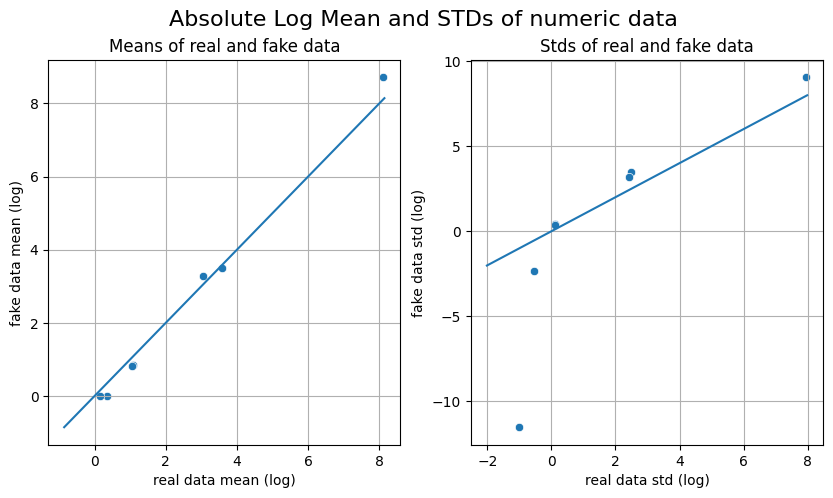

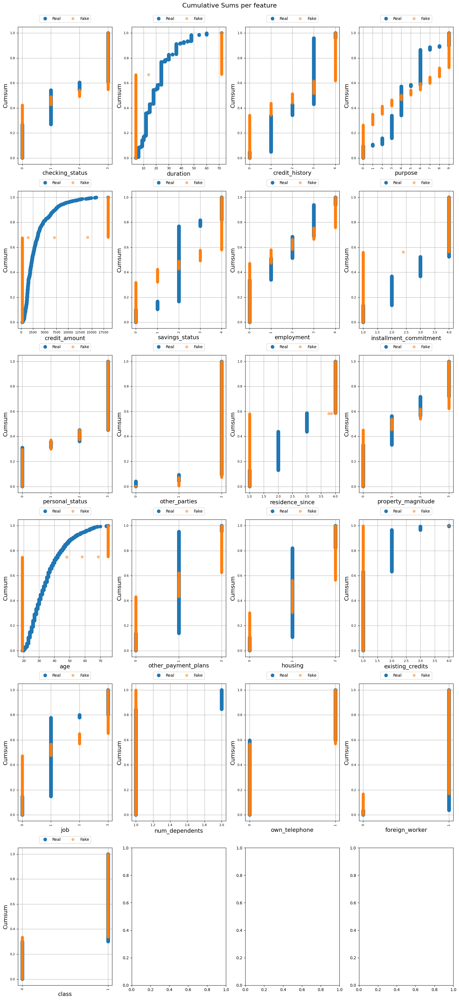

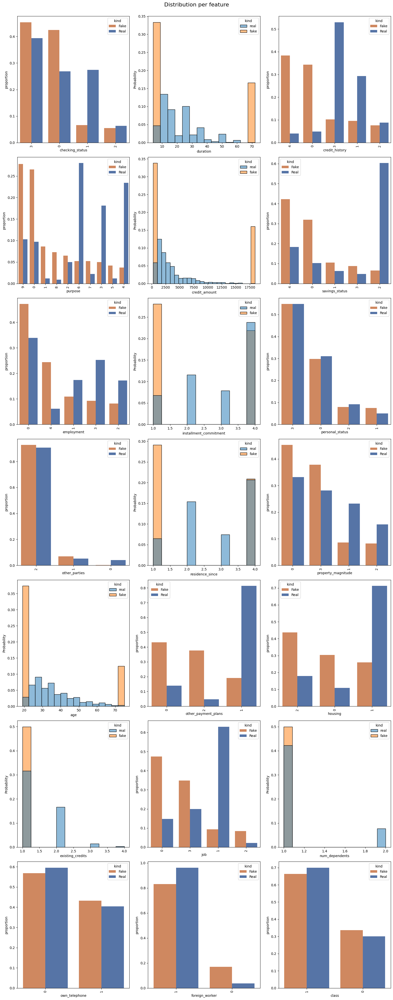

TypeError: Image data of dtype object cannot be converted to float

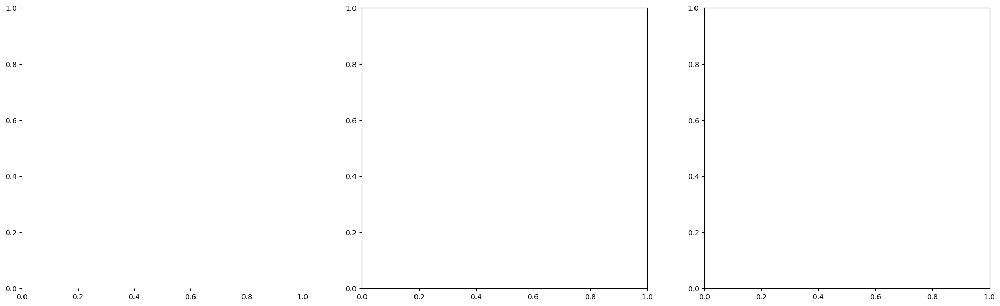

In [22]:
from table_evaluator import TableEvaluator
table_evaluator1 = TableEvaluator(df, newdf, cat_cols=cat_cols)
table_evaluator1.visual_evaluation()

## SYNTHPOP 

In [23]:
pip install py-synthpop

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: C:\Users\arnab\AppData\Local\Programs\Python\Python310\python.exe -m pip install --upgrade pip


In [24]:
import numpy as np
import pandas as pd
real_data=pd.read_csv('UCI_Credit_Card.csv')
real_data

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,220000.0,1,3,1,39,0,0,0,0,...,88004.0,31237.0,15980.0,8500.0,20000.0,5003.0,3047.0,5000.0,1000.0,0
29996,29997,150000.0,1,3,2,43,-1,-1,-1,-1,...,8979.0,5190.0,0.0,1837.0,3526.0,8998.0,129.0,0.0,0.0,0
29997,29998,30000.0,1,2,2,37,4,3,2,-1,...,20878.0,20582.0,19357.0,0.0,0.0,22000.0,4200.0,2000.0,3100.0,1
29998,29999,80000.0,1,3,1,41,1,-1,0,0,...,52774.0,11855.0,48944.0,85900.0,3409.0,1178.0,1926.0,52964.0,1804.0,1


In [25]:
real_data= real_data.drop('ID',axis=1)

In [26]:
dtypes ={


        "checking_status": 
            "category"
        ,
        "duration":  "float"
        ,
        "credit_history": "int"
        ,
        "purpose":  "category"
        ,
        "credit_amount": "int"
        ,
        "savings_status":  "category"
        ,
        "employment": "category"
        ,
        "installment_commitment": "int"
        ,
        "personal_status": "category"
        ,
        "other_parties": "category"
        ,
        "residence_since":  "int"
        ,
        "property_magnitude": "category"
        ,
        "age":  "int"
        ,
        "other_payment_plans": "category"
        ,
        "housing":  "category"
        ,
        "existing_credits": "int"
        ,
        "job":  "category"
        ,
        "num_dependents": "int"
        ,
        "own_telephone":  "category"
        ,
        "foreign_worker": "category"
        ,
        "class":  "category"
        
}

In [27]:
dtypes={
    
        "LIMIT_BAL": "float",
    
        "SEX": "category",
    
        "EDUCATION": "category",
    
        "MARRIAGE": "category",
    
        "AGE": "int",
    
        "PAY_0": "int",
    
        "PAY_2": "int",
    
        "PAY_3": "int",
    
        "PAY_4": "int",
    
        "PAY_5": "int",
    
        "PAY_6": "int",
    
        "BILL_AMT1": "int",
    
        "BILL_AMT2": "int",
    
        "BILL_AMT3": "float",
    
        "BILL_AMT4": "float",
    
        "BILL_AMT5": "float",
    
        "BILL_AMT6": "float",
    
        "PAY_AMT1": "float",
    
        "PAY_AMT2": "float",
    
        "PAY_AMT3": "float",
    
        "PAY_AMT4": "float",
    
        "PAY_AMT5": "float",
    
        "PAY_AMT6": "float",
    
        "default.payment.next.month": "category"
        
    

}

In [28]:
cats=real_data[['MARRIAGE','SEX','EDUCATION','default.payment.next.month']]

In [29]:
from sklearn.preprocessing import LabelEncoder
#cats=cats.apply(LabelEncoder().fit_transform)

In [30]:
cats

,MARRIAGE,SEX,EDUCATION,default.payment.next.month
0,1,2,2,1
1,2,2,2,1
2,2,2,2,0
3,1,2,2,0
4,1,1,2,0
...,...,...,...,...
29995,1,1,3,0
29996,2,1,3,0
29997,2,1,2,1
29998,1,1,3,1


In [31]:
real_data[['MARRIAGE','SEX','EDUCATION','default.payment.next.month']]=cats

In [32]:
real_data

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,20000.0,2,2,1,24,2,2,-1,-1,-2,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,120000.0,2,2,2,26,-1,2,0,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,90000.0,2,2,2,34,0,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,50000.0,2,2,1,37,0,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,50000.0,1,2,1,57,-1,0,-1,0,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,220000.0,1,3,1,39,0,0,0,0,0,...,88004.0,31237.0,15980.0,8500.0,20000.0,5003.0,3047.0,5000.0,1000.0,0
29996,150000.0,1,3,2,43,-1,-1,-1,-1,0,...,8979.0,5190.0,0.0,1837.0,3526.0,8998.0,129.0,0.0,0.0,0
29997,30000.0,1,2,2,37,4,3,2,-1,0,...,20878.0,20582.0,19357.0,0.0,0.0,22000.0,4200.0,2000.0,3100.0,1
29998,80000.0,1,3,1,41,1,-1,0,0,0,...,52774.0,11855.0,48944.0,85900.0,3409.0,1178.0,1926.0,52964.0,1804.0,1


In [33]:
 from synthpop import Synthpop
df1=real_data
spop = Synthpop()
spop.fit(df1, dtypes)

C:\Users\arnab\AppData\Local\Programs\Python\Python310\lib\site-packages\synthpop\validator\validator.py:197: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.

C:\Users\arnab\AppData\Local\Programs\Python\Python310\lib\site-packages\synthpop\synthpop.py:73: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



train_LIMIT_BAL
train_SEX
train_EDUCATION
train_MARRIAGE
train_AGE
train_PAY_0
train_PAY_2
train_PAY_3
train_PAY_4
train_PAY_5
train_PAY_6
train_BILL_AMT1
train_BILL_AMT2
train_BILL_AMT3
train_BILL_AMT4
train_BILL_AMT5
train_BILL_AMT6
train_PAY_AMT1
train_PAY_AMT2
train_PAY_AMT3
train_PAY_AMT4
train_PAY_AMT5
train_PAY_AMT6
train_default.payment.next.month


In [34]:
 synth_df = spop.generate(len(df1))

C:\Users\arnab\AppData\Local\Programs\Python\Python310\lib\site-packages\synthpop\synthpop.py:99: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



generate_LIMIT_BAL
generate_SEX
generate_EDUCATION
generate_MARRIAGE
generate_AGE
generate_PAY_0
generate_PAY_2
generate_PAY_3
generate_PAY_4
generate_PAY_5
generate_PAY_6
generate_BILL_AMT1
generate_BILL_AMT2
generate_BILL_AMT3
generate_BILL_AMT4
generate_BILL_AMT5
generate_BILL_AMT6
generate_PAY_AMT1
generate_PAY_AMT2
generate_PAY_AMT3
generate_PAY_AMT4
generate_PAY_AMT5
generate_PAY_AMT6
generate_default.payment.next.month


In [35]:
synth_df

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,70000.0,2,3,2,42,0,0,0,0,0,...,72507.0,73475.0,75161.0,3687.0,3300.0,3005.0,3108.0,3000.0,3000.0,1
1,10000.0,1,2,2,38,0,0,0,0,0,...,10285.0,10570.0,13242.0,1500.0,1200.0,1500.0,1000.0,1000.0,1000.0,0
2,100000.0,2,2,2,63,0,0,0,0,0,...,89898.0,69221.0,63150.0,4268.0,4628.0,4600.0,4000.0,2055.0,2002.0,1
3,300000.0,1,1,2,48,-1,-1,-1,-1,0,...,47258.0,2175.0,1600.0,19891.0,10426.0,48919.0,0.0,1150.0,5002.0,0
4,20000.0,1,2,1,62,0,0,0,0,0,...,19396.0,19607.0,20000.0,1600.0,1735.0,1469.0,700.0,870.0,1100.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,230000.0,2,1,2,43,-1,-1,-1,-2,-1,...,0.0,708.0,362.0,0.0,8959.0,0.0,710.0,401.0,0.0,0
29996,70000.0,2,3,2,67,-1,-1,-1,2,0,...,6469.0,3328.0,4875.0,0.0,5991.0,27.0,16.0,69.0,650.0,0
29997,380000.0,1,2,1,39,0,0,0,0,0,...,34917.0,1082.0,62320.0,1459.0,1777.0,5153.0,0.0,66000.0,10744.0,0
29998,290000.0,2,1,2,46,-2,-2,-2,-2,-2,...,79227.0,37422.0,0.0,89187.0,18295.0,81414.0,38780.0,0.0,52876.0,0


In [36]:
spop.method

LIMIT_BAL                     sample
SEX                             cart
EDUCATION                       cart
MARRIAGE                        cart
AGE                             cart
PAY_0                           cart
PAY_2                           cart
PAY_3                           cart
PAY_4                           cart
PAY_5                           cart
PAY_6                           cart
BILL_AMT1                       cart
BILL_AMT2                       cart
BILL_AMT3                       cart
BILL_AMT4                       cart
BILL_AMT5                       cart
BILL_AMT6                       cart
PAY_AMT1                        cart
PAY_AMT2                        cart
PAY_AMT3                        cart
PAY_AMT4                        cart
PAY_AMT5                        cart
PAY_AMT6                        cart
default.payment.next.month      cart
dtype: object

In [37]:
spop.predictor_matrix

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
LIMIT_BAL,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
SEX,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
EDUCATION,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MARRIAGE,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AGE,1,1,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
PAY_0,1,1,1,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
PAY_2,1,1,1,1,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
PAY_3,1,1,1,1,1,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
PAY_4,1,1,1,1,1,1,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
PAY_5,1,1,1,1,1,1,1,1,1,0,...,0,0,0,0,0,0,0,0,0,0


In [38]:
#metadata:
import sdv
from sdv.metadata import SingleTableMetadata
metadata = SingleTableMetadata.load_from_json(
    filepath='mtd.json') # loading the metadata
metadata

{
    "columns": {
        "LIMIT_BAL": {
            "sdtype": "numerical",
            "computer_representation": "Float"
        },
        "SEX": {
            "sdtype": "categorical"
        },
        "EDUCATION": {
            "sdtype": "categorical"
        },
        "MARRIAGE": {
            "sdtype": "categorical"
        },
        "AGE": {
            "sdtype": "numerical",
            "computer_representation": "Int64"
        },
        "PAY_0": {
            "sdtype": "numerical",
            "computer_representation": "Int64"
        },
        "PAY_2": {
            "sdtype": "numerical",
            "computer_representation": "Int64"
        },
        "PAY_3": {
            "sdtype": "numerical",
            "computer_representation": "Int64"
        },
        "PAY_4": {
            "sdtype": "numerical",
            "computer_representation": "Int64"
        },
        "PAY_5": {
            "sdtype": "numerical",
            "computer_representation": "Int64"
   

In [39]:
from sdv.evaluation.single_table import evaluate_quality

quality_report = evaluate_quality(
    real_data,
    synth_df,
    metadata
)

Creating report: 100%|███████████████████████████████████████████████████████████████████| 4/4 [00:04<00:00,  1.19s/it]



Overall Quality Score: 95.88%

Properties:
Column Shapes: 95.05%
Column Pair Trends: 96.71%


In [40]:
fig=quality_report.get_visualization(property_name='Column Shapes')
fig.show()

In [41]:
quality_report.get_details(property_name='Column Shapes')

,Column,Metric,Quality Score
0,LIMIT_BAL,KSComplement,0.997900
1,AGE,KSComplement,0.644100
2,PAY_0,KSComplement,0.965400
3,PAY_2,KSComplement,0.961467
4,PAY_3,KSComplement,0.958033
5,PAY_4,KSComplement,0.949733
6,PAY_5,KSComplement,0.951633
7,PAY_6,KSComplement,0.950700
8,BILL_AMT1,KSComplement,0.965800
9,BILL_AMT2,KSComplement,0.964200


In [42]:
from table_evaluator import TableEvaluator
table_evaluator = TableEvaluator(df1, synth_df, cat_cols=cats)
table_evaluator.visual_evaluation()

ValueError: Cannot index with multidimensional key

In [43]:
fig = quality_report.get_visualization(property_name='Column Pair Trends')
fig.show()

In [25]:
table_evaluator.evaluate(target_col='class')

NameError: name 'table_evaluator' is not defined

In [26]:
import nbsynthetic.data
from nbsynthetic.statistics import plot_histograms
plot_histograms(df1, synth_df)

In [27]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error

X = df1.drop(columns=['class'])
y = df1['class']
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.33, random_state=42
    )


est = GradientBoostingRegressor(
    n_estimators=100, 
    learning_rate=0.1, 
    max_depth=1, 
    random_state=42,
    loss='squared_error'
    ).fit(X_train, y_train)


y_predict = est.predict(X_test)
print(f'Mean Squared Error original data = {mean_squared_error(y_test, y_predict):.3f}')
     

KeyError: "['class'] not found in axis"

In [ ]:
import plotly.express as px
fig = px.scatter(x=y_test, y=y_predict)
fig.add_scatter(x=[0,1.7], y=[0,1.7])
fig.update_xaxes(title='y test', range=[0, 1.7])
fig.update_yaxes(title='original y predict', range=[0, 1.7])
fig.update_layout(
    showlegend=False, 
    title_text=f"Algorithm trained and tested with original data. class={mean_squared_error(y_test, y_predict):.3f}"
    )
fig.show()

In [28]:

X = synth_df.drop(columns=['class'])
y = synth_df['class']
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.33, random_state=0
    )
est = GradientBoostingRegressor(
    n_estimators=100, 
    learning_rate=0.1, 
    max_depth=1, 
    random_state=42,
    loss='squared_error'
    ).fit(X_train, y_train)
    
y_pred = est.predict(X_test)
print(f'Mean Squared Error synthetic data = {mean_squared_error(y_test, y_pred):.3f}')

KeyError: "['class'] not found in axis"

In [29]:
import plotly.express as px
fig = px.scatter(x=y_test, y=y_pred)
fig.add_scatter(x=[0,1.7], y=[0,1.7])
fig.update_xaxes(title='synthetic y test', range=[0, 1.7])
fig.update_yaxes(title='y predict', range=[0, 1.7])
fig.update_layout(
    showlegend=False, 
    title_text=f"Algorithm trained and tested with syntehtic data.class MSE={mean_squared_error(y_test, y_pred):.3f}"
    )
fig.show()

NameError: name 'y_test' is not defined

In [30]:
X_train = synth_df.drop(columns=['class'])
y_train = synth_df['class']
X_test = df.drop(columns=['class'])
y_test = df['class']
est = GradientBoostingRegressor(
    n_estimators=100, 
    learning_rate=0.1, 
    max_depth=1, 
    random_state=42,
    loss='squared_error'
    ).fit(X_train, y_train)
y_pred = est.predict(X_test)
print(f'Mean Squared Error cross data = {mean_squared_error(y_test, y_pred):.3f}')

KeyError: "['class'] not found in axis"

In [31]:
spop.visit_sequence


LIMIT_BAL                      0
SEX                            1
EDUCATION                      2
MARRIAGE                       3
AGE                            4
PAY_0                          5
PAY_2                          6
PAY_3                          7
PAY_4                          8
PAY_5                          9
PAY_6                         10
BILL_AMT1                     11
BILL_AMT2                     12
BILL_AMT3                     13
BILL_AMT4                     14
BILL_AMT5                     15
BILL_AMT6                     16
PAY_AMT1                      17
PAY_AMT2                      18
PAY_AMT3                      19
PAY_AMT4                      20
PAY_AMT5                      21
PAY_AMT6                      22
default.payment.next.month    23
dtype: int64

In [32]:
from sdv.evaluation.single_table import get_column_plot


get_column_plot(
    real_data=real_data,
    synthetic_data=synth_df,
    column_name='PAY_AMT4',
    metadata=metadata
)

In [33]:
#DIAGNOSTIC REPORT
#synthpop

from sdv.evaluation.single_table import run_diagnostic

diagnostic_report = run_diagnostic(
    real_data=real_data,
    synthetic_data=synth_df,
    metadata=metadata)

Creating report: 100%|███████████████████████████████████████████████████████████████████| 4/4 [06:03<00:00, 90.80s/it]


DiagnosticResults:

SUCCESS:
✓ The synthetic data covers over 90% of the categories present in the real data
✓ Over 90% of the synthetic rows are not copies of the real data
✓ The synthetic data follows over 90% of the min/max boundaries set by the real data

! The synthetic data is missing more than 10% of the numerical ranges present in the real data


In [34]:
#privacy score
from sdmetrics.single_table import CategoricalZeroCAP

score = CategoricalZeroCAP.compute(
    real_data=real_data,
    synthetic_data=synth_df,
    key_fields=['PAY_0', 'SEX','MARRIAGE'],
    sensitive_fields=['EDUCATION'])
score

0.628173101960791

In [36]:
diagnostic_report.get_properties()

{'Coverage': 0.9156591783727009, 'Synthesis': 0.9988, 'Boundaries': 1.0}

In [37]:
diagnostic_report.get_details(property_name='Synthesis')

,Metric,Diagnostic Score,Num Matched Rows,Num New Rows
0,NewRowSynthesis,0.9988,12,9988


In [35]:
synth_df.to_csv('UCI_synthpop.scv')

In [37]:
synth_df

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,350000.0,0,1,2,35,1,-2,-2,-2,-2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
1,260000.0,1,2,1,30,-1,-1,-1,0,-1,...,43546.0,2398.0,5525.0,5588.0,5000.0,39000.0,2456.0,5584.0,5574.0,0
2,360000.0,1,3,2,41,-2,-2,-2,-2,-2,...,500.0,0.0,389.0,4107.0,311.0,505.0,0.0,390.0,590.0,0
3,120000.0,1,1,2,45,1,-1,-1,-1,0,...,4383.0,80.0,150.0,550.0,13337.0,4562.0,1.0,150.0,2379.0,0
4,50000.0,1,1,2,37,-1,-1,-1,-1,-1,...,303.0,325.0,1390.0,0.0,3421.0,302.0,325.0,2620.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,270000.0,1,2,2,40,-2,-2,-2,-2,-1,...,9140.0,53328.0,103065.0,2681.0,21849.0,9203.0,51800.0,54000.0,63750.0,0
29996,80000.0,1,1,2,45,0,0,0,0,0,...,67722.0,70970.0,69397.0,4000.0,5017.0,8000.0,6000.0,7000.0,3000.0,0
29997,70000.0,0,2,3,39,1,2,2,0,0,...,27870.0,28039.0,28043.0,3100.0,0.0,1168.0,944.0,2000.0,857.0,1
29998,360000.0,0,1,1,39,-1,-1,-1,-2,-2,...,0.0,0.0,0.0,2816.0,0.0,0.0,0.0,0.0,259.0,0


In [44]:
import hybrid

In [45]:
gc= pd.read_csv('uci_gc.csv')
ct=pd.read_csv('uci_synthetic_ctgan.csv')
gc= gc.drop('Unnamed: 0',axis=1)
ct=ct.drop('Unnamed: 0',axis=1)
gc= gc.drop('ID',axis=1)
ct=ct.drop('ID',axis=1)
gc

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,285981.0,1,2,2,39,0,0,0,0,0,...,97715.0,89899.0,85980.0,10138.0,32462.0,8993.0,3968.0,17668.0,9932.0,0
1,189419.0,2,1,1,27,2,3,1,0,1,...,256090.0,178251.0,155121.0,14228.0,8040.0,21782.0,1970.0,2794.0,8469.0,0
2,135829.0,1,1,1,35,0,-1,-1,0,0,...,-13187.0,5019.0,1019.0,8537.0,3409.0,31.0,302.0,2663.0,9111.0,0
3,135309.0,1,5,1,39,0,-1,-2,-2,-1,...,53638.0,15393.0,35038.0,90.0,215.0,1883.0,595.0,0.0,379.0,0
4,98488.0,2,2,1,36,-1,0,0,1,1,...,43410.0,81111.0,67985.0,659.0,1969.0,194.0,503.0,74.0,29.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,107710.0,1,2,2,23,0,0,0,0,0,...,-13373.0,-11731.0,8602.0,7556.0,5679.0,12221.0,4589.0,6842.0,4106.0,0
29996,586637.0,2,1,2,33,-2,-1,-1,-1,0,...,134260.0,127181.0,112572.0,6969.0,11950.0,2562.0,19699.0,1104.0,21727.0,0
29997,113182.0,1,2,2,23,-1,-1,-1,-1,-1,...,-40223.0,-36241.0,-29662.0,3620.0,118.0,627.0,124.0,0.0,1074.0,0
29998,188094.0,1,1,2,39,0,0,-1,-1,-1,...,-3134.0,-5651.0,-14658.0,7507.0,6827.0,3262.0,1130.0,5167.0,1151.0,0


In [46]:
#real_data=pd.read_csv('UCI_Credit_Card.csv')
#real_data= real_data.drop('ID',axis=1)
hyb1=hybrid.hybrid(real_data,gc,ct,metadata)

First dataset quality score:


Creating report: 100%|███████████████████████████████████████████████████████████████████| 4/4 [00:04<00:00,  1.10s/it]



Overall Quality Score: 88.54%

Properties:
Column Shapes: 84.95%
Column Pair Trends: 92.13%
Second dataset quality score:


Creating report: 100%|███████████████████████████████████████████████████████████████████| 4/4 [00:05<00:00,  1.26s/it]



Overall Quality Score: 93.26%

Properties:
Column Shapes: 91.01%
Column Pair Trends: 95.52%
--------------First dataset report:-------------
                        Column        Metric  Quality Score
0                    LIMIT_BAL  KSComplement       0.926167
1                          AGE  KSComplement       0.982433
2                        PAY_0  KSComplement       0.926533
3                        PAY_2  KSComplement       0.878567
4                        PAY_3  KSComplement       0.878200
5                        PAY_4  KSComplement       0.874467
6                        PAY_5  KSComplement       0.869500
7                        PAY_6  KSComplement       0.879200
8                    BILL_AMT1  KSComplement       0.761100
9                    BILL_AMT2  KSComplement       0.814767
10                   BILL_AMT3  KSComplement       0.777700
11                   BILL_AMT4  KSComplement       0.774867
12                   BILL_AMT5  KSComplement       0.793533
13                

Creating report: 100%|███████████████████████████████████████████████████████████████████| 4/4 [00:06<00:00,  1.55s/it]



Overall Quality Score: 93.63%

Properties:
Column Shapes: 91.75%
Column Pair Trends: 95.51%
Hybrid dataset report:
                        Column        Metric  Quality Score
0                    LIMIT_BAL  KSComplement       0.926167
1                          AGE  KSComplement       0.982433
2                        PAY_0  KSComplement       0.960833
3                        PAY_2  KSComplement       0.977800
4                        PAY_3  KSComplement       0.973667
5                        PAY_4  KSComplement       0.974133
6                        PAY_5  KSComplement       0.971633
7                        PAY_6  KSComplement       0.974333
8                    BILL_AMT1  KSComplement       0.879800
9                    BILL_AMT2  KSComplement       0.894133
10                   BILL_AMT3  KSComplement       0.817633
11                   BILL_AMT4  KSComplement       0.916367
12                   BILL_AMT5  KSComplement       0.920733
13                   BILL_AMT6  KSComplement

In [47]:
hyb2=hybrid.hybrid(real_data,hyb1,synth_df,metadata)

First dataset quality score:


Creating report: 100%|███████████████████████████████████████████████████████████████████| 4/4 [00:04<00:00,  1.21s/it]



Overall Quality Score: 93.63%

Properties:
Column Shapes: 91.75%
Column Pair Trends: 95.51%
Second dataset quality score:


Creating report: 100%|███████████████████████████████████████████████████████████████████| 4/4 [00:04<00:00,  1.10s/it]



Overall Quality Score: 95.88%

Properties:
Column Shapes: 95.05%
Column Pair Trends: 96.71%
--------------First dataset report:-------------
                        Column        Metric  Quality Score
0                    LIMIT_BAL  KSComplement       0.926167
1                          AGE  KSComplement       0.982433
2                        PAY_0  KSComplement       0.960833
3                        PAY_2  KSComplement       0.977800
4                        PAY_3  KSComplement       0.973667
5                        PAY_4  KSComplement       0.974133
6                        PAY_5  KSComplement       0.971633
7                        PAY_6  KSComplement       0.974333
8                    BILL_AMT1  KSComplement       0.879800
9                    BILL_AMT2  KSComplement       0.894133
10                   BILL_AMT3  KSComplement       0.817633
11                   BILL_AMT4  KSComplement       0.916367
12                   BILL_AMT5  KSComplement       0.920733
13                

Creating report: 100%|███████████████████████████████████████████████████████████████████| 4/4 [00:06<00:00,  1.68s/it]



Overall Quality Score: 96.24%

Properties:
Column Shapes: 97.12%
Column Pair Trends: 95.35%
Hybrid dataset report:
                        Column        Metric  Quality Score
0                    LIMIT_BAL  KSComplement       0.997900
1                          AGE  KSComplement       0.982433
2                        PAY_0  KSComplement       0.965400
3                        PAY_2  KSComplement       0.977800
4                        PAY_3  KSComplement       0.973667
5                        PAY_4  KSComplement       0.974133
6                        PAY_5  KSComplement       0.971633
7                        PAY_6  KSComplement       0.974333
8                    BILL_AMT1  KSComplement       0.965800
9                    BILL_AMT2  KSComplement       0.964200
10                   BILL_AMT3  KSComplement       0.965733
11                   BILL_AMT4  KSComplement       0.962533
12                   BILL_AMT5  KSComplement       0.959600
13                   BILL_AMT6  KSComplement

In [48]:
from sdv.evaluation.single_table import evaluate_quality

quality_report = evaluate_quality(
    real_data,
    synth_df,
    metadata
)

Creating report: 100%|███████████████████████████████████████████████████████████████████| 4/4 [00:04<00:00,  1.18s/it]



Overall Quality Score: 95.88%

Properties:
Column Shapes: 95.05%
Column Pair Trends: 96.71%
